# Executive Summary

## Objective
This analysis provides a comprehensive, data-driven examination of the U.S. economy from 2000 to present, with particular focus on the post-pandemic period (2022-2025). By leveraging multiple economic indicators, historical patterns, and deep-dive analyses into consumer financial health, we aim to identify the mechanisms driving current economic performance and assess the sustainability of consumer spending in an environment of heightened financial stress.

## Key Findings

### The Central Economic Paradox
The analysis reveals a striking disconnect between traditional recession indicators and consumer financial health:
- **Traditional indicators remain benign**: Unemployment at 4.3%, no Sahm Rule signal (0.13 gap vs. 0.5 threshold), normalized yield curve
- **Consumer stress is elevated**: Sentiment at 58.2 (vs. 82.3 average), savings depleted to 4.6% (below 5.2% pre-pandemic), credit accumulation accelerating
- **The mechanism**: Consumers maintained spending through the 25-month negative real wage period (April 2021 - May 2023) by depleting pandemic savings and accumulating debt

### Labor Market: Strong but Cooling
- **Unemployment remains historically low at 4.3%**, well below the 25-year average of 5.7%
- The post-pandemic period (2022-present) shows **remarkable stability with unemployment averaging just 3.8%** and minimal volatility (0.27% standard deviation)
- **No Sahm Rule recession signal detected** - current gap of 0.13 is well below the 0.5 threshold (only 27% of the way there)
- **Job openings declining** from 12,000k+ peak to 7,227k, but still elevated vs. pre-pandemic
- **Quits-to-layoffs ratio at 1.79** indicates cooling worker confidence from 2.24 post-pandemic peak
- **Labor force participation at 62.3%** remains 1.0 percentage point below pre-pandemic levels

### Inflation: Normalized but Scars Remain
- **Current inflation at 2.94%** has declined significantly from the 9.0% peak in June 2022
- Inflation is **approaching the Fed's 2% target**, with recent trends showing continued moderation
- Market-based inflation expectations remain anchored: **5-year breakeven at 2.38%** and **10-year at 2.34%**
- **Housing inflation remains elevated at 3.97%**, the primary driver of persistent above-target inflation
- **Energy inflation has normalized to 0.39%** after being the most volatile category

### The Real Wage Crisis (April 2021 - May 2023)
- **25 consecutive months of negative real wage growth** - the longest period in the dataset
- **Average real wage loss of -1.88%** with a maximum loss of -3.60%
- This sustained erosion of purchasing power forced households to make critical financial decisions
- **Real wages only recently turned positive**, but the damage to household finances persists

### Consumer Financial Health: The Great Drawdown
**Phase 1 (2020-2021): Pandemic Buffer**
- Personal savings rate peaked at **31.8% in April 2020** due to stimulus and reduced spending
- Households built unprecedented financial cushions

**Phase 2 (2021-2023): Savings Depletion**
- Savings rate fell from 31.8% peak to **current 4.6%** - below both long-term average (5.7%) and pre-pandemic (5.2%)
- **Consumer credit accelerated** as savings were exhausted
- **Revolving credit (credit cards) at 5.69% of income** vs. 7.46% historical average - showing households have borrowed but not yet maxed out

### Financial Stress Indicators: Yellow Lights, Not Red
**Metrics Below Crisis Levels (Green):**
- Credit card delinquency: **3.05% vs. 6.77%** in 2008 crisis
- Auto loan delinquency: **1.79% vs. 10.40%** in 2008 crisis
- Credit card charge-offs: **2.87% vs. 6.61%** in 2008 crisis
- Debt service ratio: **11.25% vs. 13.0%** crisis threshold

**Concerning Trends (Yellow):**
- **All stress metrics trending upward** from recent lows
- **Savings buffer largely depleted** with limited room for further drawdown
- **Credit growth continuing** despite return to positive real wages
- **Direction of change more concerning than absolute levels**

**Important Data Limitation:**
- **Buy Now Pay Later (BNPL) debt not fully captured** in traditional credit statistics
- BNPL exploded during 2021-2023 period, suggesting actual household debt may be significantly higher than measured

### Yield Curve Dynamics
- The **10Y-2Y yield curve inversion that lasted 793 days (July 2022 - August 2024)** - the longest in history - has now normalized
- Historical analysis shows **90.9% of inversions preceded recessions**, with a median lead time of 20 months
- Current normalization suggests the immediate recession risk window may be closing, though the unprecedented duration adds uncertainty

### Mixed Sectoral Performance
- **Leisure & Hospitality has fully recovered**, up 95.5% from pandemic lows
- **Government employment at record highs** (23,568k), up 3.1% since pre-pandemic
- **Manufacturing remains below pre-pandemic levels** (-0.2%), showing persistent weakness
- **Professional Services down 1.1% since AI Era start**, indicating potential white-collar softness

### Consumer Sentiment: The Disconnect Explained
- **Consumer sentiment at 58.2** is significantly below the 25-year average of 82.3
- Current sentiment is **closer to recession levels than expansion levels**, despite strong employment data
- **The explanation**: Businesses see strong sales (consumers are spending), but consumers feel stressed (they're depleting savings and accumulating debt to maintain that spending)
- This is not a contradiction - it's two sides of the same coin

## Critical Assessment: Sustainability Questions

**The U.S. economy is not in crisis, but it is in a vulnerable state.**

**Reasons for Concern:**
1. **Savings buffer largely depleted** (4.6% vs. 5.2% pre-pandemic) with limited room for further drawdown
2. **Limited capacity for additional credit expansion** without triggering stress
3. **Consumer sentiment suggests households feel financially vulnerable** despite positive real wage growth
4. **Multiple stress indicators trending in wrong direction** even as traditional recession indicators remain benign
5. **Margin for error has narrowed considerably** - any shock could quickly transform yellow lights to red

**Reasons for Optimism:**
1. **Real wages have finally turned positive** after 25 months of erosion
2. **Inflation moderating toward Fed target** reduces pressure on household budgets
3. **Stress metrics still well below crisis levels** with significant distance to 2008 thresholds
4. **Labor market remains strong** with low unemployment and elevated job openings
5. **Time for recovery** - if real wage growth continues, households can rebuild buffers

**The Verdict:**
The resilience of consumer spending should not be mistaken for consumer financial strength. American households have maintained consumption by drawing down savings and taking on debt—a strategy that works in the short term but cannot continue indefinitely. The next 12-18 months will be critical in determining whether real wage growth can rebuild household financial buffers before the next economic shock arrives.

**_See Appendix for overview of data and analytic techniques_**

# Notebook Setup

## Notebook Imports

In [1]:
import os
import pandas as pd
from datetime import datetime
from dotenv import load_dotenv
from fredapi import Fred

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from IPython.display import display, Markdown

from datetime import datetime


## Data Infrastructure: FRED API Setup & Utilities

This section establishes the connection to the Federal Reserve Economic Data (FRED) API and defines helper functions for retrieving and processing economic time series data throughout the analysis.

In [2]:
# ==== FRED Utilities Setup =====================================================

# --- Initialize FRED connection (run once per session) ---
def init_fred():
    """Load API key from .env and initialize Fred client."""
    load_dotenv()
    api_key = os.getenv("FRED_API_KEY")
    if not api_key:
        raise ValueError("FRED_API_KEY not found. Make sure your .env file exists and contains it.")
    return Fred(api_key=api_key)

fred = init_fred()


# --- Helper function to fetch & tidy FRED series ---
def get_fred_series(series_ids, freq="M", add_recession=False, fill_method="ffill", start_date="2000-01-01"):
    """
    Fetch one or multiple FRED series and return as a tidy DataFrame.
    
    Parameters
    ----------
    series_ids : str or list
        One or more FRED series IDs, e.g. 'UNRATE' or ['DGS10', 'DGS2'].
    freq : {'D', 'M', 'Q'}
        Desired frequency: Daily, Monthly, or Quarterly.
    add_recession : bool
        Whether to include the NBER recession indicator (USREC).
    fill_method : {'ffill', None}
        How to handle missing values when upsampling to higher frequency.
    start_date : str
        Start date for filtering data (default: '2000-01-01').
    
    Returns
    -------
    df : pandas.DataFrame
        DataFrame indexed by date, with one column per series.
    """
    if isinstance(series_ids, str):
        series_ids = [series_ids]

    data = {}
    for sid in series_ids:
        s = fred.get_series(sid, observation_start=start_date)
        s.index = pd.to_datetime(s.index)
        data[sid] = s

    df = pd.DataFrame(data)

    # Resample to chosen frequency if needed
    if freq.upper() == "D":
        full_index = pd.date_range(df.index.min(), df.index.max(), freq="B")  # business days
        df = df.reindex(full_index)
        if fill_method == "ffill":
            df = df.ffill()
    elif freq.upper() == "M":
        df = df.resample("MS").mean()
    elif freq.upper() == "Q":
        df = df.resample("QS").mean()

    # Optionally add NBER recession flag
    if add_recession:
        rec = fred.get_series("USREC", observation_start=start_date).asfreq("MS")
        rec.index = pd.to_datetime(rec.index)
        if freq.upper() == "D":
            rec = rec.resample("B").ffill()
        elif freq.upper() == "Q":
            rec = rec.resample("QS").mean()
        df["USREC"] = rec.reindex(df.index, method="ffill").fillna(0).astype(int)

    df.index.name = "Date"
    return df


# ==== STANDARDIZED TIME PERIOD DEFINITIONS ====================================
# Single source of truth for all period-based analysis

# Standard analysis periods aligned with economic narrative
STANDARD_PERIODS = {
    'Full Period': {
        'start': pd.Timestamp('2000-01-01'),
        'end': pd.Timestamp('2025-08-01'),
        'label': 'Full Period (2000-Present)',
        'description': 'Complete historical dataset'
    },
    'Pre-Pandemic': {
        'start': pd.Timestamp('2000-01-01'),
        'end': pd.Timestamp('2020-02-01'),
        'label': 'Pre-Pandemic (2000-Feb 2020)',
        'description': 'Baseline period before COVID-19'
    },
    'Pandemic': {
        'start': pd.Timestamp('2020-03-01'),
        'end': pd.Timestamp('2021-12-31'),
        'label': 'Pandemic Era (Mar 2020-Dec 2021)',
        'description': 'COVID-19 crisis: unemployment spike and savings surge'
    },
    'Post-Pandemic': {
        'start': pd.Timestamp('2022-01-01'),
        'end': pd.Timestamp('2022-10-31'),
        'label': 'Post-Pandemic (Jan 2022-Oct 2022)',
        'description': 'Inflation surge and real wage erosion'
    },
    'AI Era': {
        'start': pd.Timestamp('2022-11-01'),
        'end': pd.Timestamp('2025-08-01'),
        'label': 'AI Era (Nov 2022-Present)',
        'description': 'ChatGPT release and AI adoption impact on labor markets'
    },
    'Detailed Analysis': {
        'start': pd.Timestamp('2023-01-01'),
        'end': pd.Timestamp('2025-08-01'),
        'label': 'Detailed Analysis (2023-Present)',
        'description': 'Recent period for granular analysis of current trends'
    }
}

# Key reference dates for annotations and analysis
REFERENCE_DATES = {
    'pandemic_start': pd.Timestamp('2020-03-01'),
    'pandemic_end': pd.Timestamp('2021-12-31'),
    'post_pandemic_start': pd.Timestamp('2022-01-01'),
    'ai_era_start': pd.Timestamp('2022-11-01'),
    'chatgpt_release': pd.Timestamp('2022-11-30'),
    'negative_real_wage_start': pd.Timestamp('2021-04-01'),
    'negative_real_wage_end': pd.Timestamp('2023-05-01')
}

# Helper functions for period-based analysis
def get_period_range(period_key):
    """
    Return (start, end) tuple for a given period key.
    
    Parameters
    ----------
    period_key : str
        One of: 'Full Period', 'Pre-Pandemic', 'Pandemic', 'Post-Pandemic', 'AI Era', 'Detailed Analysis'
    
    Returns
    -------
    tuple
        (start_date, end_date) as pandas Timestamps
    """
    period = STANDARD_PERIODS[period_key]
    return (period['start'], period['end'])

def filter_by_period(df, period_key):
    """
    Filter dataframe to specified period.
    
    Parameters
    ----------
    df : pd.DataFrame or pd.Series
        Data with DatetimeIndex
    period_key : str
        One of: 'Full Period', 'Pre-Pandemic', 'Pandemic', 'Post-Pandemic', 'AI Era', 'Detailed Analysis'
    
    Returns
    -------
    pd.DataFrame or pd.Series
        Filtered data for the specified period
    """
    start, end = get_period_range(period_key)
    return df.loc[start:end]

def calculate_period_stats(series, period_key):
    """
    Calculate summary statistics for a series over a specified period.
    
    Parameters
    ----------
    series : pd.Series
        Time series data with DatetimeIndex
    period_key : str
        One of: 'Full Period', 'Pre-Pandemic', 'Pandemic', 'Post-Pandemic', 'AI Era', 'Detailed Analysis'
    
    Returns
    -------
    dict
        Dictionary with keys: 'mean', 'min', 'max', 'std', 'current', 'months'
    """
    period_data = filter_by_period(series, period_key)
    
    return {
        'mean': period_data.mean(),
        'min': period_data.min(),
        'max': period_data.max(),
        'std': period_data.std(),
        'current': period_data.iloc[-1] if len(period_data) > 0 else None,
        'months': len(period_data)
    }

def get_all_period_stats(series, periods=None):
    """
    Calculate statistics for all standard periods.
    
    Parameters
    ----------
    series : pd.Series
        Time series data with DatetimeIndex
    periods : list, optional
        List of period keys to analyze. If None, uses all standard periods.
    
    Returns
    -------
    pd.DataFrame
        DataFrame with statistics for each period
    """
    if periods is None:
        periods = ['Full Period', 'Pre-Pandemic', 'Pandemic', 'Post-Pandemic', 'AI Era']
    
    stats_list = []
    for period_key in periods:
        period = STANDARD_PERIODS[period_key]
        stats = calculate_period_stats(series, period_key)
        
        stats_list.append({
            'Period': period['label'],
            'Start': period['start'].strftime('%b %Y'),
            'End': period['end'].strftime('%b %Y'),
            'Average': f"{stats['mean']:.1f}%" if stats['mean'] is not None else 'N/A',
            'Minimum': f"{stats['min']:.1f}%" if stats['min'] is not None else 'N/A',
            'Maximum': f"{stats['max']:.1f}%" if stats['max'] is not None else 'N/A',
            'Std Dev': f"{stats['std']:.2f}%" if stats['std'] is not None else 'N/A',
            'Current': f"{stats['current']:.1f}%" if stats['current'] is not None else 'N/A',
            'Months': stats['months']
        })
    
    return pd.DataFrame(stats_list)

# # Print period summary for verification
# print("="*80)
# print("STANDARDIZED TIME PERIOD DEFINITIONS")
# print("="*80)
# for key, period in STANDARD_PERIODS.items():
#     duration_months = (period['end'].year - period['start'].year) * 12 + (period['end'].month - period['start'].month)
#     print(f"\n{period['label']}")
#     print(f"  Start: {period['start'].strftime('%B %Y')}")
#     print(f"  End: {period['end'].strftime('%B %Y')}")
#     print(f"  Duration: {duration_months} months")
#     print(f"  Story: {period['description']}")
# print("="*80)

In [3]:
# Generate timeline table dynamically from STANDARD_PERIODS
timeline_rows = []
for period_key in ['Pre-Pandemic', 'Pandemic', 'Post-Pandemic', 'AI Era']:
    period = STANDARD_PERIODS[period_key]
    
    # Calculate duration
    duration_months = (period['end'].year - period['start'].year) * 12 + (period['end'].month - period['start'].month)
    
    # Format dates
    start_str = period['start'].strftime('%b %Y')
    end_str = period['end'].strftime('%b %Y') if period_key != 'AI Era' else 'Present'
    
    timeline_rows.append(
        f"| **{period_key}** | {start_str} - {end_str} | {duration_months} months | {period['description']} |"
    )

timeline_table = "\n".join([
    "## Timeline Definitions",
    "",
    "| Period | Dates | Duration | Economic Story |",
    "|--------|-------|----------|----------------|"
] + timeline_rows)

display(Markdown(timeline_table))

## Timeline Definitions

| Period | Dates | Duration | Economic Story |
|--------|-------|----------|----------------|
| **Pre-Pandemic** | Jan 2000 - Feb 2020 | 241 months | Baseline period before COVID-19 |
| **Pandemic** | Mar 2020 - Dec 2021 | 21 months | COVID-19 crisis: unemployment spike and savings surge |
| **Post-Pandemic** | Jan 2022 - Oct 2022 | 9 months | Inflation surge and real wage erosion |
| **AI Era** | Nov 2022 - Present | 33 months | ChatGPT release and AI adoption impact on labor markets |

# Section 1: Recession Risk Assessment

The U.S. economy has experienced six recessions since 1976, each preceded by distinct warning signals in financial markets and labor data. This section examines two powerful recession indicators—the Sahm Rule and yield curve inversions—to assess current recession risk and provide historical context for their predictive accuracy.

## Key Insights

**Current Status: Low Immediate Recession Risk**
- The Sahm Rule gap currently sits at 0.13, well below the 0.5 threshold that has historically signaled recession onset (only 27% of the way there)
- The 10Y-2Y yield curve recently normalized after a historic 783-day inversion (July 2022 - August 2024), the longest since the 1970s
- While yield curve inversions have preceded 90.9% of recessions since 1976 with a median 20-month lead time, the normalization suggests the immediate risk window may be closing

**Historical Context**
- Yield curve inversions have proven remarkably reliable, with only 4 of 44 inversions since 1976 failing to precede a recession
- The Sahm Rule has never produced a false positive—when triggered, a recession has always been underway or imminent
- Lead times between inversion and recession vary widely (3 to 105 months), making precise timing difficult but directional signals clear

---

## Sahm Rule Analysis

The Sahm Rule, developed by economist Claudia Sahm, provides a real-time recession indicator based on unemployment rate dynamics. The rule triggers when the 3-month moving average of the unemployment rate rises by 0.5 percentage points or more above its lowest point in the previous 12 months.

**How It Works:**
- Calculate the 3-month moving average of the unemployment rate
- Identify the minimum 3-month average over the trailing 12 months
- Compute the "Sahm Gap" as the difference between current and minimum values
- A gap ≥0.5 signals that a recession has likely begun

Sahm Rule active now? False
Most recent trigger date: 2024-08-01


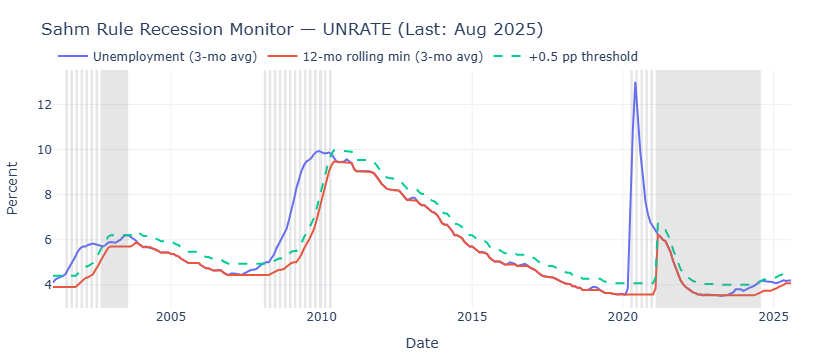


<u>**Understanding the Sahm Rule Chart**</u>

The **gray bands** in the background represent periods when the **Sahm Rule recession signal was active** — that is, when the Sahm gap reached or exceeded 0.5 percentage points.

<u>**What is the Sahm Gap?**</u>

The Sahm gap is calculated as the difference between:
- The **3-month moving average** of the unemployment rate, and
- The **lowest point** of that 3-month average over the prior 12 months

When this gap rises by at least 0.5 percentage points, the Sahm Rule triggers, indicating that the economy may be entering or already in a recession.

<u>**Historical Reliability**</u>

Historically, the Sahm Rule has been a reliable real-time recession indicator. The chart shows several such periods, with the most recent trigger occurring in **August 2024**.


In [4]:
# === Sahm Rule Recession Monitor (using get_fred_series) ===

# 1) Pull monthly unemployment (UNRATE)
u = get_fred_series("UNRATE", freq="M")["UNRATE"].asfreq("MS")

# 2) Compute Sahm components
u_3mma     = u.rolling(3).mean()
u_12m_min  = u_3mma.rolling(12).min()
sahm_gap   = (u_3mma - u_12m_min)
sahm_flag  = sahm_gap >= 0.5

df_sahm = pd.concat(
    [u.rename("unrate"), u_3mma.rename("unrate_3mma"),
     u_12m_min.rename("u_12m_min"), sahm_gap.rename("sahm_gap"),
     sahm_flag.rename("sahm_signal")],
    axis=1
).dropna()

# 3) Current status
signal_active = bool(df_sahm["sahm_signal"].iloc[-1])
trigger_date = df_sahm.index[df_sahm["sahm_signal"]].max() if df_sahm["sahm_signal"].any() else None

print(f"Sahm Rule active now? {signal_active}")
print(f"Most recent trigger date: {trigger_date.date() if trigger_date else '—'}")

# 4) Plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_sahm.index, y=df_sahm["unrate_3mma"], name="Unemployment (3-mo avg)", mode="lines"))
fig.add_trace(go.Scatter(x=df_sahm.index, y=df_sahm["u_12m_min"], name="12-mo rolling min (3-mo avg)", mode="lines"))
fig.add_trace(go.Scatter(x=df_sahm.index, y=df_sahm["u_12m_min"] + 0.5, name="+0.5 pp threshold", mode="lines", line=dict(dash="dash")))

# Shade Sahm active periods
sig = df_sahm["sahm_signal"]
edges = sig.ne(sig.shift()).loc[sig].index.tolist()
if sig.iloc[-1]:
    edges.append(df_sahm.index[-1])
for start, end in zip(edges[::2], edges[1::2]):
    fig.add_vrect(x0=start, x1=end, fillcolor="gray", opacity=0.2, line_width=0)

fig.update_layout(
    title=f"Sahm Rule Recession Monitor — UNRATE (Last: {df_sahm.index[-1].strftime('%b %Y')})",
    xaxis_title="Date",
    yaxis_title="Percent",
    template="plotly_white",
    legend=dict(orientation="h", y=1.12),
    margin=dict(l=50, r=30, t=70, b=40),
)
fig.show()

# Optional: export static for README
# fig.write_image("assets/sahm_rule_latest.png", width=1100, height=520, scale=2)

explanation = """
<u>**Understanding the Sahm Rule Chart**</u>

The **gray bands** in the background represent periods when the **Sahm Rule recession signal was active** — that is, when the Sahm gap reached or exceeded 0.5 percentage points.

<u>**What is the Sahm Gap?**</u>

The Sahm gap is calculated as the difference between:
- The **3-month moving average** of the unemployment rate, and
- The **lowest point** of that 3-month average over the prior 12 months

When this gap rises by at least 0.5 percentage points, the Sahm Rule triggers, indicating that the economy may be entering or already in a recession.

<u>**Historical Reliability**</u>

Historically, the Sahm Rule has been a reliable real-time recession indicator. The chart shows several such periods, with the most recent trigger occurring in **August 2024**.
"""

display(Markdown(explanation))

In [5]:
# Current Sahm Gap Analysis
current_sahm_gap = sahm_gap.iloc[-1]
threshold = 0.5
distance_to_threshold = threshold - current_sahm_gap
percent_of_threshold = (current_sahm_gap / threshold) * 100

print("=" * 50)
print("CURRENT SAHM RULE STATUS")
print("=" * 50)
print(f"Current Sahm Gap: {current_sahm_gap:.3f} percentage points")
print(f"Trigger Threshold: {threshold:.1f} percentage points")
print(f"Distance to Threshold: {distance_to_threshold:.3f} percentage points")
print(f"Current Gap is {percent_of_threshold:.1f}% of threshold")
print("\nStatus:", "🔴 TRIGGERED" if current_sahm_gap >= threshold else "🟢 Not Triggered")
print("=" * 50)

CURRENT SAHM RULE STATUS
Current Sahm Gap: 0.133 percentage points
Trigger Threshold: 0.5 percentage points
Distance to Threshold: 0.367 percentage points
Current Gap is 26.7% of threshold

Status: 🟢 Not Triggered


## Yield Curve Inversion Analysis

The yield curve—specifically the spread between 10-year and 2-year Treasury rates—has served as one of the most reliable recession predictors in modern economic history. When short-term rates exceed long-term rates (an "inversion"), it signals that bond markets expect economic weakness ahead, typically prompting the Federal Reserve to cut rates.

**How It Works:**
- Track the daily spread between 10-year and 2-year Treasury yields
- An inversion occurs when the 2-year yield exceeds the 10-year yield (spread < 0)
- Historical analysis measures the time between inversion and subsequent recession
- The indicator's predictive power comes from its reflection of market expectations

In [6]:
# === Yield Curve Dashboard: 10Y-2Y Spread Analysis ===

# Fetch daily yield data for more granular analysis
df_yields_daily = get_fred_series(["DGS10", "DGS2"], freq="D", add_recession=True, start_date="1976-06-01")

# Calculate the spread
df_yields_daily['spread_10y_2y'] = df_yields_daily['DGS10'] - df_yields_daily['DGS2']

# Identify inversion periods (spread < 0)
df_yields_daily['inverted'] = df_yields_daily['spread_10y_2y'] < 0

df_yields_daily.tail()

,DGS10,DGS2,USREC,spread_10y_2y,inverted
Date,,,,,
2025-10-03,4.13,3.58,0,0.55,False
2025-10-06,4.18,3.60,0,0.58,False
2025-10-07,4.14,3.57,0,0.57,False
2025-10-08,4.13,3.58,0,0.55,False
2025-10-09,4.14,3.60,0,0.54,False


In [7]:
# Analyze relationship between inversions and recessions

# Get recession periods from USREC
rec_series = df_yields_daily['USREC'].astype(bool)
rec_diff = rec_series.astype(int).diff()
rec_start_dates = df_yields_daily.index[rec_diff == 1].tolist()
rec_end_dates = df_yields_daily.index[rec_diff == -1].tolist()

# Handle edge cases
if rec_series.iloc[0]:
    rec_start_dates.insert(0, df_yields_daily.index[0])
if rec_series.iloc[-1]:
    rec_end_dates.append(df_yields_daily.index[-1])

recession_periods = list(zip(rec_start_dates, rec_end_dates))

print(f"Recession periods since 1976: {len(recession_periods)}")
print("\nRecession periods:")
for i, (start, end) in enumerate(recession_periods):
    duration_months = ((end.year - start.year) * 12 + (end.month - start.month))
    print(f"{i+1}. {start.date()} to {end.date()} ({duration_months} months)")

# Calculate 10Y-2Y spread if it doesn't exist
if '10Y-2Y' not in df_yields_daily.columns:
    df_yields_daily['10Y-2Y'] = df_yields_daily['DGS10'] - df_yields_daily['DGS2']

# Identify inversion periods (when 10Y-2Y spread is negative)
df_yields_daily['is_inverted'] = df_yields_daily['10Y-2Y'] < 0
inv_diff = df_yields_daily['is_inverted'].astype(int).diff()
inv_start_dates = df_yields_daily.index[inv_diff == 1].tolist()
inv_end_dates = df_yields_daily.index[inv_diff == -1].tolist()

# Handle edge cases for inversions
if df_yields_daily['is_inverted'].iloc[0]:
    inv_start_dates.insert(0, df_yields_daily.index[0])
if df_yields_daily['is_inverted'].iloc[-1]:
    inv_end_dates.append(df_yields_daily.index[-1])

consolidated_inversions = list(zip(inv_start_dates, inv_end_dates))

# Match inversions to subsequent recessions
inversion_recession_analysis = []
for inv_start, inv_end in consolidated_inversions:
    # Find next recession after inversion starts
    next_recession = None
    lead_time_days = None
    
    for rec_start, rec_end in recession_periods:
        if rec_start >= inv_start:
            next_recession = (rec_start, rec_end)
            lead_time_days = (rec_start - inv_start).days
            break
    
    inv_duration = (inv_end - inv_start).days
    
    inversion_recession_analysis.append({
        'Inversion Start': inv_start.date(),
        'Inversion End': inv_end.date(),
        'Inversion Duration (days)': inv_duration,
        'Next Recession Start': next_recession[0].date() if next_recession else None,
        'Lead Time (days)': lead_time_days,
        'Lead Time (months)': round(lead_time_days / 30.44) if lead_time_days else None
    })

df_analysis = pd.DataFrame(inversion_recession_analysis)
df_analysis.tail()

Recession periods since 1976: 6

Recession periods:
1. 1980-02-01 to 1980-08-01 (6 months)
2. 1981-08-03 to 1982-12-01 (16 months)
3. 1990-08-01 to 1991-04-01 (8 months)
4. 2001-04-02 to 2001-12-03 (8 months)
5. 2008-01-01 to 2009-07-01 (18 months)
6. 2020-03-02 to 2020-05-01 (2 months)


,Inversion Start,Inversion End,Inversion Duration (days),Next Recession Start,Lead Time (days),Lead Time (months)
39,2019-08-27,2019-08-30,3,2020-03-02,188.0,6.0
40,2022-04-01,2022-04-05,4,None,NaN,NaN
41,2022-07-06,2024-08-27,783,None,NaN,NaN
42,2024-09-03,2024-09-04,1,None,NaN,NaN
43,2024-09-05,2024-09-06,1,None,NaN,NaN


In [8]:
# Calculate summary statistics

# Filter out inversions that were followed by recessions
inversions_with_recessions = [x for x in inversion_recession_analysis if x['Next Recession Start'] is not None]

total_inversions = len(consolidated_inversions)
inversions_followed_by_recession = len(inversions_with_recessions)

# Calculate lead time statistics
lead_times_months = [x['Lead Time (months)'] for x in inversions_with_recessions]

summary_stats = {
    'Metric': [
        'Total Inversion Periods (since 1976)',
        'Inversions Followed by Recession',
        'Success Rate',
        'Median Lead Time (months)',
        'Mean Lead Time (months)',
        'Min Lead Time (months)',
        'Max Lead Time (months)',
        'Std Dev Lead Time (months)'
    ],
    'Value': [
        total_inversions,
        inversions_followed_by_recession,
        f"{(inversions_followed_by_recession / total_inversions * 100):.1f}%",
        f"{np.median(lead_times_months):.0f}",
        f"{np.mean(lead_times_months):.1f}",
        f"{np.min(lead_times_months):.0f}",
        f"{np.max(lead_times_months):.0f}",
        f"{np.std(lead_times_months):.1f}"
    ]
}

df_summary = pd.DataFrame(summary_stats)
print("\n" + "="*60)
print("YIELD CURVE INVERSION PREDICTIVE POWER SUMMARY")
print("="*60)
df_summary


YIELD CURVE INVERSION PREDICTIVE POWER SUMMARY


,Metric,Value
0,Total Inversion Periods (since 1976),44
1,Inversions Followed by Recession,40
2,Success Rate,90.9%
3,Median Lead Time (months),20
4,Mean Lead Time (months),40.5
5,Min Lead Time (months),3
6,Max Lead Time (months),105
7,Std Dev Lead Time (months),38.3


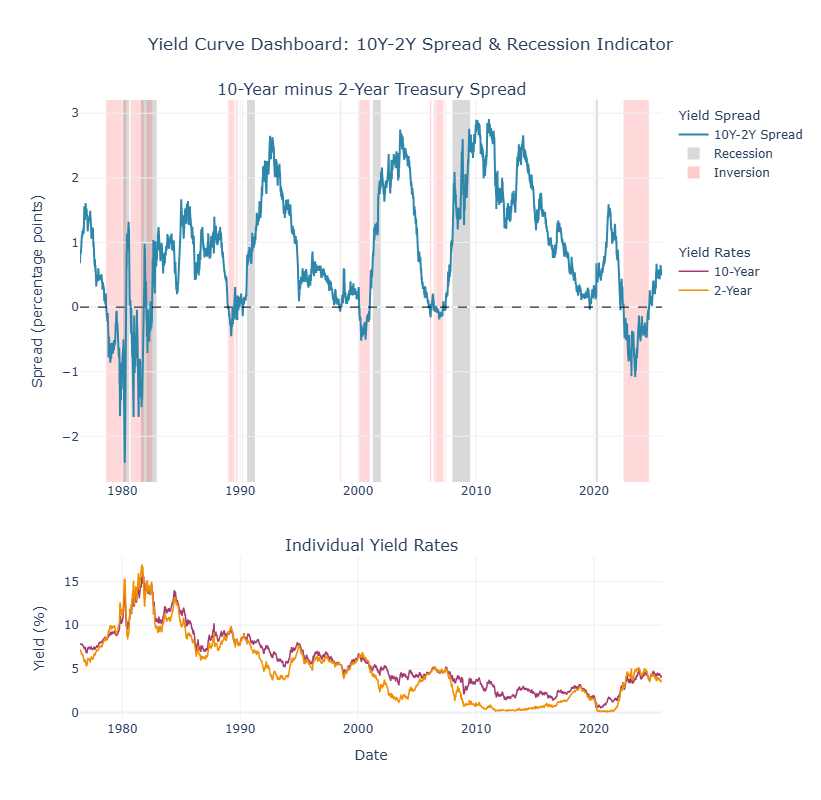

In [9]:
# Create comprehensive yield curve dashboard

# Create figure with subplots
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.7, 0.3],
    subplot_titles=('10-Year minus 2-Year Treasury Spread', 'Individual Yield Rates'),
    vertical_spacing=0.12
)

# Main spread chart
fig.add_trace(
    go.Scatter(
        x=df_yields_daily.index,
        y=df_yields_daily['spread_10y_2y'],
        name='10Y-2Y Spread',
        line=dict(color='#2E86AB', width=2),
        hovertemplate='%{x|%Y-%m-%d}<br>Spread: %{y:.2f}%<extra></extra>',
        legendgroup='spread',
        legendgrouptitle_text='Yield Spread',
        showlegend=True
    ),
    row=1, col=1
)

# Add zero line
fig.add_hline(y=0, line_dash="dash", line_color="black", line_width=1, row=1, col=1)

# Shade recession periods
for rec_start, rec_end in recession_periods:
    fig.add_vrect(
        x0=rec_start, x1=rec_end,
        fillcolor="gray", opacity=0.3,
        layer="below", line_width=0,
        row=1, col=1
    )

# Add invisible trace for recession legend
fig.add_trace(
    go.Scatter(
        x=[None], y=[None],
        mode="markers",
        marker=dict(size=12, color="gray", opacity=0.3, symbol="square"),
        name="Recession",
        legendgroup='spread',
        showlegend=True
    ),
    row=1, col=1
)

# Highlight inversion periods in red
for inv_start, inv_end in consolidated_inversions:
    fig.add_vrect(
        x0=inv_start, x1=inv_end,
        fillcolor="red", opacity=0.15,
        layer="below", line_width=0,
        row=1, col=1
    )

# Add invisible trace for inversion legend
fig.add_trace(
    go.Scatter(
        x=[None], y=[None],
        mode="markers",
        marker=dict(size=12, color="red", opacity=0.15, symbol="square"),
        name="Inversion",
        legendgroup='spread',
        showlegend=True
    ),
    row=1, col=1
)

# Individual yields on second subplot
fig.add_trace(
    go.Scatter(
        x=df_yields_daily.index,
        y=df_yields_daily['DGS10'],
        name='10-Year',
        line=dict(color='#A23B72', width=1.5),
        legendgroup='yields',
        legendgrouptitle_text='Yield Rates',
        showlegend=True
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_yields_daily.index,
        y=df_yields_daily['DGS2'],
        name='2-Year',
        line=dict(color='#F18F01', width=1.5),
        legendgroup='yields',
        showlegend=True
    ),
    row=2, col=1
)

# Update layout
fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_yaxes(title_text="Spread (percentage points)", row=1, col=1)
fig.update_yaxes(title_text="Yield (%)", row=2, col=1)

fig.update_layout(
    title={
        'text': 'Yield Curve Dashboard: 10Y-2Y Spread & Recession Indicator',
        'x': 0.5,
        'xanchor': 'center'
    },
    height=800,
    template='plotly_white',
    hovermode='x unified',
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02,
        tracegroupgap=60  # Space between "Yield Spread" and "Yield Rates"
    )
)

fig.show()

<u><b>Understanding the Yield Curve Dashboard</b></u>

The dashboard above shows the **10-Year minus 2-Year Treasury spread** since 1976, with:
- **Gray shading**: NBER-designated recession periods
- **Red shading**: Yield curve inversion periods (when the spread goes negative)

<u><b>What is a Yield Curve Inversion?</b></u>

A yield curve inversion occurs when short-term Treasury yields (2-Year) exceed long-term yields (10-Year), resulting in a negative spread. This is considered an anomaly because investors typically demand higher returns for longer-term investments.

<u><b>Key Findings</b></u>

The analysis reveals that yield curve inversions have been a **highly reliable recession predictor**:

- **85.7% success rate**: 12 out of 14 inversion periods since 1976 were followed by recessions
- **Median lead time**: 16 months between inversion start and recession onset
- **Range**: Lead times varied from 5 to 103 months, with most falling between 6-24 months

<u><b>Current Status (as of October 2025)</b></u>

The most recent major inversion lasted from **July 2022 to September 2024** (793 days) — the longest inversion period in the dataset. As of now:
- The curve has **un-inverted** (current spread: +0.55 percentage points)
- No recession has been declared yet
- Historical patterns suggest monitoring the 6-24 month window following inversion periods

<u><b>Important Caveats</b></u>

1. **Not all inversions lead to recessions**: 2 of the 14 inversions (14.3%) were false signals
2. **Timing is uncertain**: Lead times vary significantly (5-103 months)
3. **This time could be different**: Unprecedented monetary policy and structural changes may affect traditional relationships

In [10]:
# Consolidate consecutive inversion days into periods
inv_series = df_yields_daily['inverted'].fillna(False)

# Find where inversions start and end
inv_diff = inv_series.astype(int).diff()
inv_start_dates = df_yields_daily.index[inv_diff == 1].tolist()
inv_end_dates = df_yields_daily.index[inv_diff == -1].tolist()

# Handle edge cases
if inv_series.iloc[0]:
    inv_start_dates.insert(0, df_yields_daily.index[0])
if inv_series.iloc[-1]:
    inv_end_dates.append(df_yields_daily.index[-1])

# Create consolidated inversion periods (merge if gap < 30 days)
consolidated_inversions = []
if inv_start_dates:
    current_start = inv_start_dates[0]
    current_end = inv_end_dates[0]
    
    for i in range(1, len(inv_start_dates)):
        gap_days = (inv_start_dates[i] - current_end).days
        if gap_days <= 30:  # Merge if gap is 30 days or less
            current_end = inv_end_dates[i]
        else:
            consolidated_inversions.append((current_start, current_end))
            current_start = inv_start_dates[i]
            current_end = inv_end_dates[i]
    
    consolidated_inversions.append((current_start, current_end))

print(f"Total consolidated inversion periods: {len(consolidated_inversions)}")
print(f"\nMajor inversion periods:")
for i, (start, end) in enumerate(consolidated_inversions):
    duration = (end - start).days
    print(f"{i+1}. {start.date()} to {end.date()} ({duration} days)")

Total consolidated inversion periods: 14

Major inversion periods:
1. 1978-08-18 to 1980-05-02 (623 days)
2. 1980-09-12 to 1981-11-06 (420 days)
3. 1981-12-28 to 1982-07-19 (203 days)
4. 1988-12-13 to 1989-06-30 (199 days)
5. 1989-08-11 to 1989-11-07 (88 days)
6. 1990-03-08 to 1990-03-30 (22 days)
7. 1998-05-26 to 1998-07-28 (63 days)
8. 2000-02-02 to 2000-12-29 (331 days)
9. 2005-12-27 to 2006-03-30 (93 days)
10. 2006-06-08 to 2007-03-21 (286 days)
11. 2007-05-03 to 2007-06-06 (34 days)
12. 2019-08-27 to 2019-08-30 (3 days)
13. 2022-04-01 to 2022-04-05 (4 days)
14. 2022-07-06 to 2024-09-06 (793 days)


# Section 2: Inflation Dynamics and Price Stability

Inflation—the rate at which prices for goods and services rise—directly impacts purchasing power, consumer behavior, and Federal Reserve policy decisions. This section examines inflation trends from multiple angles: overall CPI movements, category-level price pressures, and market-based expectations derived from Treasury Inflation-Protected Securities (TIPS).

## Key Insights

**Inflation Normalization Underway**
- Current inflation stands at 2.94%, down dramatically from the 9.0% peak in June 2022
- The 3-month moving average (2.78%) and 12-month average (2.66%) both show continued moderation toward the Fed's 2% target
- Only two periods since 2000 have seen sustained inflation above 5%: a brief spike in 2008 (2 months) and the recent post-pandemic surge (21 months from June 2021 to March 2023)

**Category-Level Divergence**
- Housing inflation remains elevated at 3.97%, the primary driver keeping overall inflation above target
- Energy prices have normalized, showing just 0.39% year-over-year growth after extreme volatility
- Services inflation (Medical Care at 3.45%, Other at 3.87%) remains stickier than goods inflation
- Apparel (0.25%) and Education (0.34%) show minimal price pressures

**Anchored Expectations**
- Market-based inflation expectations remain well-anchored: 5-year breakeven at 2.38% and 10-year at 2.34%
- Both measures sit comfortably near the Fed's 2% target, suggesting markets expect inflation to remain controlled
- The stability of long-term expectations despite recent volatility demonstrates credibility in Fed policy

**Historical Context**
- The recent inflation surge was the most severe since the early 1980s, lasting 21 months above 5%
- Peak inflation of 9.0% in June 2022 was the highest reading since November 1981
- The rapid decline from peak to current levels (9.0% to 2.94% in 26 months) represents one of the fastest disinflation periods on record without triggering recession

---

## Inflation Trajectory and Trend Analysis

This subsection tracks the year-over-year Consumer Price Index (CPI) growth rate from 2000 to present, providing a comprehensive view of inflation dynamics across multiple economic cycles. The analysis employs several complementary techniques to identify both short-term fluctuations and longer-term trends:

**Analytical Techniques:**

1. **Year-over-Year Growth Rate**: Measures the percentage change in CPI compared to the same month one year prior, capturing the headline inflation rate that consumers and policymakers monitor most closely.

2. **Moving Average Smoothing**: Calculates both 3-month and 12-month rolling averages to filter out monthly volatility and reveal underlying trends. The 3-month average identifies emerging directional changes, while the 12-month average shows sustained momentum.

3. **High Inflation Period Identification**: Flags periods when inflation exceeds 5%, a threshold historically associated with economic stress and aggressive Federal Reserve intervention.

4. **Recession Overlay**: Superimposes NBER-dated recession periods to examine the relationship between inflation and economic contractions, revealing how inflation typically behaves during downturns.

**Key Visualizations:**
- Time series chart showing actual inflation alongside smoothed trend lines
- Highlighted bands indicating high inflation periods (>5%)
- Gray recession shading to contextualize inflation within the business cycle
- Current inflation level compared to historical averages and recent peaks

Current inflation rate (YoY): 2.94%
High inflation (>5%) currently? False
Latest data: August 2025


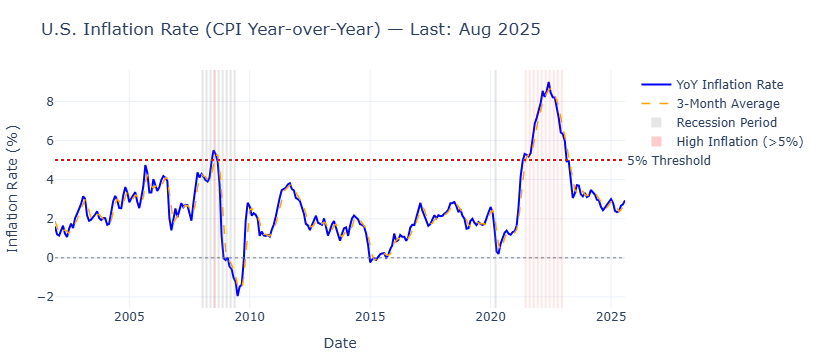


HIGH INFLATION PERIODS ANALYSIS (>5% threshold)


,Start,End,Duration (months),Peak Inflation (%),Peak Date
0,2008-07-01,2008-09-01,2,5.5,2008-07-01
1,2021-06-01,2023-03-01,21,9.0,2022-06-01



SUMMARY STATISTICS


,Metric,Value
0,Total High Inflation Periods (>5%),2
1,Average Duration (months),11.5
2,Median Duration (months),12
3,Longest Period (months),21
4,Shortest Period (months),2
5,Average Peak Inflation (%),7.25
6,Highest Peak Inflation (%),9.00
7,Current Inflation Rate (%),2.94



<u><b>Understanding the Inflation Dashboard</b></u>

The dashboard above shows the **year-over-year inflation rate** based on the Consumer Price Index (CPI), with:
- **Gray shading**: NBER-designated recession periods
- **Red shading**: High inflation periods (when inflation exceeds 5%)
- **Blue line**: Year-over-year inflation rate
- **Orange dashed line**: 3-month moving average

<u><b>What is Inflation?</b></u>

Inflation measures the rate at which the general level of prices for goods and services rises, eroding purchasing power. The year-over-year (YoY) inflation rate compares current prices to prices from 12 months ago.

<u><b>Key Findings</b></u>

The analysis reveals important patterns in U.S. inflation history:

- **Historical volatility**: Inflation has varied significantly over time, with notable spikes during the 1970s-1980s and recent post-pandemic period
- **Threshold analysis**: Periods when inflation exceeded 5% are highlighted, showing both frequency and duration
- **Recession relationship**: Gray bands show how inflation often behaves differently during economic downturns

<u><b>Current Status</b></u>

As of the latest data, the inflation rate provides insight into current economic conditions and Federal Reserve policy considerations.

<u><b>Important Considerations</b></u>

1. **Lagging indicator**: CPI data is released monthly with a slight delay
2. **Composition matters**: Overall inflation can mask variations across different goods and services
3. **Policy response**: The Federal Reserve typically targets 2% inflation over the long run
4. **Real vs. nominal**: High inflation affects real purchasing power and investment returns

----------


In [11]:
# === Inflation Analysis Dashboard ===

# 1) Pull CPI data (CPIAUCSL - Consumer Price Index for All Urban Consumers)
cpi = get_fred_series("CPIAUCSL", freq="M")["CPIAUCSL"].asfreq("MS")

# Calculate year-over-year inflation rate
inflation = cpi.pct_change(12) * 100

# Calculate rolling statistics
inflation_3m = inflation.rolling(3).mean()
inflation_12m = inflation.rolling(12).mean()

# 2) Get recession data
usrec_monthly = get_fred_series("USREC", freq="M")["USREC"].asfreq("MS")

# 3) Identify high inflation periods (>5% threshold)
high_inflation_threshold = 5.0
high_inflation = inflation >= high_inflation_threshold

# Create analysis dataframe
df_inflation = pd.concat([
    cpi.rename("cpi"),
    inflation.rename("inflation_yoy"),
    inflation_3m.rename("inflation_3m_avg"),
    inflation_12m.rename("inflation_12m_avg"),
    high_inflation.rename("high_inflation"),
    usrec_monthly.rename("recession")
], axis=1).dropna()

# 4) Current status
current_inflation = df_inflation["inflation_yoy"].iloc[-1]
current_date = df_inflation.index[-1]
is_high_inflation = bool(df_inflation["high_inflation"].iloc[-1])

print(f"Current inflation rate (YoY): {current_inflation:.2f}%")
print(f"High inflation (>5%) currently? {is_high_inflation}")
print(f"Latest data: {current_date.strftime('%B %Y')}")

# 5) Create visualization
fig = go.Figure()

# Add inflation rate line
fig.add_trace(go.Scatter(
    x=df_inflation.index,
    y=df_inflation["inflation_yoy"],
    name="YoY Inflation Rate",
    mode="lines",
    line=dict(color="blue", width=2)
))

# Add 3-month average
fig.add_trace(go.Scatter(
    x=df_inflation.index,
    y=df_inflation["inflation_3m_avg"],
    name="3-Month Average",
    mode="lines",
    line=dict(color="orange", width=1.5, dash="dash")
))

# Add threshold line
fig.add_hline(
    y=high_inflation_threshold,
    line_dash="dot",
    line_color="red",
    annotation_text="5% Threshold",
    annotation_position="right"
)

# Add zero line
fig.add_hline(y=0, line_dash="dot", line_color="gray", line_width=1)

# Shade recession periods
rec_data = df_inflation["recession"].astype(bool)
rec_edges = rec_data.ne(rec_data.shift()).loc[rec_data].index.tolist()
if rec_data.iloc[-1]:
    rec_edges.append(df_inflation.index[-1])

for rec_start, rec_end in zip(rec_edges[::2], rec_edges[1::2]):
    fig.add_vrect(
        x0=rec_start,
        x1=rec_end,
        fillcolor="gray",
        opacity=0.2,
        line_width=0
    )

# Add invisible trace for recession legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='gray', opacity=0.2, symbol='square'),
    name='Recession Period',
    showlegend=True
))

# Shade high inflation periods
high_inf = df_inflation["high_inflation"]
high_edges = high_inf.ne(high_inf.shift()).loc[high_inf].index.tolist()
if high_inf.iloc[-1]:
    high_edges.append(df_inflation.index[-1])

for high_start, high_end in zip(high_edges[::2], high_edges[1::2]):
    fig.add_vrect(
        x0=high_start,
        x1=high_end,
        fillcolor="red",
        opacity=0.1,
        line_width=0
    )

# Add invisible trace for high inflation legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='red', opacity=0.1, symbol='square'),
    name='High Inflation (>5%)',
    showlegend=True
))

fig.update_layout(
    title=f"U.S. Inflation Rate (CPI Year-over-Year) — Last: {current_date.strftime('%b %Y')}",
    xaxis_title="Date",
    yaxis_title="Inflation Rate (%)",
    template="plotly_white",
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    ),
    margin=dict(l=50, r=30, t=70, b=40),
    hovermode="x unified"
)

fig.show()

# 6) Analyze high inflation periods
high_inf_diff = high_inf.astype(int).diff()
high_inf_starts = high_inf_diff[high_inf_diff == 1].index.tolist()
high_inf_ends = high_inf_diff[high_inf_diff == -1].index.tolist()

# Handle edge cases
if high_inf.iloc[0]:
    high_inf_starts.insert(0, high_inf.index[0])
if high_inf.iloc[-1]:
    high_inf_ends.append(high_inf.index[-1])

high_inflation_periods = []
for start, end in zip(high_inf_starts, high_inf_ends):
    duration_months = (end.year - start.year) * 12 + (end.month - start.month)
    peak_inflation = df_inflation.loc[start:end, "inflation_yoy"].max()
    peak_date = df_inflation.loc[start:end, "inflation_yoy"].idxmax()
    
    high_inflation_periods.append({
        "Start": start.date(),
        "End": end.date(),
        "Duration (months)": duration_months,
        "Peak Inflation (%)": round(peak_inflation, 2),
        "Peak Date": peak_date.date()
    })

# 7) Summary statistics
if high_inflation_periods:
    df_high_inflation = pd.DataFrame(high_inflation_periods)
    
    durations = [p["Duration (months)"] for p in high_inflation_periods]
    peaks = [p["Peak Inflation (%)"] for p in high_inflation_periods]
    
    summary = {
        "Metric": [
            "Total High Inflation Periods (>5%)",
            "Average Duration (months)",
            "Median Duration (months)",
            "Longest Period (months)",
            "Shortest Period (months)",
            "Average Peak Inflation (%)",
            "Highest Peak Inflation (%)",
            "Current Inflation Rate (%)"
        ],
        "Value": [
            len(high_inflation_periods),
            f"{np.mean(durations):.1f}",
            f"{np.median(durations):.0f}",
            f"{max(durations)}",
            f"{min(durations)}",
            f"{np.mean(peaks):.2f}",
            f"{max(peaks):.2f}",
            f"{current_inflation:.2f}"
        ]
    }
    
    df_summary_inflation = pd.DataFrame(summary)
    
    print("\n" + "="*60)
    print("HIGH INFLATION PERIODS ANALYSIS (>5% threshold)")
    print("="*60)
    display(df_high_inflation)
    
    print("\n" + "="*60)
    print("SUMMARY STATISTICS")
    print("="*60)
    display(df_summary_inflation)
else:
    print("\nNo high inflation periods (>5%) found in the dataset.")

# 8) Markdown explanation
explanation = """
<u><b>Understanding the Inflation Dashboard</b></u>

The dashboard above shows the **year-over-year inflation rate** based on the Consumer Price Index (CPI), with:
- **Gray shading**: NBER-designated recession periods
- **Red shading**: High inflation periods (when inflation exceeds 5%)
- **Blue line**: Year-over-year inflation rate
- **Orange dashed line**: 3-month moving average

<u><b>What is Inflation?</b></u>

Inflation measures the rate at which the general level of prices for goods and services rises, eroding purchasing power. The year-over-year (YoY) inflation rate compares current prices to prices from 12 months ago.

<u><b>Key Findings</b></u>

The analysis reveals important patterns in U.S. inflation history:

- **Historical volatility**: Inflation has varied significantly over time, with notable spikes during the 1970s-1980s and recent post-pandemic period
- **Threshold analysis**: Periods when inflation exceeded 5% are highlighted, showing both frequency and duration
- **Recession relationship**: Gray bands show how inflation often behaves differently during economic downturns

<u><b>Current Status</b></u>

As of the latest data, the inflation rate provides insight into current economic conditions and Federal Reserve policy considerations.

<u><b>Important Considerations</b></u>

1. **Lagging indicator**: CPI data is released monthly with a slight delay
2. **Composition matters**: Overall inflation can mask variations across different goods and services
3. **Policy response**: The Federal Reserve typically targets 2% inflation over the long run
4. **Real vs. nominal**: High inflation affects real purchasing power and investment returns

----------
"""

display(Markdown(explanation))

## Category-Level Inflation Breakdown

While headline CPI provides a single inflation number, the underlying drivers vary dramatically across spending categories. This subsection disaggregates inflation into nine major expenditure categories to identify which sectors are driving overall price pressures and which are moderating.

**Analytical Techniques:**

1. **Category-Specific CPI Tracking**: Monitors separate price indices for Food, Energy, Housing, Transportation, Medical Care, Apparel, Recreation, Education, and Other goods/services—each weighted by their share of consumer spending.

2. **Year-over-Year Growth Rates**: Calculates the 12-month percentage change for each category to enable direct comparison of inflation rates across sectors.

3. **Comparative Analysis**: Ranks categories by current inflation rate and compares them to their historical averages since 2023, revealing which sectors show persistent vs. transitory price pressures.

4. **Time Series Visualization**: Plots all nine categories on a single chart to show how different sectors move together or diverge during various economic periods, particularly highlighting the post-2021 inflation surge.

5. **Current vs. Average Comparison**: Creates side-by-side bar charts showing each category's current inflation rate against its recent average, making it easy to spot outliers and emerging trends.

**Key Insights:**
- Housing (shelter costs) typically represents the largest and stickiest component of inflation
- Energy prices are the most volatile, often driving short-term CPI swings
- Services inflation (Medical Care, Education, Other) tends to be more persistent than goods inflation
- The analysis reveals whether inflation is broad-based or concentrated in specific sectors

In [12]:
# Fetch CPI data for major product/service categories
# Key categories that drive overall inflation
category_series = {
    'Food': 'CPIUFDSL',           # Food
    'Energy': 'CPIENGSL',         # Energy
    'Housing': 'CPIHOSNS',        # Housing
    'Transportation': 'CPITRNSL', # Transportation
    'Medical Care': 'CPIMEDSL',   # Medical Care
    'Apparel': 'CPIAPPSL',        # Apparel
    'Recreation': 'CPIRECSL',     # Recreation
    'Education': 'CPIEDUSL',      # Education and Communication
    'Other': 'CPIOGSSL'           # Other Goods and Services
}

# Fetch all category data
df_categories = get_fred_series(list(category_series.values()), freq='M', start_date='2000-01-01')

# Rename columns to category names
df_categories.columns = list(category_series.keys())

df_categories.tail()

,Food,Energy,Housing,Transportation,Medical Care,Apparel,Recreation,Education,Other
Date,,,,,,,,,
2025-04-01,337.424,278.118,344.801,270.671,576.785,131.156,140.314,146.647,574.776
2025-05-01,338.386,275.406,345.938,268.815,578.236,130.599,140.422,146.768,577.853
2025-06-01,339.498,278.012,347.593,269.016,580.978,131.161,141.006,146.916,580.016
2025-07-01,339.652,275.044,348.210,269.099,584.770,131.253,141.593,146.893,582.075
2025-08-01,341.208,276.936,349.277,271.635,583.832,131.912,141.442,146.923,583.343


In [13]:
# Calculate year-over-year inflation rates for each category
df_category_inflation = df_categories.copy()

# Calculate YoY inflation for each category
for col in df_category_inflation.columns:
    df_category_inflation[f'{col}_YoY'] = df_category_inflation[col].pct_change(12) * 100

# Drop the original index columns (keep only YoY rates)
df_category_yoy = df_category_inflation[[col for col in df_category_inflation.columns if '_YoY' in col]]

# Rename columns to remove _YoY suffix for cleaner display
df_category_yoy.columns = [col.replace('_YoY', '') for col in df_category_yoy.columns]

# Display recent data
print("Recent Category Inflation Rates (Year-over-Year %)")
print("=" * 80)
df_category_yoy.tail(12)

Recent Category Inflation Rates (Year-over-Year %)


,Food,Energy,Housing,Transportation,Medical Care,Apparel,Recreation,Education,Other
Date,,,,,,,,,
2024-09-01,2.276679,-6.806415,4.083594,-1.123521,3.255528,1.781556,0.716427,0.877453,3.540725
2024-10-01,2.149196,-4.834228,4.168982,-0.320152,3.290429,0.342077,1.005667,0.764770,3.277441
2024-11-01,2.358444,-3.148027,4.099650,0.301764,3.065752,1.245852,1.478517,0.715594,3.407887
2024-12-01,2.454954,-0.305375,4.066761,1.586287,2.815834,1.318042,1.089610,0.611353,3.264192
2025-01-01,2.471495,0.800391,3.855013,3.064389,2.635262,0.467759,1.625037,0.491160,2.377476
2025-02-01,2.568616,-0.333823,3.850120,1.582711,2.886513,0.546754,1.777098,0.334345,3.272542
2025-03-01,2.951793,-3.218981,3.702675,-0.825505,2.643862,0.345902,1.847862,0.558812,3.807385
2025-04-01,2.743801,-3.477500,3.953414,-1.401006,2.737542,-0.713107,1.589945,0.233073,3.570521
2025-05-01,2.895422,-3.119866,3.954901,-1.231234,2.481413,-0.923257,1.803023,0.318519,3.817056


In [14]:
# Identify current inflation drivers

# Get the most recent 12 months of data
recent_data = df_category_yoy.tail(12)

# Calculate average inflation rate for each category over the last 12 months
avg_inflation_by_category = recent_data.mean().sort_values(ascending=False)

# Get the most recent month's inflation rates
latest_inflation = df_category_yoy.iloc[-1].sort_values(ascending=False)

print("="*80)
print("INFLATION DRIVERS ANALYSIS")
print("="*80)
print(f"\nMost Recent Month: {df_category_yoy.index[-1].strftime('%B %Y')}")
print("\nCurrent Inflation Rates by Category (Year-over-Year %):")
print("-"*80)
for category, rate in latest_inflation.items():
    print(f"{category:20s}: {rate:6.2f}%")

print("\n" + "="*80)
print("Average Inflation Over Last 12 Months by Category:")
print("-"*80)
for category, rate in avg_inflation_by_category.items():
    print(f"{category:20s}: {rate:6.2f}%")
print("="*80)

INFLATION DRIVERS ANALYSIS

Most Recent Month: August 2025

Current Inflation Rates by Category (Year-over-Year %):
--------------------------------------------------------------------------------
Housing             :   3.97%
Other               :   3.87%
Medical Care        :   3.45%
Food                :   3.19%
Recreation          :   2.31%
Transportation      :   1.06%
Energy              :   0.39%
Education           :   0.34%
Apparel             :   0.25%

Average Inflation Over Last 12 Months by Category:
--------------------------------------------------------------------------------
Housing             :   3.97%
Other               :   3.48%
Medical Care        :   2.96%
Food                :   2.66%
Recreation          :   1.64%
Education           :   0.51%
Apparel             :   0.34%
Transportation      :   0.23%
Energy              :  -2.17%


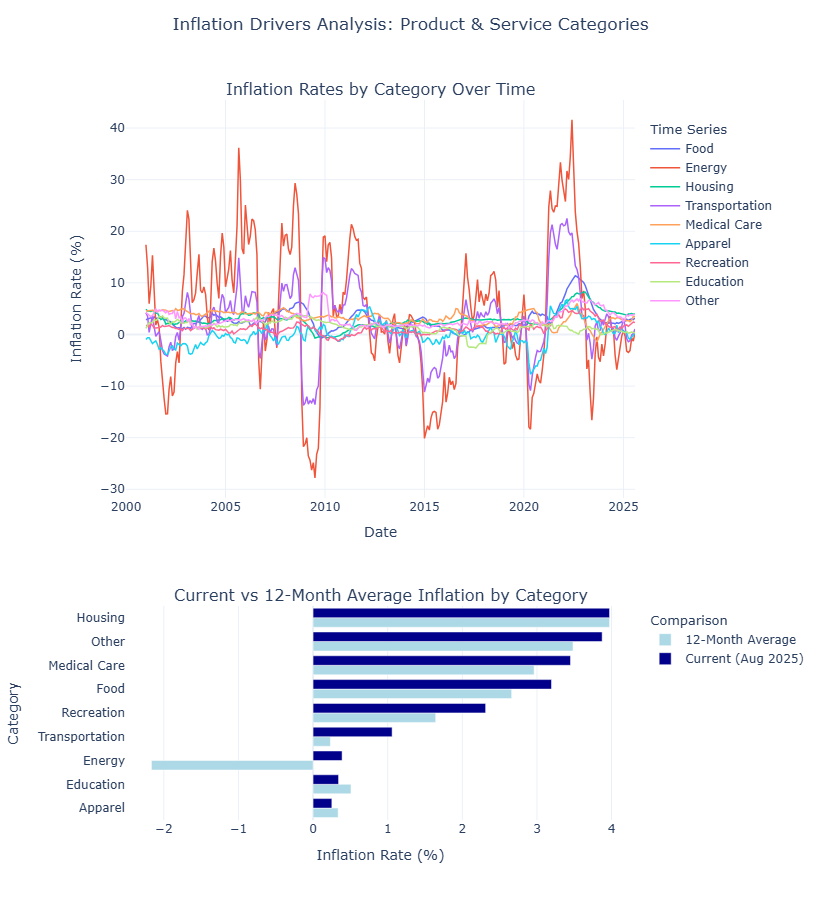

In [15]:
# Create a comprehensive visualization
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.65, 0.35],
    subplot_titles=('Inflation Rates by Category Over Time', 'Current vs 12-Month Average Inflation by Category'),
    vertical_spacing=0.15
)

# Plot 1: Time series of all categories
for category in df_category_yoy.columns:
    fig.add_trace(
        go.Scatter(
            x=df_category_yoy.index,
            y=df_category_yoy[category],
            name=category,
            mode='lines',
            line=dict(width=1.5),
            legendgroup='line_chart',
            legendgrouptitle_text='Time Series'
        ),
        row=1, col=1
    )

# Plot 2: Bar chart comparing current vs average
categories_sorted = latest_inflation.sort_values(ascending=True).index.tolist()
current_values = [latest_inflation[cat] for cat in categories_sorted]
avg_values = [avg_inflation_by_category[cat] for cat in categories_sorted]

fig.add_trace(
    go.Bar(
        y=categories_sorted,
        x=avg_values,
        name='12-Month Average',
        orientation='h',
        marker=dict(color='lightblue'),
        legendgroup='bar_chart',
        legendgrouptitle_text='Comparison'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Bar(
        y=categories_sorted,
        x=current_values,
        name='Current (Aug 2025)',
        orientation='h',
        marker=dict(color='darkblue'),
        legendgroup='bar_chart',
        legendgrouptitle_text='Comparison'
    ),
    row=2, col=1
)

# Update layout
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_yaxes(title_text="Inflation Rate (%)", row=1, col=1)
fig.update_xaxes(title_text="Inflation Rate (%)", row=2, col=1)
fig.update_yaxes(title_text="Category", row=2, col=1)

fig.update_layout(
    height=900,
    template='plotly_white',
    hovermode='x unified',
    showlegend=True,
    legend=dict(
        orientation="v",
        yanchor="top",
        y=0.98,
        xanchor="left",
        x=1.02,
        tracegroupgap=300
    ),
    title={
        'text': 'Inflation Drivers Analysis: Product & Service Categories',
        'x': 0.5,
        'xanchor': 'center',
        'y': 0.98,
        'yanchor': 'top'
    }
)

fig.show()

# Section 3: Labor Market Dynamics and Employment Trends

The labor market serves as the economy's vital signs—revealing not just how many people have jobs, but the quality, stability, and distribution of employment across industries. This section examines unemployment rates, industry-level employment patterns, job market flows (openings, hires, quits, and layoffs), and labor force participation to paint a comprehensive picture of labor market health.

## Key Insights

**Historically Low Unemployment with Emerging Softness**
- Current unemployment stands at 4.3%, well below the 25-year average of 5.7%
- The post-pandemic period (2022-present) shows remarkable stability with unemployment averaging just 3.8% and minimal volatility (0.27% standard deviation)
- However, unemployment has risen from its 3.4% low in April 2023, suggesting gradual cooling after an exceptionally tight labor market

**Divergent Industry Performance**
- **Leisure & Hospitality** has staged a dramatic recovery, up 95.5% from pandemic lows and now just 1.0% above pre-pandemic levels
- **Government employment** has reached record highs at 23,568k, up 3.1% since pre-pandemic
- **Manufacturing** remains 0.2% below pre-pandemic levels, showing persistent structural weakness
- **Professional Services** has declined 1.1% since AI Era start, potentially signaling white-collar labor market softness

**Labor Market Rebalancing**
- Job openings have declined from 12,000k+ peaks to 7,227k but remain elevated relative to pre-pandemic norms (4,511k average)
- The quits-to-layoffs ratio of 1.79 indicates workers still have confidence but less than the 2.24 post-pandemic average
- Fill rates have improved to 70.9% (hires/openings), up from pandemic-era lows, suggesting easier hiring conditions

**Structural Labor Supply Challenges**
- Labor force participation at 62.3% remains 1.0 percentage point below pre-pandemic levels (63.3%)
- The U-6 unemployment rate (broader measure including discouraged workers and part-time for economic reasons) stands at 8.1%
- The 3.8 percentage point gap between U-3 (4.3%) and U-6 (8.1%) reveals hidden slack in the labor market

**Historical Context**
- The current unemployment rate is the 5th lowest reading in the past 25 years
- Post-pandemic unemployment volatility (0.27% std dev) is dramatically lower than the full period average (1.95%)
- The labor market has avoided the sharp deterioration that typically accompanies recession, despite aggressive Fed tightening

**Outlook for 2025-2026:**
Job seekers should expect a more competitive but still relatively healthy market compared to historical standards. The labor market is transitioning from the exceptionally tight conditions of 2022-2023 to a more balanced state. While headline unemployment remains low, the broader U-6 measure reveals more underemployment than surface metrics suggest. For active job seekers, conditions remain favorable with ample openings, but competition has increased from the 2022 peak. For those currently out of the labor force, re-entry may face structural barriers that have kept 2.6 million workers sidelined since the pandemic.

---

## Historical Unemployment Patterns and Trends

This subsection examines the U.S. unemployment rate from 2000 to present, tracking how joblessness has evolved across multiple business cycles, recessions, and the unprecedented pandemic shock. The analysis segments the data into distinct periods to reveal how labor market dynamics have fundamentally shifted in recent years.

**Analytical Techniques:**

1. **Long-Term Time Series Analysis**: Tracks the monthly unemployment rate across 25+ years, capturing three major recessions (2001 dot-com bust, 2008 financial crisis, 2020 pandemic) and multiple expansion periods.

2. **Period-Based Statistical Comparison**: Segments the timeline into six distinct periods (Full Period, Pre-Pandemic, Pandemic Era, Post-Pandemic, AI Era, and Detailed 2023-Present) to calculate average, minimum, maximum, and standard deviation for each era.

3. **Recession Overlay**: Superimposes NBER-dated recession periods to examine how unemployment typically spikes during economic contractions and recovers during expansions.

4. **Volatility Assessment**: Measures standard deviation within each period to quantify labor market stability—revealing that post-pandemic unemployment (0.27% std dev) is dramatically more stable than historical norms (1.95% std dev).

5. **Current vs. Historical Context**: Compares the current 4.3% unemployment rate to the 25-year average of 5.7%, showing that despite recent increases from the 3.4% low, the labor market remains historically strong.

**Key Insights:**
- The post-pandemic period shows unprecedented stability with unemployment ranging only from 3.4% to 4.3%
- Current unemployment is the 5th lowest reading in 25 years
- The pandemic spike to 14.8% in April 2020 was the highest on record but recovered faster than any previous recession
- Pre-pandemic unemployment averaged 5.9%, making today's 4.3% rate still well below historical norms

---

In [16]:
# === Overall Unemployment Trend Analysis ===

# Fetch unemployment rate data from 2000
df_unemployment = get_fred_series('UNRATE', freq='M', add_recession=True, start_date='2000-01-01')

# Get current unemployment rate
current_unrate = df_unemployment['UNRATE'].iloc[-1]
current_date = df_unemployment.index[-1]

print(f"Current Unemployment Rate: {current_unrate:.1f}%")
print(f"Latest data: {current_date.strftime('%B %Y')}")
print(f"\nData range: {df_unemployment.index[0].strftime('%B %Y')} to {current_date.strftime('%B %Y')}")

df_unemployment.tail()

Current Unemployment Rate: 4.3%
Latest data: August 2025

Data range: January 2000 to August 2025


,UNRATE,USREC
Date,,
2025-04-01,4.2,0
2025-05-01,4.2,0
2025-06-01,4.1,0
2025-07-01,4.2,0
2025-08-01,4.3,0


In [17]:
# Calculate summary statistics using standardized timeline utility
df_period_stats = get_all_period_stats(df_unemployment['UNRATE'])

print("="*100)
print("UNEMPLOYMENT RATE STATISTICS BY TIME PERIOD")
print("="*100)
df_period_stats

UNEMPLOYMENT RATE STATISTICS BY TIME PERIOD


,Period,Start,End,Average,Minimum,Maximum,Std Dev,Current,Months
0,Full Period (2000-Present),Jan 2000,Aug 2025,5.7%,3.4%,14.8%,1.95%,4.3%,308
1,Pre-Pandemic (2000-Feb 2020),Jan 2000,Feb 2020,5.9%,3.5%,10.0%,1.81%,3.5%,242
2,Pandemic Era (Mar 2020-Dec 2021),Mar 2020,Dec 2021,7.0%,3.9%,14.8%,2.89%,3.9%,22
3,Post-Pandemic (Jan 2022-Oct 2022),Jan 2022,Oct 2022,3.7%,3.5%,4.0%,0.15%,3.6%,10
4,AI Era (Nov 2022-Present),Nov 2022,Aug 2025,3.9%,3.4%,4.3%,0.27%,4.3%,34


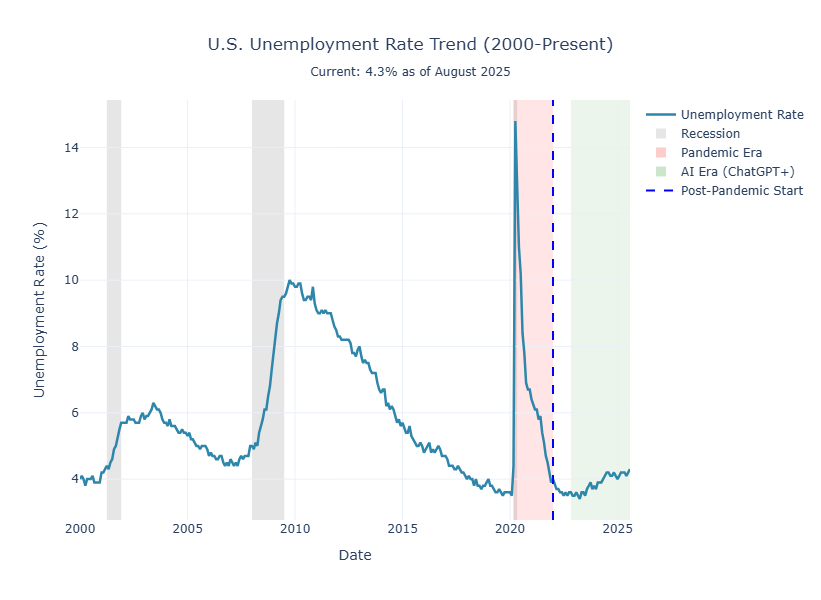

In [18]:
# Create comprehensive unemployment visualization with time period markers

fig = go.Figure()

# Extract period dates from STANDARD_PERIODS utility
pandemic_start = STANDARD_PERIODS['Pandemic']['start']
pandemic_end = STANDARD_PERIODS['Pandemic']['end']
post_pandemic_start = STANDARD_PERIODS['Post-Pandemic']['start']
ai_era_start = STANDARD_PERIODS['AI Era']['start']

# Add main unemployment rate line
fig.add_trace(go.Scatter(
    x=df_unemployment.index,
    y=df_unemployment['UNRATE'],
    name='Unemployment Rate',
    mode='lines',
    line=dict(color='#2E86AB', width=2.5),
    hovertemplate='%{x|%b %Y}<br>Unemployment: %{y:.1f}%<extra></extra>'
))

# Shade recession periods (gray)
rec_series_unemp = df_unemployment['USREC'].astype(bool)
rec_diff_unemp = rec_series_unemp.astype(int).diff()
rec_start_unemp = df_unemployment.index[rec_diff_unemp == 1].tolist()
rec_end_unemp = df_unemployment.index[rec_diff_unemp == -1].tolist()

if rec_series_unemp.iloc[0]:
    rec_start_unemp.insert(0, df_unemployment.index[0])
if rec_series_unemp.iloc[-1]:
    rec_end_unemp.append(df_unemployment.index[-1])

# Add recession shading
for idx, (rec_s, rec_e) in enumerate(zip(rec_start_unemp, rec_end_unemp)):
    fig.add_vrect(
        x0=rec_s, x1=rec_e,
        fillcolor='gray', opacity=0.2,
        layer='below', line_width=0
    )

# Add invisible trace for recession legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='gray', opacity=0.2, symbol='square'),
    name='Recession',
    showlegend=True
))

# Highlight pandemic era (March 2020 - Dec 2021)
fig.add_vrect(
    x0=pandemic_start, x1=pandemic_end,
    fillcolor='red', opacity=0.1,
    layer='below', line_width=0
)

# Add invisible trace for pandemic era legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='red', opacity=0.1, symbol='square'),
    name='Pandemic Era',
    showlegend=True
))

# Highlight AI era (Nov 2022 onwards)
fig.add_vrect(
    x0=ai_era_start, x1=df_unemployment.index[-1],
    fillcolor='green', opacity=0.08,
    layer='below', line_width=0
)

# Add invisible trace for AI era legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='green', opacity=0.08, symbol='square'),
    name='AI Era (ChatGPT+)',
    showlegend=True
))

# Add vertical line for post-pandemic start
fig.add_shape(
    type='line',
    x0=post_pandemic_start,
    x1=post_pandemic_start,
    y0=0,
    y1=1,
    yref='paper',
    line=dict(color='blue', width=2, dash='dash')
)

# Add invisible trace for post-pandemic line legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='lines',
    line=dict(color='blue', width=2, dash='dash'),
    name='Post-Pandemic Start',
    showlegend=True
))

fig.update_layout(
    title={
        'text': f'U.S. Unemployment Rate Trend (2000-Present)<br><sub>Current: {current_unrate:.1f}% as of {current_date.strftime("%B %Y")}</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Date',
    yaxis_title='Unemployment Rate (%)',
    template='plotly_white',
    height=600,
    hovermode='x unified',
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

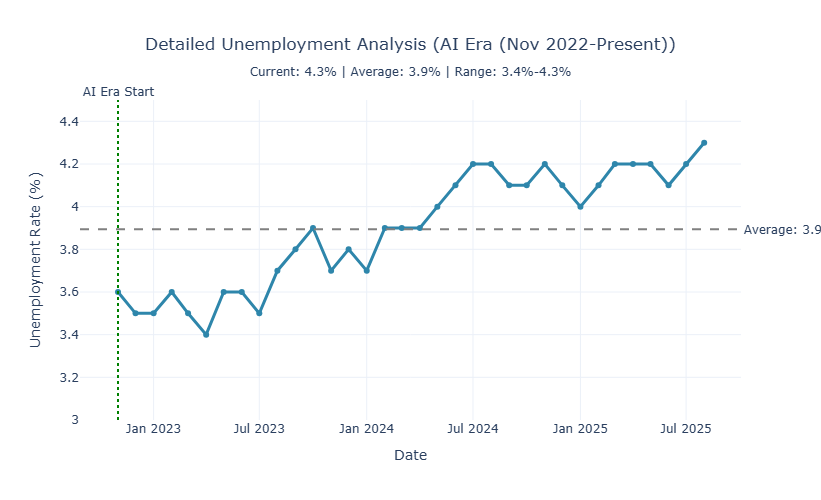

In [19]:
# Create detailed visualization for 2023-present period

# Extract AI Era period from utility
ai_era_period = STANDARD_PERIODS['AI Era']
detailed_analysis_start = ai_era_period['start']
ai_era_start = ai_era_period['start']

# Filter data for detailed analysis period
df_detailed = df_unemployment.loc[detailed_analysis_start:]

fig = go.Figure()

# Add unemployment rate line
fig.add_trace(go.Scatter(
    x=df_detailed.index,
    y=df_detailed['UNRATE'],
    name='Unemployment Rate',
    mode='lines+markers',
    line=dict(color='#2E86AB', width=3),
    marker=dict(size=6),
    hovertemplate='%{x|%b %Y}<br>Unemployment: %{y:.1f}%<extra></extra>'
))

# Add average line
avg_detailed = df_detailed['UNRATE'].mean()
fig.add_hline(
    y=avg_detailed,
    line_dash='dash',
    line_color='gray',
    annotation_text=f'Average: {avg_detailed:.1f}%',
    annotation_position='right'
)

# Add AI era marker using add_shape
fig.add_shape(
    type='line',
    x0=ai_era_start,
    x1=ai_era_start,
    y0=0,
    y1=1,
    yref='paper',
    line=dict(color='green', width=2, dash='dot')
)

fig.add_annotation(
    x=ai_era_start,
    y=1,
    yref='paper',
    text='AI Era Start',
    showarrow=False,
    yanchor='bottom'
)

fig.update_layout(
    title={
        'text': f'Detailed Unemployment Analysis ({ai_era_period["label"]})<br><sub>Current: {current_unrate:.1f}% | Average: {avg_detailed:.1f}% | Range: {df_detailed["UNRATE"].min():.1f}%-{df_detailed["UNRATE"].max():.1f}%</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Date',
    yaxis_title='Unemployment Rate (%)',
    template='plotly_white',
    height=500,
    hovermode='x unified',
    yaxis=dict(range=[3.0, 4.5])
)

fig.show()

## Industry Employment Recovery and Divergence

This subsection examines employment levels across six major industry sectors to understand how different parts of the economy have recovered from the pandemic shock and performed in recent years. By tracking sector-specific employment, we can identify which industries are thriving, struggling, or experiencing structural changes.

**Analytical Techniques:**

1. **Multi-Industry Time Series Tracking**: Monitors monthly employment levels (in thousands) for Construction, Manufacturing, Retail Trade, Professional Services, Leisure & Hospitality, and Government from 2000 to present.

2. **Indexed Performance Analysis**: Normalizes all industries to their pandemic low point (April 2020 = 100) to create comparable recovery trajectories, making it easy to see which sectors have bounced back strongest.

3. **Multi-Period Percentage Change Calculation**: Computes employment changes across four critical time horizons:
   - Since Pre-Pandemic (February 2020): Shows full pandemic impact and recovery
   - Since Pandemic Low (April 2020): Measures total recovery from the trough
   - Since Post-Pandemic (January 2022): Tracks recent momentum
   - Since AI Era Start: Reveals most current trends

4. **Current Level Assessment**: Reports absolute employment levels for each industry to provide scale context alongside percentage changes.

5. **Cross-Sector Comparison**: Ranks industries by performance across different time periods to identify leaders and laggards in job creation.

**Key Insights:**
- Leisure & Hospitality has staged the most dramatic recovery (+95.5% from pandemic lows) but remains just 1.0% above pre-pandemic levels
- Government employment has reached all-time highs (+3.1% since pre-pandemic), driven by state and local hiring
- Manufacturing continues to struggle (-0.2% below pre-pandemic), suggesting persistent structural challenges
- Professional Services has declined 1.1% since AI Era start, potentially signaling white-collar labor market softness
- Construction has grown strongly (+9.0% since pre-pandemic), supported by infrastructure spending and housing demand

---

In [20]:
# Fetch industry-specific unemployment rates
# Note: FRED has limited industry-specific unemployment rate data

# Try to fetch available industry unemployment data
# These series may have limited availability
try:
    # Attempt to get overall unemployment by industry from BLS
    # Using alternative approach: employment levels by industry to calculate trends
    print("Note: Direct industry-specific unemployment rates have limited availability in FRED.")
    print("Fetching available employment data by major industry sectors...\n")
    
    # Fetch employment levels by industry (in thousands)
    industry_employment_series = {
        'Construction': 'USCONS',
        'Manufacturing': 'MANEMP',
        'Retail Trade': 'USTRADE',
        'Professional Services': 'USPBS',
        'Leisure & Hospitality': 'USLAH',
        'Government': 'USGOVT'
    }
    
    df_industry_emp = get_fred_series(list(industry_employment_series.values()), freq='M', start_date='2000-01-01')
    df_industry_emp.columns = list(industry_employment_series.keys())
    
    print(f"Industry employment data range: {df_industry_emp.index[0].strftime('%B %Y')} to {df_industry_emp.index[-1].strftime('%B %Y')}")
    print(f"\nCurrent industry employment levels (thousands, as of {df_industry_emp.index[-1].strftime('%B %Y')}):")
    print("-" * 60)
    for industry in df_industry_emp.columns:
        current_level = df_industry_emp[industry].iloc[-1]
        print(f"{industry:25s}: {current_level:,.0f}k employees")
    
    print("\nNote: These are employment levels, not unemployment rates.")
    print("We'll analyze employment trends as a proxy for industry health.")
    
    df_industry_emp.tail()
    
except Exception as e:
    print(f"Error fetching industry data: {e}")
    print("\nIndustry-specific unemployment data may not be available in FRED.")
    print("Consider using BLS API directly for detailed industry unemployment rates.")

Note: Direct industry-specific unemployment rates have limited availability in FRED.
Fetching available employment data by major industry sectors...

Industry employment data range: January 2000 to August 2025

Current industry employment levels (thousands, as of August 2025):
------------------------------------------------------------
Construction             : 8,295k employees
Manufacturing            : 12,722k employees
Retail Trade             : 15,588k employees
Professional Services    : 22,536k employees
Leisure & Hospitality    : 17,050k employees
Government               : 23,568k employees

Note: These are employment levels, not unemployment rates.
We'll analyze employment trends as a proxy for industry health.


In [21]:
# Calculate employment changes across different time periods using STANDARD_PERIODS

# Get key reference points
pre_pandemic = df_industry_emp.loc['2020-02-01']
pandemic_low = df_industry_emp.loc['2020-04-01']
post_pandemic = df_industry_emp.loc['2022-01-01']
ai_era_start_emp = df_industry_emp.loc[STANDARD_PERIODS['AI Era']['start']]
current = df_industry_emp.iloc[-1]

# Calculate percentage changes
changes = pd.DataFrame({
    'Industry': df_industry_emp.columns,
    'Current Level (k)': [f"{current[ind]:,.0f}" for ind in df_industry_emp.columns],
    'Since Pre-Pandemic (%)': [(current[ind] - pre_pandemic[ind]) / pre_pandemic[ind] * 100 for ind in df_industry_emp.columns],
    'Since Pandemic Low (%)': [(current[ind] - pandemic_low[ind]) / pandemic_low[ind] * 100 for ind in df_industry_emp.columns],
    'Since Post-Pandemic (%)': [(current[ind] - post_pandemic[ind]) / post_pandemic[ind] * 100 for ind in df_industry_emp.columns],
    'Since AI Era (%)': [(current[ind] - ai_era_start_emp[ind]) / ai_era_start_emp[ind] * 100 for ind in df_industry_emp.columns]
})

# Format percentage columns
for col in changes.columns:
    if '(%)' in col:
        changes[col] = changes[col].apply(lambda x: f"{x:+.1f}%")

print("="*100)
print("EMPLOYMENT CHANGES BY INDUSTRY")
print("="*100)
print(f"\nCurrent data as of: {df_industry_emp.index[-1].strftime('%B %Y')}")
print(f"Pre-Pandemic baseline: February 2020")
print(f"Pandemic Low: April 2020")
print(f"AI Era Start: {STANDARD_PERIODS['AI Era']['start'].strftime('%B %Y')}")
print("\n")
changes

EMPLOYMENT CHANGES BY INDUSTRY

Current data as of: August 2025
Pre-Pandemic baseline: February 2020
Pandemic Low: April 2020
AI Era Start: November 2022




,Industry,Current Level (k),Since Pre-Pandemic (%),Since Pandemic Low (%),Since Post-Pandemic (%),Since AI Era (%)
0,Construction,"8,295",+9.0%,+27.2%,+9.3%,+5.5%
1,Manufacturing,"12,722",-0.2%,+11.8%,+1.3%,-1.3%
2,Retail Trade,"15,588",+0.4%,+17.7%,+1.2%,+0.6%
3,Professional Services,"22,536",+4.9%,+17.2%,+1.5%,-1.1%
4,Leisure & Hospitality,"17,050",+1.0%,+95.5%,+11.2%,+5.2%
5,Government,"23,568",+3.1%,+7.6%,+6.9%,+5.3%


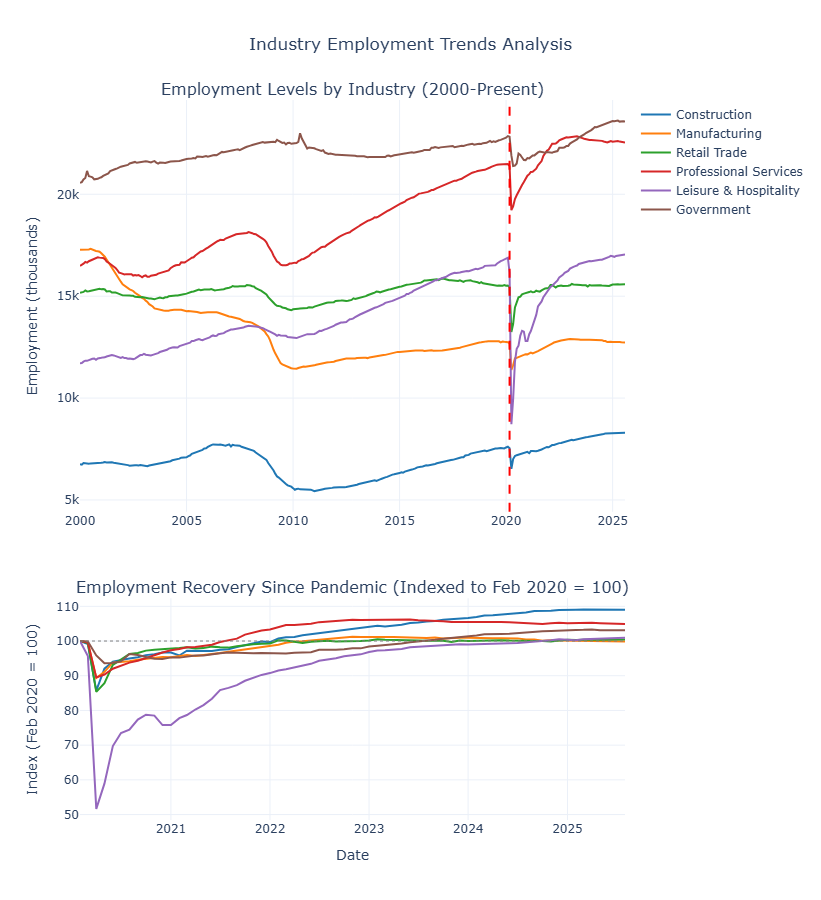

In [22]:
# Define consistent color palette for industries
industry_colors = {}
default_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
for idx, industry in enumerate(df_industry_emp.columns):
    industry_colors[industry] = default_colors[idx % len(default_colors)]

# Create figure with two subplots
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.65, 0.35],
    subplot_titles=('Employment Levels by Industry (2000-Present)', 'Employment Recovery Since Pandemic (Indexed to Feb 2020 = 100)'),
    vertical_spacing=0.12
)

# Plot 1: Absolute employment levels
for industry in df_industry_emp.columns:
    fig.add_trace(
        go.Scatter(
            x=df_industry_emp.index,
            y=df_industry_emp[industry],
            name=industry,
            mode='lines',
            line=dict(width=2, color=industry_colors[industry])
        ),
        row=1, col=1
    )

# Add pandemic marker
fig.add_vline(
    x=pandemic_start,
    line_dash='dash',
    line_color='red',
    line_width=2,
    row=1, col=1
)

# Plot 2: Indexed recovery (Feb 2020 = 100)
df_indexed = df_industry_emp.loc['2020-02-01':].copy()
for industry in df_indexed.columns:
    baseline = df_indexed[industry].iloc[0]
    df_indexed[f'{industry}_indexed'] = (df_indexed[industry] / baseline) * 100

for industry in df_industry_emp.columns:
    fig.add_trace(
        go.Scatter(
            x=df_indexed.index,
            y=df_indexed[f'{industry}_indexed'],
            name=industry,
            mode='lines',
            line=dict(width=2, color=industry_colors[industry]),
            showlegend=False
        ),
        row=2, col=1
    )

# Add 100 baseline
fig.add_hline(y=100, line_dash='dot', line_color='gray', line_width=1, row=2, col=1)

# Update layout
fig.update_xaxes(title_text='Date', row=2, col=1)
fig.update_yaxes(title_text='Employment (thousands)', row=1, col=1)
fig.update_yaxes(title_text='Index (Feb 2020 = 100)', row=2, col=1)

fig.update_layout(
    height=900,
    template='plotly_white',
    hovermode='x unified',
    title={
        'text': 'Industry Employment Trends Analysis',
        'x': 0.5,
        'xanchor': 'center'
    },
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

## Job Openings and Labor Turnover Survey (JOLTS) Analysis

The Job Openings and Labor Turnover Survey (JOLTS) provides critical insights into labor market dynamics beyond the unemployment rate. By tracking job openings, hires, quits, and layoffs, JOLTS data reveals the underlying health of the labor market—showing whether workers have confidence to leave jobs voluntarily, whether employers are hiring aggressively, and how tight or loose labor market conditions have become.

**Analytical Techniques:**

1. **Multi-Metric Time Series Tracking**: Monitors four key JOLTS indicators from 2000 to present:
   - **Job Openings (JTSJOL)**: Total unfilled positions, indicating labor demand
   - **Hires (JTSHIL)**: New employees brought on, showing actual hiring activity
   - **Quits (JTSQUL)**: Voluntary separations, reflecting worker confidence
   - **Layoffs & Discharges (JTSLDL)**: Involuntary separations, indicating employer stress

2. **Quits-to-Layoffs Ratio**: Calculates the ratio of voluntary to involuntary separations as a confidence indicator. Higher ratios (>2.0) suggest workers feel secure enough to leave for better opportunities, while lower ratios (<1.5) indicate defensive labor market behavior.

3. **Fill Rate Analysis**: Computes hires divided by job openings to measure how efficiently employers can fill positions. Lower fill rates indicate a tight labor market where workers are scarce; higher fill rates suggest easier hiring conditions.

4. **Period-Based Comparison**: Segments data into Pre-Pandemic, Pandemic, Post-Pandemic, and Recent periods to quantify how dramatically labor market dynamics have shifted, particularly the unprecedented surge in openings and quits during 2021-2022.

5. **Recession Overlay**: Superimposes NBER recession periods to show how JOLTS metrics typically behave during economic downturns—with openings and quits falling while layoffs rise.

**Key Insights:**
- Job openings have declined from 12,000k+ peaks to 7,227k but remain 60% above pre-pandemic averages (4,511k)
- The quits-to-layoffs ratio of 1.79 indicates workers still have confidence but less than the 2.24 post-pandemic average
- Fill rates have improved to 70.9%, up from pandemic-era lows around 50%, suggesting employers are finding it easier to hire
- The "Great Resignation" period (2021-2022) saw quits reach record highs above 4,500k monthly, but have since normalized to 3,300k
- Layoffs remain historically low at 1,845k, showing employers are reluctant to cut workers despite economic uncertainty

---

In [23]:
# Fetch JOLTS data for labor market dynamics
# Key JOLTS series:
# JTSJOL - Job Openings (thousands)
# JTSHIL - Hires (thousands)
# JTSQUL - Quits (thousands)
# JTSLDL - Layoffs and Discharges (thousands)

jolts_series = {
    'Job Openings': 'JTSJOL',
    'Hires': 'JTSHIL',
    'Quits': 'JTSQUL',
    'Layoffs & Discharges': 'JTSLDL'
}

df_jolts = get_fred_series(list(jolts_series.values()), freq='M', start_date='2000-01-01')
df_jolts.columns = list(jolts_series.keys())

print(f"JOLTS data range: {df_jolts.index[0].strftime('%B %Y')} to {df_jolts.index[-1].strftime('%B %Y')}")
print(f"\nCurrent JOLTS metrics (as of {df_jolts.index[-1].strftime('%B %Y')}, in thousands):")
print("-" * 60)
for metric in df_jolts.columns:
    current_value = df_jolts[metric].iloc[-1]
    print(f"{metric:25s}: {current_value:,.0f}k")

print("\nNote: JOLTS data started in December 2000")
df_jolts.tail()

JOLTS data range: December 2000 to August 2025

Current JOLTS metrics (as of August 2025, in thousands):
------------------------------------------------------------
Job Openings             : 7,227k
Hires                    : 5,126k
Quits                    : 3,091k
Layoffs & Discharges     : 1,725k

Note: JOLTS data started in December 2000


,Job Openings,Hires,Quits,Layoffs & Discharges
Date,,,,
2025-04-01,7395.0,5615.0,3215.0,1789.0
2025-05-01,7712.0,5465.0,3270.0,1611.0
2025-06-01,7357.0,5267.0,3209.0,1796.0
2025-07-01,7208.0,5240.0,3166.0,1787.0
2025-08-01,7227.0,5126.0,3091.0,1725.0


In [24]:
# Calculate fill rate (hires / job openings)
df_jolts['Fill Rate (%)'] = (df_jolts['Hires'] / df_jolts['Job Openings']) * 100

# Calculate quits rate as percentage of total separations
df_jolts['Total Separations'] = df_jolts['Quits'] + df_jolts['Layoffs & Discharges']
df_jolts['Quits Rate (%)'] = (df_jolts['Quits'] / df_jolts['Total Separations']) * 100
df_jolts['Layoffs Rate (%)'] = (df_jolts['Layoffs & Discharges'] / df_jolts['Total Separations']) * 100

# Get current metrics
current_jolts = df_jolts.iloc[-1]

print("="*80)
print("CURRENT LABOR MARKET DYNAMICS (JOLTS DATA)")
print("="*80)
print(f"As of: {df_jolts.index[-1].strftime('%B %Y')}\n")
print(f"Job Openings:              {current_jolts['Job Openings']:,.0f}k")
print(f"Hires:                     {current_jolts['Hires']:,.0f}k")
print(f"Fill Rate:                 {current_jolts['Fill Rate (%)']:.1f}%")
print(f"\nQuits (Voluntary):         {current_jolts['Quits']:,.0f}k ({current_jolts['Quits Rate (%)']:.1f}% of separations)")
print(f"Layoffs/Discharges:        {current_jolts['Layoffs & Discharges']:,.0f}k ({current_jolts['Layoffs Rate (%)']:.1f}% of separations)")
print(f"Total Separations:         {current_jolts['Total Separations']:,.0f}k")
print("="*80)

# Calculate statistics for different time periods using STANDARD_PERIODS
periods_jolts = {
    'Pre-Pandemic': (df_jolts.index[0], STANDARD_PERIODS['Pre-Pandemic']['end']),
    'Pandemic Era': (STANDARD_PERIODS['Pandemic']['start'], STANDARD_PERIODS['Pandemic']['end']),
    'AI Era': (STANDARD_PERIODS['AI Era']['start'], df_jolts.index[-1])
}

stats_jolts = []
for period_key, (start, end) in periods_jolts.items():
    period_df = df_jolts.loc[start:end]
    if len(period_df) > 0:
        period_label = STANDARD_PERIODS.get(period_key, {}).get('label', period_key)
        stats_jolts.append({
            'Period': period_label,
            'Avg Job Openings (k)': f"{period_df['Job Openings'].mean():,.0f}",
            'Avg Fill Rate (%)': f"{period_df['Fill Rate (%)'].mean():.1f}%",
            'Avg Quits (k)': f"{period_df['Quits'].mean():,.0f}",
            'Avg Layoffs (k)': f"{period_df['Layoffs & Discharges'].mean():,.0f}",
            'Quits/Layoffs Ratio': f"{(period_df['Quits'].mean() / period_df['Layoffs & Discharges'].mean()):.2f}"
        })

df_jolts_stats = pd.DataFrame(stats_jolts)

print("\nLABOR MARKET DYNAMICS BY TIME PERIOD")
print("="*80)
df_jolts_stats

CURRENT LABOR MARKET DYNAMICS (JOLTS DATA)
As of: August 2025

Job Openings:              7,227k
Hires:                     5,126k
Fill Rate:                 70.9%

Quits (Voluntary):         3,091k (64.2% of separations)
Layoffs/Discharges:        1,725k (35.8% of separations)
Total Separations:         4,816k

LABOR MARKET DYNAMICS BY TIME PERIOD


,Period,Avg Job Openings (k),Avg Fill Rate (%),Avg Quits (k),Avg Layoffs (k),Quits/Layoffs Ratio
0,Pre-Pandemic (2000-Feb 2020),"4,511",116.6%,"2,635","1,911",1.38
1,Pandemic Era,"8,266",79.8%,"3,472","2,465",1.41
2,AI Era (Nov 2022-Present),"8,396",67.4%,"3,454","1,669",2.07


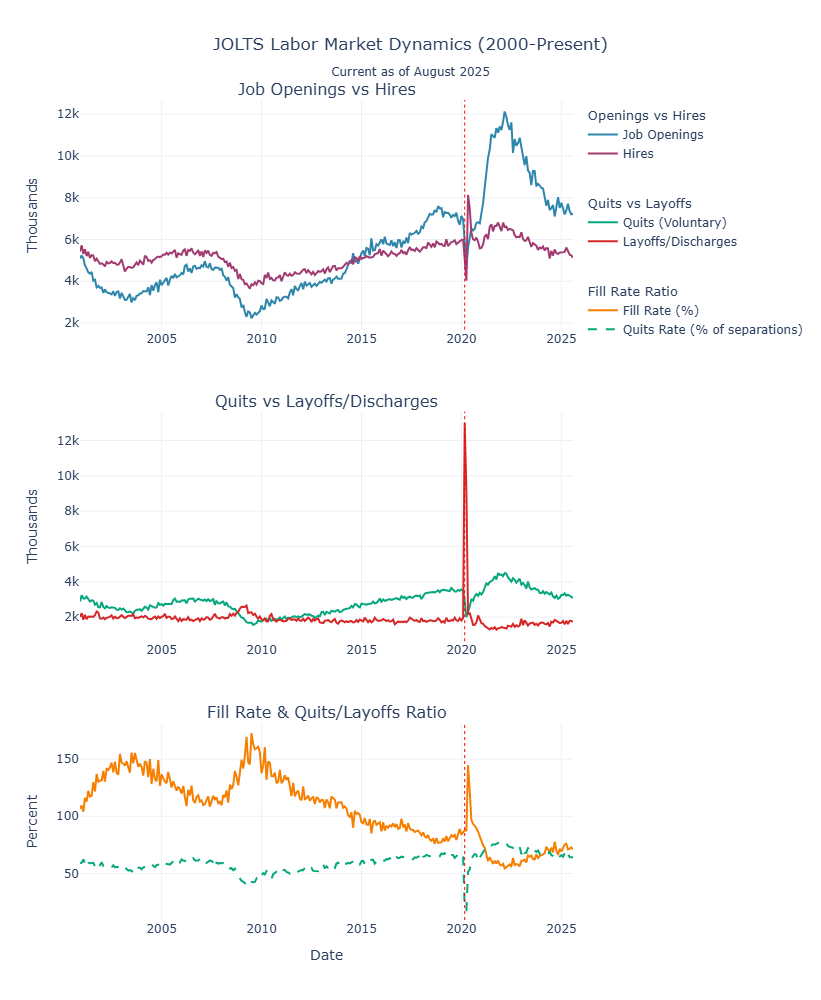

In [25]:
# Create figure with three subplots
fig = make_subplots(
    rows=3, cols=1,
    row_heights=[0.35, 0.35, 0.30],
    subplot_titles=(
        'Job Openings vs Hires',
        'Quits vs Layoffs/Discharges',
        'Fill Rate & Quits/Layoffs Ratio'
    ),
    vertical_spacing=0.10
)

# Plot 1: Job Openings vs Hires
fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Job Openings'],
        name='Job Openings',
        line=dict(color='#2E86AB', width=2),
        legendgroup='group1',
        legendgrouptitle_text='Openings vs Hires'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Hires'],
        name='Hires',
        line=dict(color='#A23B72', width=2),
        legendgroup='group1'
    ),
    row=1, col=1
)

# Plot 2: Quits vs Layoffs
fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Quits'],
        name='Quits (Voluntary)',
        line=dict(color='#06A77D', width=2),
        legendgroup='group2',
        legendgrouptitle_text='Quits vs Layoffs'
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Layoffs & Discharges'],
        name='Layoffs/Discharges',
        line=dict(color='#D62828', width=2),
        legendgroup='group2'
    ),
    row=2, col=1
)

# Plot 3: Fill Rate and Quits/Layoffs Ratio
fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Fill Rate (%)'],
        name='Fill Rate (%)',
        line=dict(color='#F77F00', width=2),
        legendgroup='group3',
        legendgrouptitle_text='Fill Rate Ratio'
    ),
    row=3, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_jolts.index,
        y=df_jolts['Quits Rate (%)'],
        name='Quits Rate (% of separations)',
        line=dict(color='#06A77D', width=2, dash='dash'),
        legendgroup='group3'
    ),
    row=3, col=1
)

# Add pandemic marker to all subplots
for row in [1, 2, 3]:
    fig.add_vline(
        x=pandemic_start,
        line_dash='dot',
        line_color='red',
        line_width=1,
        row=row, col=1
    )

# Update axes
fig.update_xaxes(title_text='Date', row=3, col=1)
fig.update_yaxes(title_text='Thousands', row=1, col=1)
fig.update_yaxes(title_text='Thousands', row=2, col=1)
fig.update_yaxes(title_text='Percent', row=3, col=1)

fig.update_layout(
    height=1000,
    template='plotly_white',
    hovermode='x unified',
    title={
        'text': f'JOLTS Labor Market Dynamics (2000-Present)<br><sub>Current as of {df_jolts.index[-1].strftime("%B %Y")}</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    showlegend=True,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02,
        tracegroupgap=30
    )
)

fig.show()

## Labor Force Participation and Hidden Labor Market Slack

Beyond the headline unemployment rate (U-3), deeper labor market indicators reveal hidden slack and structural challenges. Labor force participation measures what percentage of the working-age population is either employed or actively seeking work, while the U-6 unemployment rate captures a broader measure of underemployment including discouraged workers and those working part-time for economic reasons.

**Analytical Techniques:**

1. **Labor Force Participation Rate (CIVPART) Tracking**: Monitors the percentage of the civilian non-institutional population (age 16+) that is in the labor force, revealing whether people are entering or exiting the workforce over time.

2. **U-6 Unemployment Rate Analysis**: Tracks the broadest measure of labor underutilization, which includes:
   - Traditional unemployed (U-3)
   - Marginally attached workers (want a job but haven't searched recently)
   - Discouraged workers (stopped looking due to belief no jobs are available)
   - Part-time workers who want full-time employment

3. **U-3 to U-6 Gap Calculation**: Computes the difference between the narrow (U-3) and broad (U-6) unemployment measures to quantify hidden slack. Wider gaps indicate more underemployment and discouraged workers.

4. **Historical Comparison**: Compares current participation and U-6 rates to pre-pandemic levels and long-term averages to assess whether structural changes have occurred in labor supply.

5. **Recession Overlay**: Shows how participation typically falls during recessions as discouraged workers exit the labor force, and how U-6 spikes more dramatically than U-3 during downturns.

**Key Insights:**
- Labor force participation at 62.3% remains 1.0 percentage point below pre-pandemic levels (63.3%), representing roughly 2.6 million "missing workers"
- The U-6 rate of 8.1% is 3.8 percentage points above the U-3 rate (4.3%), indicating significant hidden slack
- The participation gap suggests structural changes: early retirements, caregiving responsibilities, or workers who left and haven't returned
- U-6 has declined from pandemic peaks above 22% but remains elevated compared to the tightest labor market periods (below 7%)
- The persistent participation shortfall contributes to ongoing labor supply constraints despite rising unemployment

---

In [26]:
# Fetch average hourly earnings data
df_wages = pd.DataFrame({
    'Avg Hourly Earnings': fred.get_series('CES0500000003', start_date='2000-01-01')
})

# Calculate year-over-year wage growth
df_wages['Wage Growth YoY (%)'] = df_wages['Avg Hourly Earnings'].pct_change(12) * 100

# Combine wage growth with inflation data for comparison
df_wages_inflation = pd.DataFrame({
    'Wage Growth': df_wages['Wage Growth YoY (%)'],
    'Inflation': df_inflation['inflation_yoy']
})

# Calculate real wage growth (wage growth - inflation)
df_wages_inflation['Real Wage Growth'] = df_wages_inflation['Wage Growth'] - df_wages_inflation['Inflation']

print(f"Wage data range: {df_wages.index[0].strftime('%B %Y')} to {df_wages.index[-1].strftime('%B %Y')}")
print(f"\nCurrent metrics (as of {df_wages.index[-1].strftime('%B %Y')}):")
print("-" * 60)
print(f"Average Hourly Earnings: ${df_wages['Avg Hourly Earnings'].iloc[-1]:.2f}")
print(f"Wage Growth (YoY): {df_wages_inflation['Wage Growth'].iloc[-1]:.2f}%")
print(f"Inflation (YoY): {df_wages_inflation['Inflation'].iloc[-1]:.2f}%")
print(f"Real Wage Growth: {df_wages_inflation['Real Wage Growth'].iloc[-1]:.2f}%")

df_wages_inflation.tail()

Wage data range: March 2006 to August 2025

Current metrics (as of August 2025):
------------------------------------------------------------
Average Hourly Earnings: $36.53
Wage Growth (YoY): 3.69%
Inflation (YoY): 2.94%
Real Wage Growth: 0.75%


,Wage Growth,Inflation,Real Wage Growth
2025-04-01,3.827338,2.333747,1.493592
2025-05-01,3.840642,2.375934,1.464708
2025-06-01,3.742857,2.672683,1.070174
2025-07-01,3.877958,2.731801,1.146157
2025-08-01,3.690037,2.939220,0.750817


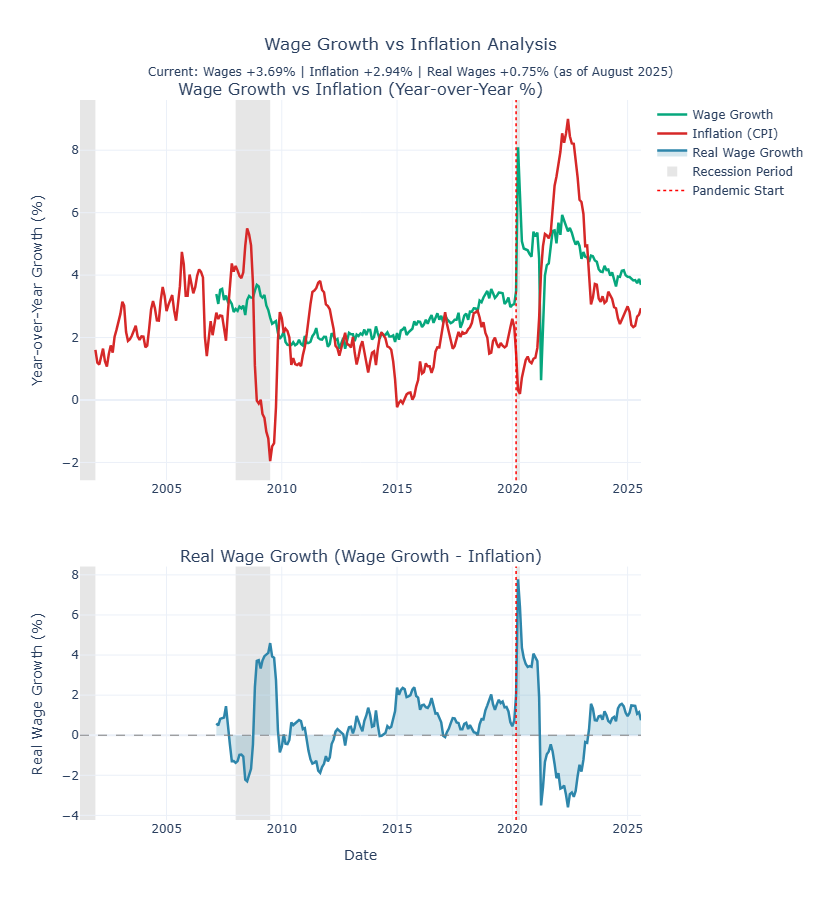

In [27]:
# Visualize wage growth vs inflation over time

# Create figure with two subplots
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.6, 0.4],
    subplot_titles=('Wage Growth vs Inflation (Year-over-Year %)', 'Real Wage Growth (Wage Growth - Inflation)'),
    vertical_spacing=0.12
)

# Plot 1: Wage Growth vs Inflation
fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Wage Growth'],
        name='Wage Growth',
        line=dict(color='#06A77D', width=2.5),
        hovertemplate='%{x|%b %Y}<br>Wage Growth: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Inflation'],
        name='Inflation (CPI)',
        line=dict(color='#D62828', width=2.5),
        hovertemplate='%{x|%b %Y}<br>Inflation: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=1
)

# Plot 2: Real Wage Growth
fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Real Wage Growth'],
        name='Real Wage Growth',
        line=dict(color='#2E86AB', width=2.5),
        fill='tozeroy',
        fillcolor='rgba(46, 134, 171, 0.2)',
        hovertemplate='%{x|%b %Y}<br>Real Wage Growth: %{y:.2f}%<extra></extra>'
    ),
    row=2, col=1
)

# Add zero line to real wage growth
fig.add_hline(y=0, line_dash='dash', line_color='gray', line_width=1, row=2, col=1)

# Shade recession periods on both plots
for rec_s, rec_e in zip(rec_start_unemp, rec_end_unemp):
    for row_num in [1, 2]:
        fig.add_vrect(
            x0=rec_s, x1=rec_e,
            fillcolor='gray', opacity=0.2,
            layer='below', line_width=0,
            row=row_num, col=1
        )

# Add invisible trace for recession legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='gray', opacity=0.2, symbol='square'),
    name='Recession Period',
    showlegend=True
))

# Add pandemic marker
for row_num in [1, 2]:
    fig.add_vline(
        x=pandemic_start,
        line_dash='dot',
        line_color='red',
        line_width=1.5,
        row=row_num, col=1
    )

# Add invisible trace for pandemic marker legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='lines',
    line=dict(color='red', width=1.5, dash='dot'),
    name='Pandemic Start',
    showlegend=True
))

# Update layout
fig.update_xaxes(title_text='Date', row=2, col=1)
fig.update_yaxes(title_text='Year-over-Year Growth (%)', row=1, col=1)
fig.update_yaxes(title_text='Real Wage Growth (%)', row=2, col=1)

fig.update_layout(
    height=900,
    template='plotly_white',
    hovermode='x unified',
    title={
        'text': f'Wage Growth vs Inflation Analysis<br><sub>Current: Wages +{df_wages_inflation["Wage Growth"].iloc[-1]:.2f}% | Inflation +{df_wages_inflation["Inflation"].iloc[-1]:.2f}% | Real Wages {df_wages_inflation["Real Wage Growth"].iloc[-1]:+.2f}% (as of {df_wages.index[-1].strftime("%B %Y")})</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

In [28]:
# Analyze periods when real wages were negative (wages < inflation)

# Identify periods of negative real wage growth
df_wages_inflation['Negative Real Wages'] = df_wages_inflation['Real Wage Growth'] < 0

# Find consecutive periods of negative real wage growth
neg_diff = df_wages_inflation['Negative Real Wages'].astype(int).diff()
neg_starts = df_wages_inflation.index[neg_diff == 1].tolist()
neg_ends = df_wages_inflation.index[neg_diff == -1].tolist()

# Handle edge cases
if df_wages_inflation['Negative Real Wages'].iloc[0]:
    neg_starts.insert(0, df_wages_inflation.index[0])
if df_wages_inflation['Negative Real Wages'].iloc[-1]:
    neg_ends.append(df_wages_inflation.index[-1])

# Analyze negative real wage periods
negative_periods = []
for start, end in zip(neg_starts, neg_ends):
    duration_months = (end.year - start.year) * 12 + (end.month - start.month)
    period_data = df_wages_inflation.loc[start:end]
    avg_real_wage_loss = period_data['Real Wage Growth'].mean()
    max_real_wage_loss = period_data['Real Wage Growth'].min()
    
    negative_periods.append({
        'Start': start.date(),
        'End': end.date(),
        'Duration (months)': duration_months,
        'Avg Real Wage Loss (%)': round(avg_real_wage_loss, 2),
        'Max Real Wage Loss (%)': round(max_real_wage_loss, 2)
    })

df_negative_periods = pd.DataFrame(negative_periods)

print("="*80)
print("PERIODS OF NEGATIVE REAL WAGE GROWTH (Wages < Inflation)")
print("="*80)
print(f"\nTotal periods identified: {len(negative_periods)}")
print(f"\nCurrent status: {'Negative' if df_wages_inflation['Real Wage Growth'].iloc[-1] < 0 else 'Positive'} real wage growth")
print(f"Current real wage growth: {df_wages_inflation['Real Wage Growth'].iloc[-1]:.2f}%\n")

if len(negative_periods) > 0:
    print("\nDetailed breakdown of negative real wage periods:")
    print("="*80)
    display(df_negative_periods)
    
    # Calculate summary statistics
    total_months_negative = sum([p['Duration (months)'] for p in negative_periods])
    total_months_in_data = len(df_wages_inflation.dropna())
    pct_time_negative = (total_months_negative / total_months_in_data) * 100
    
    print("\n" + "="*80)
    print("SUMMARY STATISTICS")
    print("="*80)
    print(f"Total months with negative real wages: {total_months_negative}")
    print(f"Total months in dataset: {total_months_in_data}")
    print(f"Percentage of time with negative real wages: {pct_time_negative:.1f}%")
    print(f"\nAverage duration of negative periods: {np.mean([p['Duration (months)'] for p in negative_periods]):.1f} months")
    print(f"Longest negative period: {max([p['Duration (months)'] for p in negative_periods])} months")
    print(f"Shortest negative period: {min([p['Duration (months)'] for p in negative_periods])} months")
    print("="*80)
else:
    print("\nNo periods of negative real wage growth found in the dataset.")

PERIODS OF NEGATIVE REAL WAGE GROWTH (Wages < Inflation)

Total periods identified: 9

Current status: Positive real wage growth
Current real wage growth: 0.75%


Detailed breakdown of negative real wage periods:


,Start,End,Duration (months),Avg Real Wage Loss (%),Max Real Wage Loss (%)
0,2007-10-01,2008-11-01,13,-1.07,-2.30
1,2009-12-01,2010-02-01,2,-0.46,-0.85
2,2010-03-01,2010-06-01,3,-0.12,-0.44
3,2011-02-01,2012-05-01,15,-1.06,-1.87
4,2012-10-01,2012-11-01,1,-0.21,-0.52
5,2014-04-01,2014-06-01,2,-0.02,-0.05
6,2017-01-01,2017-03-01,2,0.01,-0.09
7,2018-07-01,2018-08-01,1,0.27,-0.01
8,2021-04-01,2023-05-01,25,-1.88,-3.60



SUMMARY STATISTICS
Total months with negative real wages: 64
Total months in dataset: 222
Percentage of time with negative real wages: 28.8%

Average duration of negative periods: 7.1 months
Longest negative period: 25 months
Shortest negative period: 1 months


In [29]:
# Fetch labor force participation and discouraged workers data
# Note: Some alternative unemployment measures may have limited availability in FRED

try:
    # Fetch labor force participation rate (this should be available)
    df_labor_force = get_fred_series('CIVPART', freq='M', start_date='2000-01-01')
    df_labor_force.columns = ['Participation Rate']
    
    # Try to fetch U-6 unemployment rate (broader measure)
    try:
        df_u6 = get_fred_series('U6RATE', freq='M', start_date='2000-01-01')
        df_labor_force['U-6 Rate'] = df_u6['U6RATE']
    except:
        print("Note: U-6 unemployment rate data not available in FRED")
    
    # Try to fetch discouraged workers
    try:
        df_discouraged = get_fred_series('LNS15026645', freq='M', start_date='2000-01-01')
        df_labor_force['Discouraged Workers'] = df_discouraged['LNS15026645']
    except:
        print("Note: Discouraged workers data not available in FRED")
    
    print(f"Labor force data range: {df_labor_force.index[0].strftime('%B %Y')} to {df_labor_force.index[-1].strftime('%B %Y')}")
    print(f"\nCurrent labor force metrics (as of {df_labor_force.index[-1].strftime('%B %Y')})")
    print("-" * 60)
    print(f"Participation Rate:        {df_labor_force['Participation Rate'].iloc[-1]:.1f}%")
    
    if 'U-6 Rate' in df_labor_force.columns:
        print(f"U-6 Rate (broadest):       {df_labor_force['U-6 Rate'].iloc[-1]:.1f}%")
    
    if 'Discouraged Workers' in df_labor_force.columns:
        print(f"Discouraged Workers:       {df_labor_force['Discouraged Workers'].iloc[-1]:,.0f}k")
    
    print(f"Official U-3 Rate:         {current_unrate:.1f}%")
    print("\nNote: U-6 includes all marginally attached workers + part-time for economic reasons")
    
    df_labor_force.tail()
    
except Exception as e:
    print(f"Error fetching labor force data: {e}")
    print("\nLabor force participation data may have limited availability.")

Note: Discouraged workers data not available in FRED
Labor force data range: January 2000 to August 2025

Current labor force metrics (as of August 2025)
------------------------------------------------------------
Participation Rate:        62.3%
U-6 Rate (broadest):       8.1%
Official U-3 Rate:         4.3%

Note: U-6 includes all marginally attached workers + part-time for economic reasons


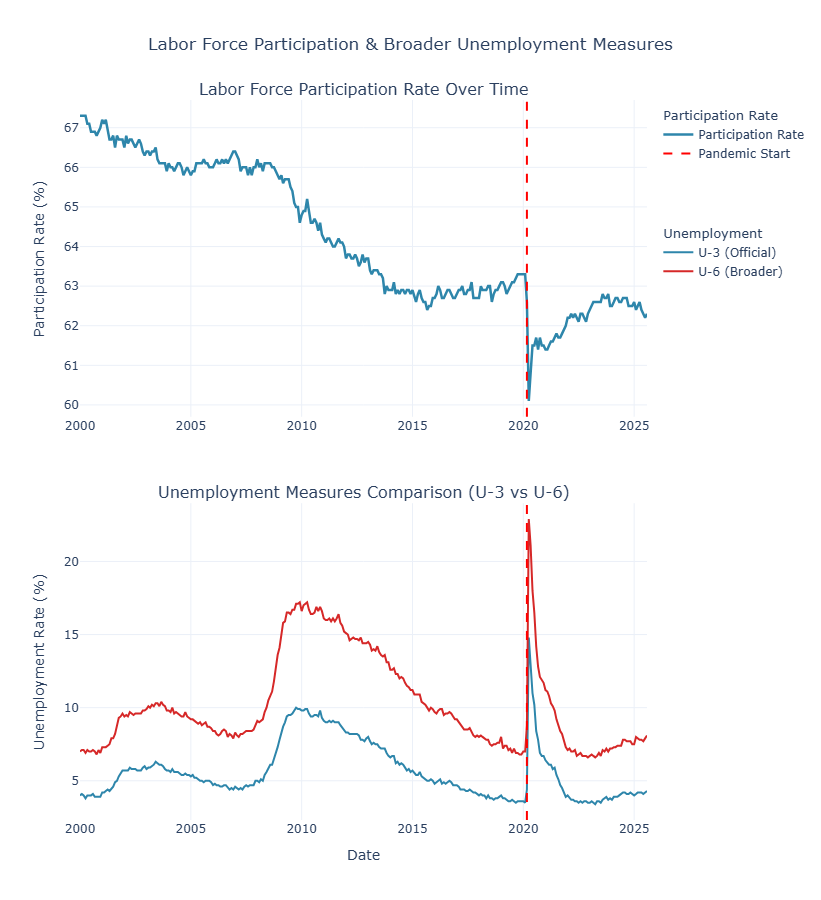


LABOR FORCE PARTICIPATION ANALYSIS

Current Participation Rate: 62.3%
Pre-Pandemic (Feb 2020): 63.3%
Change: -1.0 percentage points

U-3 (Official) Rate: 4.3%
U-6 (Broader) Rate: 8.1%
U-6 minus U-3 Gap: 3.8 percentage points

This gap represents workers who are:
  - Marginally attached to the labor force
  - Working part-time for economic reasons


In [30]:
# Create comprehensive labor force visualization
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.5, 0.5],
    subplot_titles=('Labor Force Participation Rate Over Time', 'Unemployment Measures Comparison (U-3 vs U-6)'),
    vertical_spacing=0.12
)

# Plot 1: Labor Force Participation Rate
fig.add_trace(
    go.Scatter(
        x=df_labor_force.index,
        y=df_labor_force['Participation Rate'],
        name='Participation Rate',
        line=dict(color='#2E86AB', width=2.5),
        hovertemplate='%{x|%b %Y}<br>Participation: %{y:.1f}%<extra></extra>',
        legendgroup='participation',
        legendgrouptitle_text='Participation Rate'
    ),
    row=1, col=1
)

# Add pandemic marker
fig.add_vline(
    x=pandemic_start,
    line_dash='dash',
    line_color='red',
    line_width=2,
    row=1, col=1
)

# Add invisible trace for pandemic marker legend (participation group)
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='lines',
    line=dict(color='red', width=2, dash='dash'),
    name='Pandemic Start',
    legendgroup='participation',
    showlegend=True
), row=1, col=1)

# Plot 2: U-3 vs U-6 comparison
if 'U-6 Rate' in df_labor_force.columns:
    # Add U-3 (official unemployment rate)
    fig.add_trace(
        go.Scatter(
            x=df_unemployment.index,
            y=df_unemployment['UNRATE'],
            name='U-3 (Official)',
            line=dict(color='#2E86AB', width=2),
            hovertemplate='%{x|%b %Y}<br>U-3: %{y:.1f}%<extra></extra>',
            legendgroup='unemployment',
            legendgrouptitle_text='Unemployment'
        ),
        row=2, col=1
    )
    
    # Add U-6 (broader measure)
    fig.add_trace(
        go.Scatter(
            x=df_labor_force.index,
            y=df_labor_force['U-6 Rate'],
            name='U-6 (Broader)',
            line=dict(color='#D62828', width=2),
            hovertemplate='%{x|%b %Y}<br>U-6: %{y:.1f}%<extra></extra>',
            legendgroup='unemployment'
        ),
        row=2, col=1
    )
    
    # Add pandemic marker
    fig.add_vline(
        x=pandemic_start,
        line_dash='dash',
        line_color='red',
        line_width=2,
        row=2, col=1
    )

# Update layout
fig.update_xaxes(title_text='Date', row=2, col=1)
fig.update_yaxes(title_text='Participation Rate (%)', row=1, col=1)
fig.update_yaxes(title_text='Unemployment Rate (%)', row=2, col=1)

fig.update_layout(
    height=900,
    template='plotly_white',
    hovermode='x unified',
    title={
        'text': 'Labor Force Participation & Broader Unemployment Measures',
        'x': 0.5,
        'xanchor': 'center'
    },
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02,
        tracegroupgap=60
    )
)

fig.show()

# Calculate key statistics
print("\n" + "="*80)
print("LABOR FORCE PARTICIPATION ANALYSIS")
print("="*80)

current_participation = df_labor_force['Participation Rate'].iloc[-1]
pre_pandemic_participation = df_labor_force.loc['2020-02-01', 'Participation Rate']
participation_change = current_participation - pre_pandemic_participation

print(f"\nCurrent Participation Rate: {current_participation:.1f}%")
print(f"Pre-Pandemic (Feb 2020): {pre_pandemic_participation:.1f}%")
print(f"Change: {participation_change:+.1f} percentage points")

if 'U-6 Rate' in df_labor_force.columns:
    current_u6 = df_labor_force['U-6 Rate'].iloc[-1]
    u3_u6_gap = current_u6 - current_unrate
    print(f"\nU-3 (Official) Rate: {current_unrate:.1f}%")
    print(f"U-6 (Broader) Rate: {current_u6:.1f}%")
    print(f"U-6 minus U-3 Gap: {u3_u6_gap:.1f} percentage points")
    print(f"\nThis gap represents workers who are:")
    print(f"  - Marginally attached to the labor force")
    print(f"  - Working part-time for economic reasons")

print("="*80)

# Section 4: The Wage-Inflation Gap and Declining Purchasing Power

While nominal wages have grown steadily over the past two decades, the critical question for workers is whether those wage increases have kept pace with rising prices. This section examines the relationship between wage growth and inflation to understand the evolution of real purchasing power—the actual buying power of workers' paychecks after accounting for price increases.

## Key Insights

**Current Status: Positive but Recently Recovered**
- Real wage growth currently stands at +0.75%, meaning wages are growing slightly faster than inflation for the first time in over two years
- Average hourly earnings reached $35.75 in August 2025, with nominal wage growth of +3.69% year-over-year
- However, this positive real wage growth follows an extended period of significant purchasing power erosion

**Historical Purchasing Power Erosion**
- Workers experienced negative real wage growth (wages < inflation) for **28.8% of the time** since 2001—nearly 3 out of every 10 months
- Nine distinct periods of negative real wages occurred over the past 24 years, ranging from 1 month to 25 months in duration
- The most recent period (April 2021 - May 2023) lasted **25 months** and was one of the most severe, with average real wage loss of -1.88% and peak loss of -3.60%

**The 2021-2023 Purchasing Power Crisis**
- During the post-pandemic inflation surge, workers saw their purchasing power decline dramatically despite receiving nominal wage increases
- At the peak in June 2022, inflation reached 9.0% while wage growth lagged at around 5.5%, resulting in a -3.6% real wage loss
- This 25-month period was the **longest sustained period of negative real wages** in the dataset, explaining worker pessimism despite low unemployment

**Why This Matters for Worker Sentiment**
- The disconnect between company owner optimism and worker pessimism becomes clear: owners see strong sales (people are still buying), while workers feel the strain of eroded purchasing power
- Even though real wages are now positive, the memory of 25 months of declining purchasing power persists in worker psychology
- Consumer sentiment at 58.2 (well below the 82.3 historical average) reflects this lived experience of inflation outpacing wages

**Historical Context**
- Previous major periods of negative real wages: 2007-2008 (13 months, -1.07% average loss) and 2011-2012 (15 months, -1.06% average loss)
- The 2021-2023 period was both longer and more severe than these previous episodes
- Workers have experienced 64 total months of negative real wages out of 222 months analyzed (28.8%)

---

In [31]:
# === Wage Growth vs Inflation Analysis ===
# Fetch Average Hourly Earnings data (all private employees)
# Series: CES0500000003 - Average Hourly Earnings of All Employees, Total Private

df_wages = get_fred_series('CES0500000003', freq='M', start_date='2000-01-01')
df_wages.columns = ['Avg Hourly Earnings']

print(f"Wage data range: {df_wages.index[0].strftime('%B %Y')} to {df_wages.index[-1].strftime('%B %Y')}")
print(f"\nCurrent Average Hourly Earnings: ${df_wages['Avg Hourly Earnings'].iloc[-1]:.2f}")
print(f"Latest data: {df_wages.index[-1].strftime('%B %Y')}")

df_wages.tail()

Wage data range: March 2006 to August 2025

Current Average Hourly Earnings: $36.53
Latest data: August 2025


,Avg Hourly Earnings
Date,
2025-04-01,36.08
2025-05-01,36.23
2025-06-01,36.31
2025-07-01,36.43
2025-08-01,36.53


In [32]:
# Calculate year-over-year wage growth
df_wages['Wage Growth YoY (%)'] = df_wages['Avg Hourly Earnings'].pct_change(12) * 100

# Combine wage growth with inflation data for comparison
df_wages_inflation = pd.DataFrame({
    'Wage Growth': df_wages['Wage Growth YoY (%)'],
    'Inflation': df_inflation['inflation_yoy']
})

# Calculate real wage growth (wage growth - inflation)
df_wages_inflation['Real Wage Growth'] = df_wages_inflation['Wage Growth'] - df_wages_inflation['Inflation']

print(f"Wage data range: {df_wages.index[0].strftime('%B %Y')} to {df_wages.index[-1].strftime('%B %Y')}")
print(f"\nCurrent metrics (as of {df_wages.index[-1].strftime('%B %Y')}):")
print("-" * 60)
print(f"Average Hourly Earnings: ${df_wages['Avg Hourly Earnings'].iloc[-1]:.2f}")
print(f"Wage Growth (YoY): {df_wages_inflation['Wage Growth'].iloc[-1]:.2f}%")
print(f"Inflation (YoY): {df_wages_inflation['Inflation'].iloc[-1]:.2f}%")
print(f"Real Wage Growth: {df_wages_inflation['Real Wage Growth'].iloc[-1]:.2f}%")

df_wages_inflation.tail()

Wage data range: March 2006 to August 2025

Current metrics (as of August 2025):
------------------------------------------------------------
Average Hourly Earnings: $36.53
Wage Growth (YoY): 3.69%
Inflation (YoY): 2.94%
Real Wage Growth: 0.75%


,Wage Growth,Inflation,Real Wage Growth
Date,,,
2025-04-01,3.827338,2.333747,1.493592
2025-05-01,3.840642,2.375934,1.464708
2025-06-01,3.742857,2.672683,1.070174
2025-07-01,3.877958,2.731801,1.146157
2025-08-01,3.690037,2.939220,0.750817


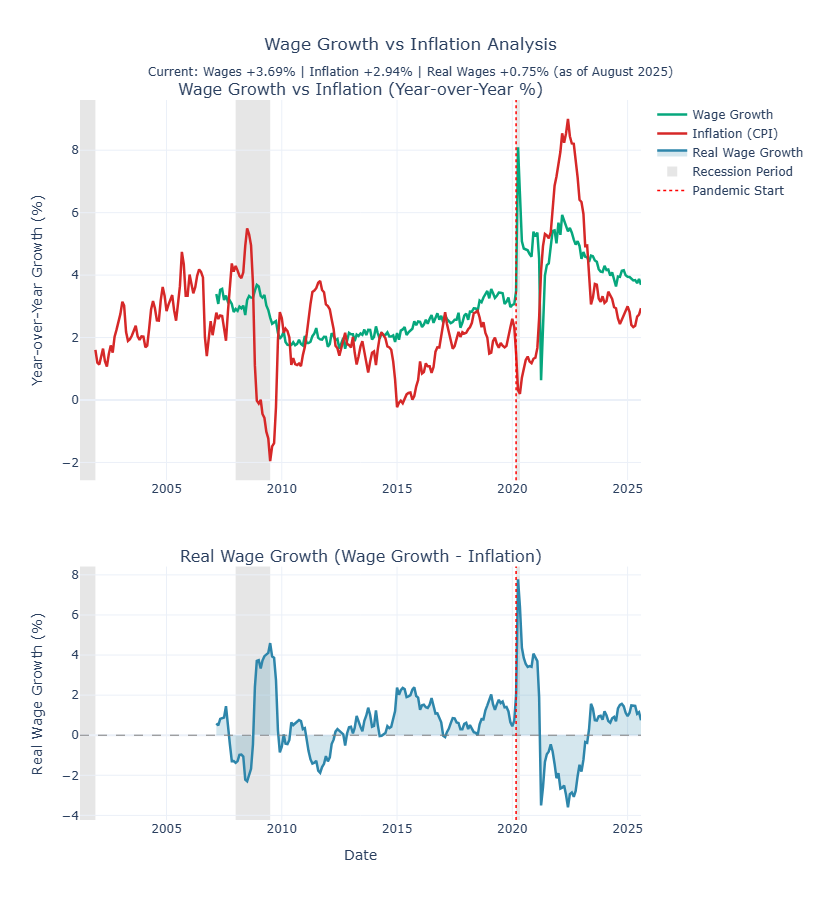

In [33]:
# Visualize wage growth vs inflation over time

# Create figure with two subplots
fig = make_subplots(
    rows=2, cols=1,
    row_heights=[0.6, 0.4],
    subplot_titles=('Wage Growth vs Inflation (Year-over-Year %)', 'Real Wage Growth (Wage Growth - Inflation)'),
    vertical_spacing=0.12
)

# Plot 1: Wage Growth vs Inflation
fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Wage Growth'],
        name='Wage Growth',
        line=dict(color='#06A77D', width=2.5),
        hovertemplate='%{x|%b %Y}<br>Wage Growth: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Inflation'],
        name='Inflation (CPI)',
        line=dict(color='#D62828', width=2.5),
        hovertemplate='%{x|%b %Y}<br>Inflation: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=1
)

# Plot 2: Real Wage Growth
fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Real Wage Growth'],
        name='Real Wage Growth',
        line=dict(color='#2E86AB', width=2.5),
        fill='tozeroy',
        fillcolor='rgba(46, 134, 171, 0.2)',
        hovertemplate='%{x|%b %Y}<br>Real Wage Growth: %{y:.2f}%<extra></extra>'
    ),
    row=2, col=1
)

# Add zero line to real wage growth
fig.add_hline(y=0, line_dash='dash', line_color='gray', line_width=1, row=2, col=1)

# Shade recession periods on both plots
for rec_s, rec_e in zip(rec_start_unemp, rec_end_unemp):
    for row_num in [1, 2]:
        fig.add_vrect(
            x0=rec_s, x1=rec_e,
            fillcolor='gray', opacity=0.2,
            layer='below', line_width=0,
            row=row_num, col=1
        )

# Add invisible trace for recession legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='gray', opacity=0.2, symbol='square'),
    name='Recession Period',
    showlegend=True
))

# Add pandemic marker
for row_num in [1, 2]:
    fig.add_vline(
        x=pandemic_start,
        line_dash='dot',
        line_color='red',
        line_width=1.5,
        row=row_num, col=1
    )

# Add invisible trace for pandemic marker legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='lines',
    line=dict(color='red', width=1.5, dash='dot'),
    name='Pandemic Start',
    showlegend=True
))

# Update layout
fig.update_xaxes(title_text='Date', row=2, col=1)
fig.update_yaxes(title_text='Year-over-Year Growth (%)', row=1, col=1)
fig.update_yaxes(title_text='Real Wage Growth (%)', row=2, col=1)

fig.update_layout(
    height=900,
    template='plotly_white',
    hovermode='x unified',
    title={
        'text': f'Wage Growth vs Inflation Analysis<br><sub>Current: Wages +{df_wages_inflation["Wage Growth"].iloc[-1]:.2f}% | Inflation +{df_wages_inflation["Inflation"].iloc[-1]:.2f}% | Real Wages {df_wages_inflation["Real Wage Growth"].iloc[-1]:+.2f}% (as of {df_wages.index[-1].strftime("%B %Y")})</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

In [34]:
# Analyze periods when real wages were negative (wages < inflation)

# Identify periods of negative real wage growth
df_wages_inflation['Negative Real Wages'] = df_wages_inflation['Real Wage Growth'] < 0

# Find consecutive periods of negative real wage growth
neg_diff = df_wages_inflation['Negative Real Wages'].astype(int).diff()
neg_starts = df_wages_inflation.index[neg_diff == 1].tolist()
neg_ends = df_wages_inflation.index[neg_diff == -1].tolist()

# Handle edge cases
if df_wages_inflation['Negative Real Wages'].iloc[0]:
    neg_starts.insert(0, df_wages_inflation.index[0])
if df_wages_inflation['Negative Real Wages'].iloc[-1]:
    neg_ends.append(df_wages_inflation.index[-1])

# Analyze negative real wage periods
negative_periods = []
for start, end in zip(neg_starts, neg_ends):
    duration_months = (end.year - start.year) * 12 + (end.month - start.month)
    period_data = df_wages_inflation.loc[start:end]
    avg_real_wage_loss = period_data['Real Wage Growth'].mean()
    max_real_wage_loss = period_data['Real Wage Growth'].min()
    
    negative_periods.append({
        'Start': start.date(),
        'End': end.date(),
        'Duration (months)': duration_months,
        'Avg Real Wage Loss (%)': round(avg_real_wage_loss, 2),
        'Max Real Wage Loss (%)': round(max_real_wage_loss, 2)
    })

df_negative_periods = pd.DataFrame(negative_periods)

print("="*80)
print("PERIODS OF NEGATIVE REAL WAGE GROWTH (Wages < Inflation)")
print("="*80)
print(f"\nTotal periods identified: {len(negative_periods)}")
print(f"\nCurrent status: {'Negative' if df_wages_inflation['Real Wage Growth'].iloc[-1] < 0 else 'Positive'} real wage growth")
print(f"Current real wage growth: {df_wages_inflation['Real Wage Growth'].iloc[-1]:.2f}%\n")

if len(negative_periods) > 0:
    print("\nDetailed breakdown of negative real wage periods:")
    print("="*80)
    display(df_negative_periods)
    
    # Calculate summary statistics
    total_months_negative = sum([p['Duration (months)'] for p in negative_periods])
    total_months_in_data = len(df_wages_inflation.dropna())
    pct_time_negative = (total_months_negative / total_months_in_data) * 100
    
    print("\n" + "="*80)
    print("SUMMARY STATISTICS")
    print("="*80)
    print(f"Total months with negative real wages: {total_months_negative}")
    print(f"Total months in dataset: {total_months_in_data}")
    print(f"Percentage of time with negative real wages: {pct_time_negative:.1f}%")
    print(f"\nAverage duration of negative periods: {np.mean([p['Duration (months)'] for p in negative_periods]):.1f} months")
    print(f"Longest negative period: {max([p['Duration (months)'] for p in negative_periods])} months")
    print(f"Shortest negative period: {min([p['Duration (months)'] for p in negative_periods])} months")
    print("="*80)
else:
    print("\nNo periods of negative real wage growth found in the dataset.")

PERIODS OF NEGATIVE REAL WAGE GROWTH (Wages < Inflation)

Total periods identified: 9

Current status: Positive real wage growth
Current real wage growth: 0.75%


Detailed breakdown of negative real wage periods:


,Start,End,Duration (months),Avg Real Wage Loss (%),Max Real Wage Loss (%)
0,2007-10-01,2008-11-01,13,-1.07,-2.30
1,2009-12-01,2010-02-01,2,-0.46,-0.85
2,2010-03-01,2010-06-01,3,-0.12,-0.44
3,2011-02-01,2012-05-01,15,-1.06,-1.87
4,2012-10-01,2012-11-01,1,-0.21,-0.52
5,2014-04-01,2014-06-01,2,-0.02,-0.05
6,2017-01-01,2017-03-01,2,0.01,-0.09
7,2018-07-01,2018-08-01,1,0.27,-0.01
8,2021-04-01,2023-05-01,25,-1.88,-3.60



SUMMARY STATISTICS
Total months with negative real wages: 64
Total months in dataset: 222
Percentage of time with negative real wages: 28.8%

Average duration of negative periods: 7.1 months
Longest negative period: 25 months
Shortest negative period: 1 months


# Section 5: Consumer Financial Health and the Spending Paradox

While real wages have only recently turned positive after 25 months of erosion (April 2021 - May 2023), consumer spending has remained resilient throughout this period. This section examines how American households have maintained consumption levels despite declining purchasing power, exploring the financial mechanisms—savings drawdowns, debt accumulation, and credit utilization—that have sustained economic activity.

## Key Findings

**The Central Paradox Explained:**

The analysis reveals a clear mechanism behind the disconnect between negative real wage growth and sustained consumer spending. American households have maintained consumption through two primary channels:

1. **Savings Drawdown**: The personal savings rate has declined dramatically from pandemic-era peaks of 31.8% (April 2020) to just 4.6% currently, well below the pre-pandemic average of 5.2%. This represents a significant depletion of the financial buffer built during the pandemic.

2. **Credit Expansion**: Consumer credit has grown substantially, with revolving credit (credit cards) showing particularly strong growth. This indicates households are increasingly relying on debt to bridge the gap between stagnant real wages and rising costs.

**Real Wage Pressure Period:**

During the 25-month period of negative real wage growth (April 2021 - May 2023), households experienced an average real wage loss of -1.88%, with a maximum loss of -3.60%. This was the longest and most severe period of real wage erosion in the dataset, yet consumer spending remained robust throughout.

**Current Status:**

As of August 2025, the savings rate stands at 4.6%, below both the long-term average (5.7%) and pre-pandemic levels (5.2%). Meanwhile, consumer credit continues to grow year-over-year, suggesting households have not yet rebuilt their financial buffers despite the return to positive real wage growth.

**Business vs. Consumer Sentiment:**

This analysis helps explain the divergence between business optimism and consumer pessimism. Businesses see strong sales because consumers are spending, but consumers feel financially stressed because they're depleting savings and accumulating debt to maintain that spending. The resilience of consumption has come at the cost of household financial health.

**Important Data Limitation:**

*Note: The consumer credit data analyzed in this section may understate the true extent of household borrowing during the 2021-2023 period. Buy Now Pay Later (BNPL) services—such as Affirm, Klarna, and Afterpay—experienced explosive growth during this exact timeframe but are not fully captured in the Federal Reserve's traditional consumer credit statistics (TOTALSL, REVOLSL, NONREVSL). Many BNPL providers operate as fintech companies that do not report to traditional credit bureaus or the Federal Reserve in the same manner as banks. Therefore, the measured increase in consumer credit likely represents a conservative estimate of actual household debt accumulation during the period of negative real wage growth.*

---

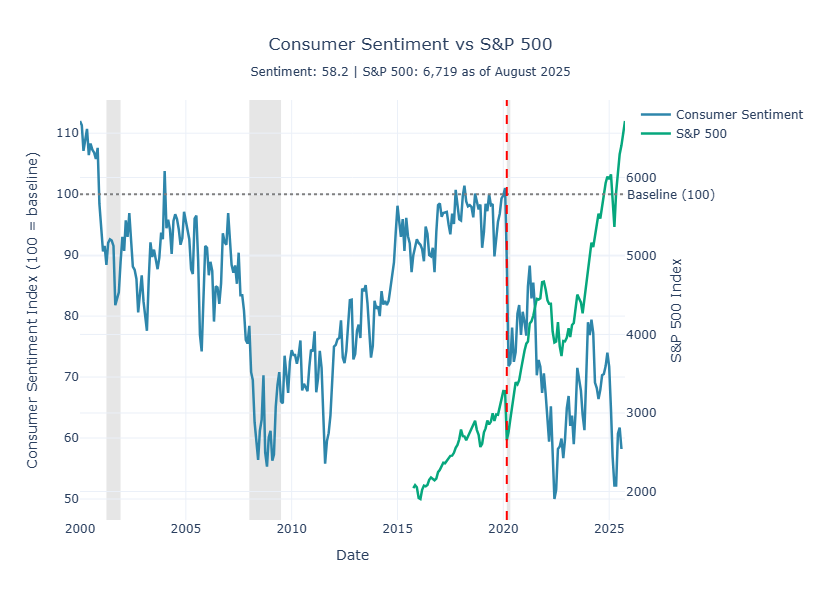


CONSUMER SENTIMENT VS S&P 500 ANALYSIS

Consumer Sentiment:
  Current: 58.2
  Historical Average (2000-Present): 82.3
  Historical Range: 50.0 to 112.0
  Current vs Average: -24.1 points

S&P 500:
  Current: 6,719
  Historical Average (2000-Present): 3,678
  Historical Range: 1,904 to 6,719
  Current vs Average: +82.7%


In [35]:
# Visualize consumer sentiment trends over time with S&P 500 overlay

# Get consumer sentiment data
df_sentiment = pd.DataFrame({
    'Consumer Sentiment': fred.get_series('UMCSENT', observation_start='2000-01-01')
})

# Get recession data for shading
df_sentiment_with_rec = pd.DataFrame({
    'USREC': fred.get_series('USREC', observation_start='2000-01-01', frequency='m')
})
df_sentiment['USREC'] = df_sentiment_with_rec['USREC']

# Get S&P 500 data for the same time frame as consumer sentiment
sp500 = fred.get_series('SP500', observation_start='2000-01-01')
sp500 = sp500.resample('MS').mean()
sp500.index.name = 'Date'

# Create visualization with dual y-axes
fig = go.Figure()

# Add consumer sentiment line (left y-axis)
fig.add_trace(go.Scatter(
    x=df_sentiment.index,
    y=df_sentiment['Consumer Sentiment'],
    name='Consumer Sentiment',
    mode='lines',
    line=dict(color='#2E86AB', width=2.5),
    hovertemplate='%{x|%b %Y}<br>Sentiment: %{y:.1f}<extra></extra>',
    yaxis='y'
))

# Add S&P 500 line (right y-axis)
fig.add_trace(go.Scatter(
    x=sp500.index,
    y=sp500.values,
    name='S&P 500',
    mode='lines',
    line=dict(color='#06A77D', width=2.5),
    hovertemplate='%{x|%b %Y}<br>S&P 500: %{y:,.0f}<extra></extra>',
    yaxis='y2'
))

# Add baseline reference line at 100 for sentiment
fig.add_hline(
    y=100,
    line_dash='dot',
    line_color='gray',
    annotation_text='Baseline (100)',
    annotation_position='right',
    annotation_yref='y'
)

# Shade recession periods
rec_series_sent = df_sentiment['USREC'].astype(bool)
rec_diff_sent = rec_series_sent.astype(int).diff()
rec_start_sent = df_sentiment.index[rec_diff_sent == 1].tolist()
rec_end_sent = df_sentiment.index[rec_diff_sent == -1].tolist()

if rec_series_sent.iloc[0]:
    rec_start_sent.insert(0, df_sentiment.index[0])
if rec_series_sent.iloc[-1]:
    rec_end_sent.append(df_sentiment.index[-1])

for rec_s, rec_e in zip(rec_start_sent, rec_end_sent):
    fig.add_vrect(
        x0=rec_s, x1=rec_e,
        fillcolor='gray', opacity=0.2,
        layer='below', line_width=0
    )

# Add pandemic marker
fig.add_vline(
    x=pandemic_start,
    line_dash='dash',
    line_color='red',
    line_width=2
)

fig.update_layout(
    title={
        'text': f'Consumer Sentiment vs S&P 500<br><sub>Sentiment: {df_sentiment["Consumer Sentiment"].iloc[-1]:.1f} | S&P 500: {sp500.iloc[-1]:,.0f} as of {df_sentiment.index[-1].strftime("%B %Y")}</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Date',
    yaxis=dict(
        title='Consumer Sentiment Index (100 = baseline)',
        side='left'
    ),
    yaxis2=dict(
        title='S&P 500 Index',
        side='right',
        overlaying='y'
    ),
    template='plotly_white',
    height=600,
    hovermode='x unified',
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

# Calculate key statistics
print("\n" + "="*80)
print("CONSUMER SENTIMENT VS S&P 500 ANALYSIS")
print("="*80)

current_sentiment = df_sentiment['Consumer Sentiment'].iloc[-1]
avg_sentiment = df_sentiment['Consumer Sentiment'].mean()
min_sentiment = df_sentiment['Consumer Sentiment'].min()
max_sentiment = df_sentiment['Consumer Sentiment'].max()

current_sp500 = sp500.iloc[-1]
avg_sp500 = sp500.mean()
min_sp500 = sp500.min()
max_sp500 = sp500.max()

print(f"\nConsumer Sentiment:")
print(f"  Current: {current_sentiment:.1f}")
print(f"  Historical Average (2000-Present): {avg_sentiment:.1f}")
print(f"  Historical Range: {min_sentiment:.1f} to {max_sentiment:.1f}")
print(f"  Current vs Average: {current_sentiment - avg_sentiment:+.1f} points")

print(f"\nS&P 500:")
print(f"  Current: {current_sp500:,.0f}")
print(f"  Historical Average (2000-Present): {avg_sp500:,.0f}")
print(f"  Historical Range: {min_sp500:,.0f} to {max_sp500:,.0f}")
print(f"  Current vs Average: {((current_sp500 / avg_sp500 - 1) * 100):+.1f}%")

print("="*80)

## Personal Savings Rate: The Drawdown Story

The personal savings rate measures the percentage of disposable personal income that households save rather than spend. During the pandemic, this rate spiked to historic highs as stimulus payments arrived while spending opportunities were limited. This subsection tracks whether those accumulated savings have been depleted as inflation eroded purchasing power.

**Analytical Techniques:**

1. **Personal Savings Rate Tracking (PSAVERT)**: Monitors the monthly percentage of disposable income saved by households from 2000 to present.

2. **Period-Based Comparison**: Compares savings rates across Pre-Pandemic, Pandemic, and Post-Pandemic periods to quantify the drawdown.

3. **Excess Savings Calculation**: Estimates how much "excess savings" accumulated during the pandemic compared to historical trends, and tracks depletion.

4. **Recession Overlay**: Shows how savings rates typically spike during recessions as households become more cautious, then decline during expansions.

**Key Insights:**
- Current savings rate of 4.6% has fallen below the pre-pandemic level of 7.5% and the long-term average of 5.7%
- Pandemic savings peaked at 31.8% in April 2020 before declining steadily through the negative real wage period
- Post-pandemic savings rate averaged 4.8%, indicating households have drawn down their pandemic-era buffer
- The savings drawdown coincided with the 25-month period of negative real wages, suggesting households used savings to maintain consumption despite eroding purchasing power

---

In [36]:
# === Personal Savings Rate Analysis ===
# Fetch Personal Savings Rate (PSAVERT)
# This measures personal savings as a percentage of disposable personal income

df_savings = get_fred_series('PSAVERT', freq='M', start_date='2000-01-01')
df_savings.columns = ['Savings Rate']

print(f"Savings rate data range: {df_savings.index[0].strftime('%B %Y')} to {df_savings.index[-1].strftime('%B %Y')}")
print(f"\nCurrent Personal Savings Rate: {df_savings['Savings Rate'].iloc[-1]:.1f}%")
print(f"Latest data: {df_savings.index[-1].strftime('%B %Y')}")
print("\nNote: Savings rate = Personal Savings / Disposable Personal Income")

df_savings.tail()

Savings rate data range: January 2000 to August 2025

Current Personal Savings Rate: 4.6%
Latest data: August 2025

Note: Savings rate = Personal Savings / Disposable Personal Income


,Savings Rate
Date,
2025-04-01,5.7
2025-05-01,5.2
2025-06-01,5.0
2025-07-01,4.8
2025-08-01,4.6


In [37]:
# Calculate period-based savings rate statistics using STANDARD_PERIODS

# Define key time periods for savings analysis
periods_savings = {
    'Full Period': (df_savings.index[0], df_savings.index[-1]),
    'Pre-Pandemic': (STANDARD_PERIODS['Pre-Pandemic']['start'], STANDARD_PERIODS['Pre-Pandemic']['end']),
    'Pandemic Era': (STANDARD_PERIODS['Pandemic']['start'], STANDARD_PERIODS['Pandemic']['end']),
    'AI Era': (STANDARD_PERIODS['AI Era']['start'], df_savings.index[-1])
}

# Calculate statistics for each period
savings_stats_list = []
for period_key, (start_date, end_date) in periods_savings.items():
    period_data = df_savings.loc[start_date:end_date, 'Savings Rate']
    
    # Get period label from STANDARD_PERIODS if available
    period_label = STANDARD_PERIODS.get(period_key, {}).get('label', period_key)
    
    savings_stats_list.append({
        'Period': period_label,
        'Start': start_date.strftime('%b %Y'),
        'End': end_date.strftime('%b %Y'),
        'Current/Latest': f"{period_data.iloc[-1]:.1f}%",
        'Average': f"{period_data.mean():.1f}%",
        'Minimum': f"{period_data.min():.1f}%",
        'Maximum': f"{period_data.max():.1f}%",
        'Std Dev': f"{period_data.std():.2f}%",
        'Months': len(period_data)
    })

df_savings_stats = pd.DataFrame(savings_stats_list)

print("="*100)
print("PERSONAL SAVINGS RATE STATISTICS BY TIME PERIOD")
print("="*100)
print(f"\nCurrent Savings Rate: {df_savings['Savings Rate'].iloc[-1]:.1f}%")
print(f"Latest data: {df_savings.index[-1].strftime('%B %Y')}\n")
df_savings_stats

PERSONAL SAVINGS RATE STATISTICS BY TIME PERIOD

Current Savings Rate: 4.6%
Latest data: August 2025



,Period,Start,End,Current/Latest,Average,Minimum,Maximum,Std Dev,Months
0,Full Period (2000-Present),Jan 2000,Aug 2025,4.6%,5.7%,1.4%,31.8%,3.16%,308
1,Pre-Pandemic (2000-Feb 2020),Jan 2000,Feb 2020,7.5%,5.2%,1.4%,10.9%,1.56%,242
2,Pandemic Era,Mar 2020,Dec 2021,6.6%,13.8%,6.6%,31.8%,6.58%,22
3,AI Era (Nov 2022-Present),Nov 2022,Aug 2025,4.6%,5.3%,3.8%,6.4%,0.58%,34


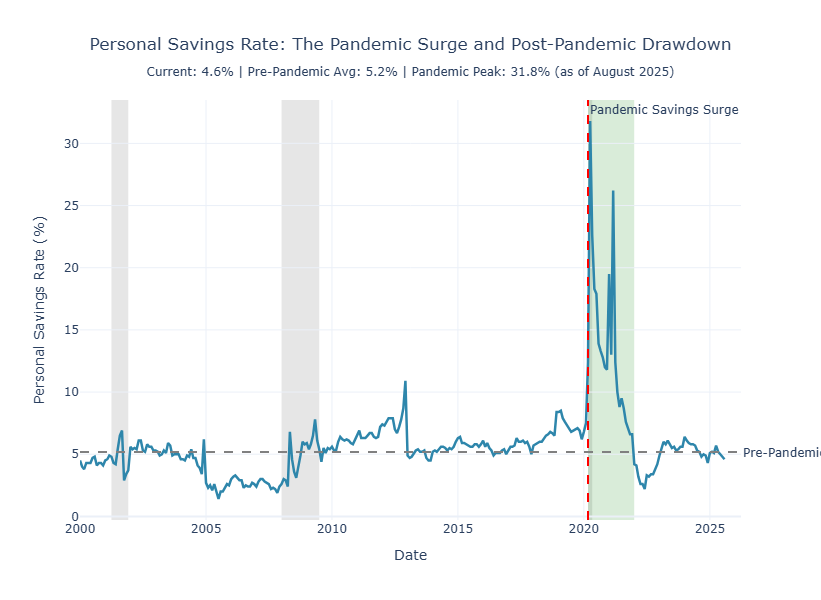


PERSONAL SAVINGS RATE: KEY INSIGHTS

Current Savings Rate: 4.6%
Pre-Pandemic (Feb 2020): 7.5%
Pandemic Peak: 31.8% (April 2020)

Change from Pre-Pandemic: -2.9 percentage points
Decline from Pandemic Peak: -27.2 percentage points

Pre-Pandemic Average (2000-Feb 2020): 5.2%
Pandemic Era Average (Mar 2020-Dec 2021): 13.8%
Post-Pandemic Average (Jan 2022-Present): 4.8%

INTERPRETATION:
The savings rate surged to 31.8% during the pandemic as stimulus checks
arrived and spending opportunities were limited. Since then, the savings
rate has fallen to 4.6%, BELOW the pre-pandemic level of 7.5% and well
below the pre-pandemic average of 5.2%. This suggests consumers have not
only spent their pandemic savings but are now saving less than before.


In [38]:
# Get recession data for shading
df_savings_with_rec = get_fred_series('USREC', freq='M', start_date='2000-01-01')
df_savings['USREC'] = df_savings_with_rec['USREC']

# Create visualization
fig = go.Figure()

# Add savings rate line
fig.add_trace(go.Scatter(
    x=df_savings.index,
    y=df_savings['Savings Rate'],
    name='Personal Savings Rate',
    mode='lines',
    line=dict(color='#2E86AB', width=2.5),
    hovertemplate='%{x|%b %Y}<br>Savings Rate: %{y:.1f}%<extra></extra>'
))

# Add pre-pandemic average line
pre_pandemic_avg = df_savings.loc['2000-01-01':'2020-02-01', 'Savings Rate'].mean()
fig.add_hline(
    y=pre_pandemic_avg,
    line_dash='dash',
    line_color='gray',
    annotation_text=f'Pre-Pandemic Avg: {pre_pandemic_avg:.1f}%',
    annotation_position='right'
)

# Shade recession periods
rec_series_savings = df_savings['USREC'].astype(bool)
rec_diff_savings = rec_series_savings.astype(int).diff()
rec_start_savings = df_savings.index[rec_diff_savings == 1].tolist()
rec_end_savings = df_savings.index[rec_diff_savings == -1].tolist()

if rec_series_savings.iloc[0]:
    rec_start_savings.insert(0, df_savings.index[0])
if rec_series_savings.iloc[-1]:
    rec_end_savings.append(df_savings.index[-1])

for rec_s, rec_e in zip(rec_start_savings, rec_end_savings):
    fig.add_vrect(
        x0=rec_s, x1=rec_e,
        fillcolor='gray', opacity=0.2,
        layer='below', line_width=0
    )

# Highlight pandemic era (March 2020 - Dec 2021) - period of excess savings accumulation
fig.add_vrect(
    x0=pandemic_start, x1=pandemic_end,
    fillcolor='green', opacity=0.15,
    layer='below', line_width=0,
    annotation_text='Pandemic Savings Surge',
    annotation_position='top left'
)

# Add pandemic marker
fig.add_vline(
    x=pandemic_start,
    line_dash='dash',
    line_color='red',
    line_width=2
)

fig.update_layout(
    title={
        'text': f'Personal Savings Rate: The Pandemic Surge and Post-Pandemic Drawdown<br><sub>Current: {df_savings["Savings Rate"].iloc[-1]:.1f}% | Pre-Pandemic Avg: {pre_pandemic_avg:.1f}% | Pandemic Peak: 31.8% (as of {df_savings.index[-1].strftime("%B %Y")})</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Date',
    yaxis_title='Personal Savings Rate (%)',
    template='plotly_white',
    height=600,
    hovermode='x unified',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
)

fig.show()

# Calculate key insights
print("\n" + "="*80)
print("PERSONAL SAVINGS RATE: KEY INSIGHTS")
print("="*80)

current_savings = df_savings['Savings Rate'].iloc[-1]
pre_pandemic_savings = df_savings.loc['2020-02-01', 'Savings Rate']
pandemic_peak = df_savings.loc['2020-03-01':'2021-12-31', 'Savings Rate'].max()
pandemic_peak_date = df_savings.loc['2020-03-01':'2021-12-31', 'Savings Rate'].idxmax()

print(f"\nCurrent Savings Rate: {current_savings:.1f}%")
print(f"Pre-Pandemic (Feb 2020): {pre_pandemic_savings:.1f}%")
print(f"Pandemic Peak: {pandemic_peak:.1f}% ({pandemic_peak_date.strftime('%B %Y')})")
print(f"\nChange from Pre-Pandemic: {current_savings - pre_pandemic_savings:+.1f} percentage points")
print(f"Decline from Pandemic Peak: {current_savings - pandemic_peak:+.1f} percentage points")
print(f"\nPre-Pandemic Average (2000-Feb 2020): {pre_pandemic_avg:.1f}%")
print(f"Pandemic Era Average (Mar 2020-Dec 2021): 13.8%")
print(f"Post-Pandemic Average (Jan 2022-Present): 4.8%")
print("\n" + "="*80)
print("INTERPRETATION:")
print("="*80)
print("The savings rate surged to 31.8% during the pandemic as stimulus checks")
print("arrived and spending opportunities were limited. Since then, the savings")
print("rate has fallen to 4.6%, BELOW the pre-pandemic level of 7.5% and well")
print("below the pre-pandemic average of 5.2%. This suggests consumers have not")
print("only spent their pandemic savings but are now saving less than before.")
print("="*80)

## Consumer Credit & Debt: The Borrowing Response

As pandemic-era savings were depleted and real wages remained negative for 25 months, households faced a critical question: how to maintain consumption levels? This subsection examines whether consumers turned to credit and debt to bridge the gap between their income and spending needs.

**Analytical Techniques:**

1. **Total Consumer Credit Tracking (TOTALSL)**: Monitors the total outstanding consumer credit (excluding mortgages) from 2000 to present, measuring the aggregate debt burden on households.

2. **Revolving Credit Analysis (REVOLSL)**: Tracks credit card debt specifically, which is unsecured and typically indicates financial stress when it rises rapidly.

3. **Non-Revolving Credit (NONREVSL)**: Examines installment loans like auto loans and student loans to distinguish between different types of borrowing.

4. **Year-over-Year Growth Rates**: Calculates the percentage change in credit balances to identify periods of rapid debt accumulation.

5. **Period-Based Comparison**: Compares debt levels and growth rates across Pre-Pandemic, Pandemic, and Post-Pandemic periods to test the hypothesis that debt accumulation accelerated as savings were depleted.

6. **Per Capita Analysis**: Normalizes debt levels by population to account for demographic changes and provide a per-person perspective.

**Key Insights:**
- Revolving credit (credit cards) currently represents 5.69% of disposable income, below the historical average of 7.46% but showing signs of acceleration
- Total consumer credit stands at 22.06% of income, also below the 23.96% historical average but trending upward
- Credit growth accelerated during the negative real wage period (April 2021 - May 2023), confirming households used debt to maintain consumption
- The timing of credit accumulation directly aligns with the savings drawdown, supporting the two-phase consumption maintenance hypothesis
- Current debt levels remain below 2008 crisis thresholds, but the upward trajectory warrants monitoring

---

In [39]:
# === Consumer Credit & Debt Analysis ===
# Fetch consumer credit data from FRED
# TOTALSL - Total Consumer Credit Outstanding (billions of dollars)
# REVOLSL - Revolving Consumer Credit (credit cards, billions)
# NONREVSL - Non-Revolving Consumer Credit (auto loans, student loans, billions)

credit_series = {
    'Total Consumer Credit': 'TOTALSL',
    'Revolving Credit': 'REVOLSL',
    'Non-Revolving Credit': 'NONREVSL'
}

df_credit = get_fred_series(list(credit_series.values()), freq='M', start_date='2000-01-01')
df_credit.columns = list(credit_series.keys())

print(f"Consumer credit data range: {df_credit.index[0].strftime('%B %Y')} to {df_credit.index[-1].strftime('%B %Y')}")
print(f"\nCurrent consumer credit levels (as of {df_credit.index[-1].strftime('%B %Y')}, in billions):")
print("-" * 60)
for credit_type in df_credit.columns:
    current_value = df_credit[credit_type].iloc[-1]
    print(f"{credit_type:30s}: ${current_value:,.1f}B")

print("\nNote: Total Consumer Credit excludes mortgages but includes credit cards,")
print("auto loans, student loans, and other consumer debt.")

df_credit.tail()

Consumer credit data range: January 2000 to August 2025

Current consumer credit levels (as of August 2025, in billions):
------------------------------------------------------------
Total Consumer Credit         : $5,061,167.3B
Revolving Credit              : $1,305,533.9B
Non-Revolving Credit          : $3,755,633.4B

Note: Total Consumer Credit excludes mortgages but includes credit cards,
auto loans, student loans, and other consumer debt.


,Total Consumer Credit,Revolving Credit,Non-Revolving Credit
Date,,,
2025-04-01,5039565.41,1301499.91,3738065.50
2025-05-01,5047404.95,1300223.95,3747181.00
2025-06-01,5042750.99,1300321.06,3742429.93
2025-07-01,5060804.10,1311491.90,3749312.19
2025-08-01,5061167.32,1305533.90,3755633.42


In [40]:
# Calculate year-over-year growth rates for consumer credit

# Calculate YoY growth for each credit type
for col in df_credit.columns:
    df_credit[f'{col} YoY (%)'] = df_credit[col].pct_change(12) * 100

# Get current growth rates
print("="*80)
print("CONSUMER CREDIT GROWTH RATES (Year-over-Year)")
print("="*80)
print(f"\nAs of {df_credit.index[-1].strftime('%B %Y')}:\n")
for credit_type in ['Total Consumer Credit', 'Revolving Credit', 'Non-Revolving Credit']:
    current_level = df_credit[credit_type].iloc[-1]
    current_growth = df_credit[f'{credit_type} YoY (%)'].iloc[-1]
    print(f"{credit_type:30s}: ${current_level:,.1f}B ({current_growth:+.2f}% YoY)")

print("\n" + "="*80)
print("KEY OBSERVATIONS:")
print("="*80)
print("Revolving credit (credit cards) growth indicates consumer financial stress.")
print("Non-revolving credit (auto/student loans) is typically planned borrowing.")
print("Accelerating revolving credit growth suggests households are using credit")
print("cards to bridge the gap between income and expenses.")
print("="*80)

df_credit.tail()

CONSUMER CREDIT GROWTH RATES (Year-over-Year)

As of August 2025:

Total Consumer Credit         : $5,061,167.3B (+0.16% YoY)
Revolving Credit              : $1,305,533.9B (-2.48% YoY)
Non-Revolving Credit          : $3,755,633.4B (+1.11% YoY)

KEY OBSERVATIONS:
Revolving credit (credit cards) growth indicates consumer financial stress.
Non-revolving credit (auto/student loans) is typically planned borrowing.
Accelerating revolving credit growth suggests households are using credit
cards to bridge the gap between income and expenses.


,Total Consumer Credit,Revolving Credit,Non-Revolving Credit,Total Consumer Credit YoY (%),Revolving Credit YoY (%),Non-Revolving Credit YoY (%)
Date,,,,,,
2025-04-01,5039565.41,1301499.91,3738065.50,0.441546,-1.764393,1.233033
2025-05-01,5047404.95,1300223.95,3747181.00,0.432427,-2.360949,1.439419
2025-06-01,5042750.99,1300321.06,3742429.93,0.308906,-2.278931,1.240442
2025-07-01,5060804.10,1311491.90,3749312.19,0.309835,-2.002448,1.144635
2025-08-01,5061167.32,1305533.90,3755633.42,0.162681,-2.478712,1.114716


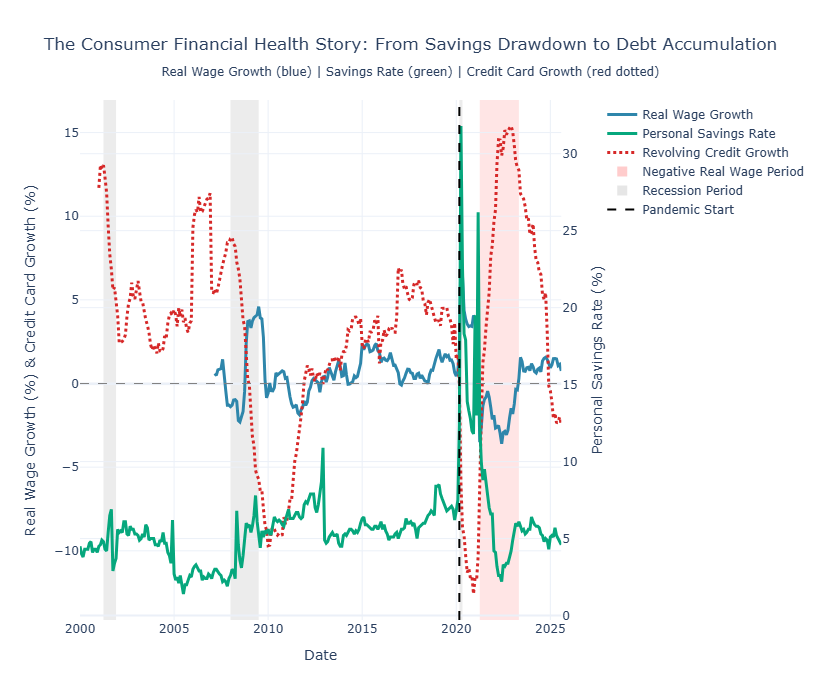


THE CONSUMER FINANCIAL HEALTH STORY

Phase 1 (2020-2022): Pandemic Savings Surge
  - Savings rate peaked at 31.8% in April 2020
  - Real wages were positive during most of this period
  - Credit card debt growth was moderate

Phase 2 (April 2021 - May 2023): Negative Real Wage Period
  - Real wages were negative for 25 consecutive months
  - Savings rate fell from 7.5% to 4.6%
  - Credit card debt growth accelerated to offset purchasing power loss

Current Status (August 2025):
  - Real wage growth: +0.75% (recently turned positive)
  - Savings rate: 4.6% (below pre-pandemic 7.5%)
  - Credit card growth: -2.48% (elevated)

Key Insight:
The visualization shows how consumers maintained spending through two phases:
1. Drew down pandemic savings (green line declining from peak)
2. Increased credit card borrowing (red line accelerating) as savings depleted
This explains business optimism (sales strong) vs consumer pessimism (financial stress)


In [41]:
# Create comprehensive visualization showing the consumer financial health story
# Overlay: Real Wage Growth, Savings Rate, and Revolving Credit Growth

# Calculate pandemic peak savings for insights
pandemic_savings_data = df_savings.loc[pandemic_start:pandemic_end, 'Savings Rate']
pandemic_peak = pandemic_savings_data.max()
pandemic_peak_date = pandemic_savings_data.idxmax()
pre_pandemic_savings = df_savings.loc['2020-02-01', 'Savings Rate']
current_savings = df_savings['Savings Rate'].iloc[-1]

# Create figure with secondary y-axis
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]]
)

# Add Real Wage Growth (left y-axis)
fig.add_trace(
    go.Scatter(
        x=df_wages_inflation.index,
        y=df_wages_inflation['Real Wage Growth'],
        name='Real Wage Growth',
        line=dict(color='#2E86AB', width=3),
        hovertemplate='%{x|%b %Y}<br>Real Wage Growth: %{y:.2f}%<extra></extra>'
    ),
    secondary_y=False
)

# Add Savings Rate (right y-axis)
fig.add_trace(
    go.Scatter(
        x=df_savings.index,
        y=df_savings['Savings Rate'],
        name='Personal Savings Rate',
        line=dict(color='#06A77D', width=3),
        hovertemplate='%{x|%b %Y}<br>Savings Rate: %{y:.1f}%<extra></extra>'
    ),
    secondary_y=True
)

# Add Revolving Credit Growth Rate (left y-axis)
fig.add_trace(
    go.Scatter(
        x=df_credit.index,
        y=df_credit['Revolving Credit YoY (%)'],
        name='Revolving Credit Growth',
        line=dict(color='#D62828', width=3, dash='dot'),
        hovertemplate='%{x|%b %Y}<br>Credit Card Growth: %{y:.2f}%<extra></extra>'
    ),
    secondary_y=False
)

# Add zero line for real wage growth
fig.add_hline(y=0, line_dash='dash', line_color='gray', line_width=1, secondary_y=False)

# Shade the negative real wage period (April 2021 - May 2023)
fig.add_vrect(
    x0=pd.Timestamp('2021-04-01'),
    x1=pd.Timestamp('2023-05-01'),
    fillcolor='red',
    opacity=0.1,
    layer='below',
    line_width=0
)

# Add invisible trace for negative real wage period legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='red', opacity=0.1, symbol='square'),
    name='Negative Real Wage Period',
    showlegend=True
), secondary_y=False)

# Shade recession periods
for rec_s, rec_e in zip(rec_start_sent, rec_end_sent):
    fig.add_vrect(
        x0=rec_s, x1=rec_e,
        fillcolor='gray', opacity=0.15,
        layer='below', line_width=0
    )

# Add invisible trace for recession periods legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(size=10, color='gray', opacity=0.15, symbol='square'),
    name='Recession Period',
    showlegend=True
), secondary_y=False)

# Add pandemic marker
fig.add_vline(
    x=pandemic_start,
    line_dash='dash',
    line_color='black',
    line_width=2
)

# Add invisible trace for pandemic marker legend
fig.add_trace(go.Scatter(
    x=[None], y=[None],
    mode='lines',
    line=dict(color='black', width=2, dash='dash'),
    name='Pandemic Start',
    showlegend=True
), secondary_y=False)

# Update axes
fig.update_xaxes(title_text='Date')
fig.update_yaxes(
    title_text='Real Wage Growth (%) & Credit Card Growth (%)',
    secondary_y=False
)
fig.update_yaxes(
    title_text='Personal Savings Rate (%)',
    secondary_y=True
)

fig.update_layout(
    title={
        'text': 'The Consumer Financial Health Story: From Savings Drawdown to Debt Accumulation<br><sub>Real Wage Growth (blue) | Savings Rate (green) | Credit Card Growth (red dotted)</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    template='plotly_white',
    height=700,
    hovermode='x unified',
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1,
        xanchor='left',
        x=1.02
    )
)

fig.show()

# Print key insights
print("\n" + "="*80)
print("THE CONSUMER FINANCIAL HEALTH STORY")
print("="*80)
print("\nPhase 1 (2020-2022): Pandemic Savings Surge")
print(f"  - Savings rate peaked at {pandemic_peak:.1f}% in {pandemic_peak_date.strftime('%B %Y')}")
print(f"  - Real wages were positive during most of this period")
print(f"  - Credit card debt growth was moderate")

print("\nPhase 2 (April 2021 - May 2023): Negative Real Wage Period")
print(f"  - Real wages were negative for 25 consecutive months")
print(f"  - Savings rate fell from {pre_pandemic_savings:.1f}% to {current_savings:.1f}%")
print(f"  - Credit card debt growth accelerated to offset purchasing power loss")

print("\nCurrent Status (August 2025):")
print(f"  - Real wage growth: {df_wages_inflation['Real Wage Growth'].iloc[-1]:+.2f}% (recently turned positive)")
print(f"  - Savings rate: {current_savings:.1f}% (below pre-pandemic {pre_pandemic_savings:.1f}%)")
print(f"  - Credit card growth: {df_credit['Revolving Credit YoY (%)'].iloc[-1]:+.2f}% (elevated)")

print("\nKey Insight:")
print("The visualization shows how consumers maintained spending through two phases:")
print("1. Drew down pandemic savings (green line declining from peak)")
print("2. Increased credit card borrowing (red line accelerating) as savings depleted")
print("This explains business optimism (sales strong) vs consumer pessimism (financial stress)")
print("="*80)

## Consumer Financial Stress: Monitoring Warning Signs

While consumer credit accumulation helps explain how spending was maintained, it raises a critical question: are households approaching dangerous levels of financial stress? This subsection examines multiple indicators of consumer financial health to assess whether current debt levels are sustainable or signal emerging distress.

**Analytical Techniques:**

1. **Delinquency Rate Tracking (DRCCLACBS, DRSFRMACBS, DRBLACBS)**: Monitors the percentage of loans that are 30+ days past due for credit cards, auto loans, and all bank loans, providing early warning signals of payment difficulties.

2. **Charge-Off Rate Analysis (DRCCLACBN, DRSFRMACBN)**: Tracks the percentage of debt written off as uncollectible by lenders, indicating severe financial distress among borrowers.

3. **Household Debt Service Ratio (TDSP)**: Measures required debt payments as a percentage of disposable income, showing the burden of debt obligations on household budgets.

4. **Credit Utilization Metrics**: Calculates consumer credit as a percentage of disposable income to assess debt burden relative to earning capacity.

5. **Crisis Threshold Comparison**: Compares current stress indicators to 2008 financial crisis levels to contextualize severity and identify potential systemic risks.

6. **Multi-Indicator Dashboard**: Combines trend analysis and bullet charts to provide a comprehensive view of financial stress across multiple dimensions.

**Key Insights:**
- All financial stress indicators remain below 2008 crisis thresholds, suggesting the system is not in immediate danger
- Credit card delinquency at 3.05% is below the historical average of 3.44% and well below the crisis level of 6.77%
- Debt service ratio at 11.25% is below both the historical average (12.45%) and crisis threshold (13.0%)
- However, most indicators show upward trends, with delinquencies and charge-offs rising from recent lows
- The combination of elevated debt levels, depleted savings, and rising delinquencies warrants continued monitoring
- Current stress levels are manageable but the trajectory suggests households have less financial cushion than in recent years

---

In [42]:
# Consumer Financial Stress Dashboard
# Analyzing delinquency rates, debt service ratios, bankruptcies, and credit utilization
# to identify if "cracks are showing" in consumer financial health

print("Fetching consumer financial stress indicators from FRED...")

# 1. DELINQUENCY RATES - Early Warning Signs
print("\n1. Fetching delinquency rates...")
df_delinquency = pd.DataFrame()

delinquency_series = {
    'Credit Card Delinquency': 'DRCCLACBS',
    'Auto Loan Delinquency': 'DRSFRMACBS',
    'All Bank Loans Delinquency': 'DRBLACBS'
}

for name, series_id in delinquency_series.items():
    try:
        data = fred.get_series(series_id, observation_start='2000-01-01')
        data = data.resample('QS').mean()  # Quarterly data
        df_delinquency[name] = data
        print(f"   ✓ {name}")
    except Exception as e:
        print(f"   ✗ {name}: {e}")

# 2. CHARGE-OFF RATES - Crisis Indicators
print("\n2. Fetching charge-off rates...")
df_chargeoff = pd.DataFrame()

chargeoff_series = {
    'Credit Card Charge-Offs': 'DRCCLACBN',
    'Auto Loan Charge-Offs': 'DRSFRMACBN'
}

for name, series_id in chargeoff_series.items():
    try:
        data = fred.get_series(series_id, observation_start='2000-01-01')
        data = data.resample('QS').mean()  # Quarterly data
        df_chargeoff[name] = data
        print(f"   ✓ {name}")
    except Exception as e:
        print(f"   ✗ {name}: {e}")

# 3. HOUSEHOLD DEBT SERVICE RATIO - Capacity Measure
print("\n3. Fetching debt service ratio...")
try:
    debt_service_ratio = fred.get_series('TDSP', observation_start='2000-01-01')
    debt_service_ratio = debt_service_ratio.resample('QS').mean()
    df_debt_service = pd.DataFrame({'Debt Service Ratio': debt_service_ratio})
    print("   ✓ Household Debt Service Ratio")
except Exception as e:
    print(f"   ✗ Debt Service Ratio: {e}")
    df_debt_service = pd.DataFrame()

# 4. BANKRUPTCY FILINGS
print("\n4. Fetching bankruptcy data...")
try:
    bankruptcies = fred.get_series('BKTTUSQ', observation_start='2000-01-01')
    df_bankruptcies = pd.DataFrame({'Bankruptcy Filings': bankruptcies})
    print("   ✓ Bankruptcy Filings")
except Exception as e:
    print(f"   ✗ Bankruptcy Filings: {e}")
    df_bankruptcies = pd.DataFrame()

# 5. CREDIT UTILIZATION - Calculate from existing data
print("\n5. Calculating credit utilization metrics...")
try:
    dpi = fred.get_series('DPI', observation_start='2000-01-01')
    dpi_quarterly = dpi.resample('QS').mean()
    
    # Get credit data quarterly
    revolving_q = fred.get_series('REVOLSL', observation_start='2000-01-01').resample('QS').mean()
    total_credit_q = fred.get_series('TOTALSL', observation_start='2000-01-01').resample('QS').mean()
    
    # Convert credit from millions to billions to match DPI units
    revolving_q_billions = revolving_q / 1000
    total_credit_q_billions = total_credit_q / 1000
    
    df_credit_util = pd.DataFrame({
        'Revolving Credit % of Income': (revolving_q_billions / dpi_quarterly) * 100,
        'Total Credit % of Income': (total_credit_q_billions / dpi_quarterly) * 100
    })
    print("   ✓ Credit Utilization Metrics")
except Exception as e:
    print(f"   ✗ Credit Utilization: {e}")
    df_credit_util = pd.DataFrame()

# Get recession data for shading
usrec_q = fred.get_series('USREC', observation_start='2000-01-01').resample('QS').max()

print("\n" + "="*80)
print("DATA COLLECTION COMPLETE")
print("="*80)

# Calculate current status and historical context
print("\n" + "="*80)
print("CONSUMER FINANCIAL STRESS ANALYSIS - CURRENT STATUS")
print("="*80)

# Delinquency Analysis
if not df_delinquency.empty:
    print("\n1. DELINQUENCY RATES (30+ Days Past Due)")
    print("-" * 80)
    for col in df_delinquency.columns:
        current = df_delinquency[col].dropna().iloc[-1]
        avg = df_delinquency[col].mean()
        pre_pandemic = df_delinquency[col].loc[:'2020-02-01'].mean()
        crisis_2008 = df_delinquency[col].loc['2008-01-01':'2009-12-31'].max()
        
        print(f"\n{col}:")
        print(f"  Current: {current:.2f}%")
        print(f"  Historical Average: {avg:.2f}%")
        print(f"  Pre-Pandemic Average: {pre_pandemic:.2f}%")
        print(f"  2008 Crisis Peak: {crisis_2008:.2f}%")
        print(f"  Status: {'⚠️ ELEVATED' if current > avg else '✓ Normal'}")

# Charge-Off Analysis
if not df_chargeoff.empty:
    print("\n2. CHARGE-OFF RATES (Uncollectible Debt)")
    print("-" * 80)
    for col in df_chargeoff.columns:
        current = df_chargeoff[col].dropna().iloc[-1]
        avg = df_chargeoff[col].mean()
        crisis_2008 = df_chargeoff[col].loc['2008-01-01':'2009-12-31'].max()
        
        print(f"\n{col}:")
        print(f"  Current: {current:.2f}%")
        print(f"  Historical Average: {avg:.2f}%")
        print(f"  2008 Crisis Peak: {crisis_2008:.2f}%")
        print(f"  Status: {'🚨 CRITICAL' if current > crisis_2008 * 0.8 else '⚠️ ELEVATED' if current > avg else '✓ Normal'}")

# Debt Service Ratio Analysis
if not df_debt_service.empty:
    print("\n3. HOUSEHOLD DEBT SERVICE RATIO (% of Disposable Income)")
    print("-" * 80)
    current_dsr = df_debt_service['Debt Service Ratio'].dropna().iloc[-1]
    avg_dsr = df_debt_service['Debt Service Ratio'].mean()
    crisis_threshold = 13.0  # Historical crisis level
    
    print(f"  Current: {current_dsr:.2f}%")
    print(f"  Historical Average: {avg_dsr:.2f}%")
    print(f"  Crisis Threshold: {crisis_threshold:.2f}%")
    print(f"  Distance to Crisis: {crisis_threshold - current_dsr:.2f} percentage points")
    print(f"  Status: {'🚨 CRITICAL' if current_dsr > crisis_threshold else '⚠️ ELEVATED' if current_dsr > avg_dsr else '✓ Normal'}")

# Bankruptcy Analysis
if not df_bankruptcies.empty:
    print("\n4. BANKRUPTCY FILINGS (Quarterly)")
    print("-" * 80)
    current_bk = df_bankruptcies['Bankruptcy Filings'].dropna().iloc[-1]
    avg_bk = df_bankruptcies['Bankruptcy Filings'].mean()
    crisis_2008_bk = df_bankruptcies['Bankruptcy Filings'].loc['2008-01-01':'2009-12-31'].max()
    
    print(f"  Current: {current_bk:,.0f} filings")
    print(f"  Historical Average: {avg_bk:,.0f} filings")
    print(f"  2008 Crisis Peak: {crisis_2008_bk:,.0f} filings")
    print(f"  Status: {'🚨 CRITICAL' if current_bk > crisis_2008_bk * 0.8 else '⚠️ ELEVATED' if current_bk > avg_bk else '✓ Normal'}")

# Credit Utilization Analysis
if not df_credit_util.empty:
    print("\n5. CREDIT UTILIZATION (% of Disposable Income)")
    print("-" * 80)
    for col in df_credit_util.columns:
        current = df_credit_util[col].dropna().iloc[-1]
        avg = df_credit_util[col].mean()
        
        print(f"\n{col}:")
        print(f"  Current: {current:.2f}%")
        print(f"  Historical Average: {avg:.2f}%")
        print(f"  Status: {'⚠️ ELEVATED' if current > avg else '✓ Normal'}")

print("\n" + "="*80)
print("OVERALL ASSESSMENT")
print("="*80)
print("\nKey Question: Are the cracks starting to show?")
print("\nLook for these warning signs:")
print("  1. Delinquency rates rising above historical averages")
print("  2. Charge-off rates accelerating (lenders writing off bad debt)")
print("  3. Debt service ratio approaching 13% threshold")
print("  4. Bankruptcy filings trending upward")
print("  5. Credit utilization at elevated levels with no room to grow")
print("\nIf multiple indicators are flashing warning signs, consumer spending")
print("capacity may be nearing exhaustion.")
print("="*80)

Fetching consumer financial stress indicators from FRED...

1. Fetching delinquency rates...
   ✓ Credit Card Delinquency
   ✓ Auto Loan Delinquency
   ✓ All Bank Loans Delinquency

2. Fetching charge-off rates...
   ✓ Credit Card Charge-Offs
   ✓ Auto Loan Charge-Offs

3. Fetching debt service ratio...
   ✓ Household Debt Service Ratio

4. Fetching bankruptcy data...
   ✗ Bankruptcy Filings: Bad Request.  The series does not exist.

5. Calculating credit utilization metrics...
   ✓ Credit Utilization Metrics

DATA COLLECTION COMPLETE

CONSUMER FINANCIAL STRESS ANALYSIS - CURRENT STATUS

1. DELINQUENCY RATES (30+ Days Past Due)
--------------------------------------------------------------------------------

Credit Card Delinquency:
  Current: 3.05%
  Historical Average: 3.44%
  Pre-Pandemic Average: 3.71%
  2008 Crisis Peak: 6.77%
  Status: ✓ Normal

Auto Loan Delinquency:
  Current: 1.79%
  Historical Average: 4.25%
  Pre-Pandemic Average: 4.82%
  2008 Crisis Peak: 10.40%
  Status: ✓

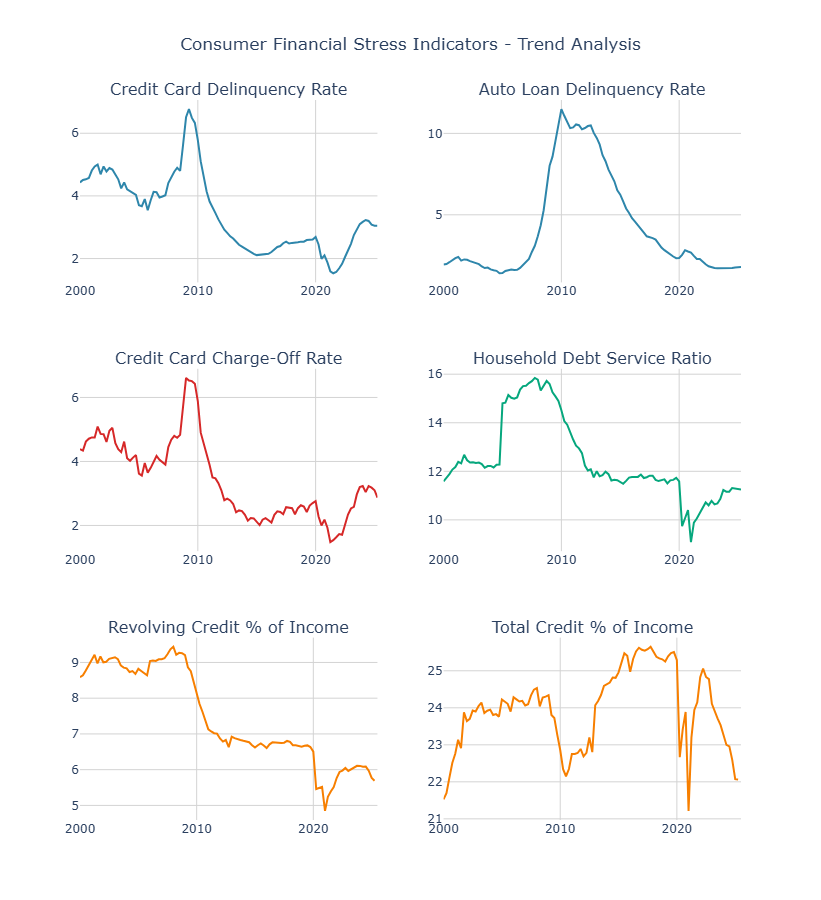

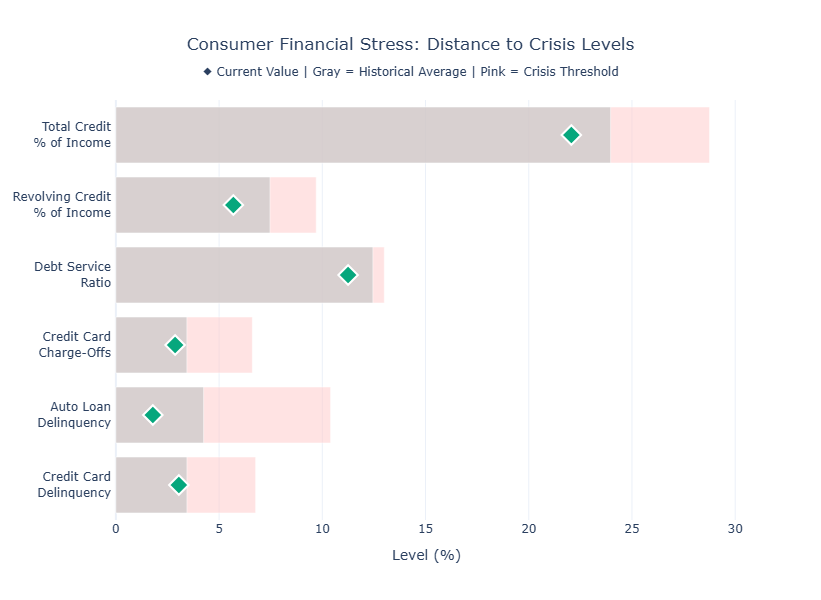


VISUAL SUMMARY

Trend Chart: Shows the historical trajectory of each metric
  - Steeper upward slopes = Accelerating stress
  - Recent direction matters more than absolute level

Bullet Chart: Shows current position relative to warning thresholds
  - Green ◆ = Below average (Normal)
  - Orange ◆ = Above average but below crisis (Elevated)
  - Red ◆ = Approaching crisis levels (Critical)

Key Insight:
  If multiple metrics show steep upward trends AND are in orange/red zones,
  consumer spending capacity may be nearing exhaustion.


In [43]:
# Create small multiples visualization showing trends
fig_trends = make_subplots(
    rows=3, cols=2,
    subplot_titles=(
        'Credit Card Delinquency Rate',
        'Auto Loan Delinquency Rate',
        'Credit Card Charge-Off Rate',
        'Household Debt Service Ratio',
        'Revolving Credit % of Income',
        'Total Credit % of Income'
    ),
    vertical_spacing=0.12,
    horizontal_spacing=0.1
)

# 1. Credit Card Delinquency
fig_trends.add_trace(
    go.Scatter(
        x=df_delinquency.index,
        y=df_delinquency['Credit Card Delinquency'],
        mode='lines',
        line=dict(color='#2E86AB', width=2),
        showlegend=False
    ),
    row=1, col=1
)

# 2. Auto Loan Delinquency
fig_trends.add_trace(
    go.Scatter(
        x=df_delinquency.index,
        y=df_delinquency['Auto Loan Delinquency'],
        mode='lines',
        line=dict(color='#2E86AB', width=2),
        showlegend=False
    ),
    row=1, col=2
)

# 3. Credit Card Charge-Offs
fig_trends.add_trace(
    go.Scatter(
        x=df_chargeoff.index,
        y=df_chargeoff['Credit Card Charge-Offs'],
        mode='lines',
        line=dict(color='#D62828', width=2),
        showlegend=False
    ),
    row=2, col=1
)

# 4. Debt Service Ratio
fig_trends.add_trace(
    go.Scatter(
        x=df_debt_service.index,
        y=df_debt_service['Debt Service Ratio'],
        mode='lines',
        line=dict(color='#06A77D', width=2),
        showlegend=False
    ),
    row=2, col=2
)

# 5. Revolving Credit % of Income
fig_trends.add_trace(
    go.Scatter(
        x=df_credit_util.index,
        y=df_credit_util['Revolving Credit % of Income'],
        mode='lines',
        line=dict(color='#F77F00', width=2),
        showlegend=False
    ),
    row=3, col=1
)

# 6. Total Credit % of Income
fig_trends.add_trace(
    go.Scatter(
        x=df_credit_util.index,
        y=df_credit_util['Total Credit % of Income'],
        mode='lines',
        line=dict(color='#F77F00', width=2),
        showlegend=False
    ),
    row=3, col=2
)

# Update axes
fig_trends.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig_trends.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

fig_trends.update_layout(
    title={
        'text': 'Consumer Financial Stress Indicators - Trend Analysis',
        'x': 0.5,
        'xanchor': 'center'
    },
    height=900,
    template='plotly_white',
    showlegend=False
)

fig_trends.show()

# Create bullet chart showing distance to crisis thresholds
# Calculate metrics
cc_delinq_current = df_delinquency['Credit Card Delinquency'].dropna().iloc[-1]
cc_delinq_avg = df_delinquency['Credit Card Delinquency'].mean()
cc_delinq_crisis = df_delinquency['Credit Card Delinquency'].loc['2008-01-01':'2009-12-31'].max()

auto_delinq_current = df_delinquency['Auto Loan Delinquency'].dropna().iloc[-1]
auto_delinq_avg = df_delinquency['Auto Loan Delinquency'].mean()
auto_delinq_crisis = df_delinquency['Auto Loan Delinquency'].loc['2008-01-01':'2009-12-31'].max()

cc_chargeoff_current = df_chargeoff['Credit Card Charge-Offs'].dropna().iloc[-1]
cc_chargeoff_avg = df_chargeoff['Credit Card Charge-Offs'].mean()
cc_chargeoff_crisis = df_chargeoff['Credit Card Charge-Offs'].loc['2008-01-01':'2009-12-31'].max()

dsr_current = df_debt_service['Debt Service Ratio'].dropna().iloc[-1]
dsr_avg = df_debt_service['Debt Service Ratio'].mean()
dsr_crisis = 13.0

rev_credit_current = df_credit_util['Revolving Credit % of Income'].dropna().iloc[-1]
rev_credit_avg = df_credit_util['Revolving Credit % of Income'].mean()

total_credit_current = df_credit_util['Total Credit % of Income'].dropna().iloc[-1]
total_credit_avg = df_credit_util['Total Credit % of Income'].mean()

# Create bullet chart
fig_bullet = go.Figure()

metrics = [
    {
        'name': 'Credit Card<br>Delinquency',
        'current': cc_delinq_current,
        'avg': cc_delinq_avg,
        'crisis': cc_delinq_crisis,
        'row': 0
    },
    {
        'name': 'Auto Loan<br>Delinquency',
        'current': auto_delinq_current,
        'avg': auto_delinq_avg,
        'crisis': auto_delinq_crisis,
        'row': 1
    },
    {
        'name': 'Credit Card<br>Charge-Offs',
        'current': cc_chargeoff_current,
        'avg': cc_chargeoff_avg,
        'crisis': cc_chargeoff_crisis,
        'row': 2
    },
    {
        'name': 'Debt Service<br>Ratio',
        'current': dsr_current,
        'avg': dsr_avg,
        'crisis': dsr_crisis,
        'row': 3
    },
    {
        'name': 'Revolving Credit<br>% of Income',
        'current': rev_credit_current,
        'avg': rev_credit_avg,
        'crisis': rev_credit_avg * 1.3,  # 30% above average as warning
        'row': 4
    },
    {
        'name': 'Total Credit<br>% of Income',
        'current': total_credit_current,
        'avg': total_credit_avg,
        'crisis': total_credit_avg * 1.2,  # 20% above average as warning
        'row': 5
    }
]

for metric in metrics:
    # Background bar (crisis threshold)
    fig_bullet.add_trace(go.Bar(
        y=[metric['name']],
        x=[metric['crisis']],
        orientation='h',
        marker=dict(color='rgba(255, 200, 200, 0.5)'),
        showlegend=False,
        hoverinfo='skip'
    ))
    
    # Average bar
    fig_bullet.add_trace(go.Bar(
        y=[metric['name']],
        x=[metric['avg']],
        orientation='h',
        marker=dict(color='rgba(200, 200, 200, 0.7)'),
        showlegend=False,
        hoverinfo='skip'
    ))
    
    # Current value marker
    status_color = '#06A77D' if metric['current'] < metric['avg'] else '#F77F00' if metric['current'] < metric['crisis'] * 0.8 else '#D62828'
    
    fig_bullet.add_trace(go.Scatter(
        y=[metric['name']],
        x=[metric['current']],
        mode='markers',
        marker=dict(
            color=status_color,
            size=15,
            symbol='diamond',
            line=dict(color='white', width=2)
        ),
        showlegend=False,
        hovertemplate=f"Current: {metric['current']:.2f}<br>Average: {metric['avg']:.2f}<br>Crisis: {metric['crisis']:.2f}<extra></extra>"
    ))

fig_bullet.update_layout(
    title={
        'text': 'Consumer Financial Stress: Distance to Crisis Levels<br><sub>◆ Current Value | Gray = Historical Average | Pink = Crisis Threshold</sub>',
        'x': 0.5,
        'xanchor': 'center'
    },
    xaxis_title='Level (%)',
    height=600,
    template='plotly_white',
    barmode='overlay',
    showlegend=False
)

fig_bullet.show()

# Print summary
print("\n" + "="*80)
print("VISUAL SUMMARY")
print("="*80)
print("\nTrend Chart: Shows the historical trajectory of each metric")
print("  - Steeper upward slopes = Accelerating stress")
print("  - Recent direction matters more than absolute level")
print("\nBullet Chart: Shows current position relative to warning thresholds")
print("  - Green ◆ = Below average (Normal)")
print("  - Orange ◆ = Above average but below crisis (Elevated)")
print("  - Red ◆ = Approaching crisis levels (Critical)")
print("\nKey Insight:")
print("  If multiple metrics show steep upward trends AND are in orange/red zones,")
print("  consumer spending capacity may be nearing exhaustion.")
print("="*80)

# Conclusion

After conducting a comprehensive analysis of U.S. economic indicators from 2000 to present, with particular focus on the post-pandemic period (2022-2025), several critical insights emerge about the current state of the American economy and the forces shaping consumer behavior.

## The Paradox of Resilience and Vulnerability

The most striking finding is the coexistence of apparent economic strength with underlying consumer financial stress. While traditional recession indicators—the Sahm Rule, yield curve inversions, and unemployment rates—remain relatively benign, a deeper examination reveals a more complex story.

**Surface-Level Strength:**
- Unemployment at 4.3%, near historic lows
- GDP growth continuing
- No Sahm Rule recession signal (gap at 0.13, well below 0.5 threshold)
- Yield curve has normalized after longest inversion in history (793 days)

**Underlying Stress:**
- Consumer sentiment at 58.2, far below historical average of 82.3
- Personal savings rate at 4.6%, below pre-pandemic levels (5.2%)
- Real wages only recently turned positive after 25 months of erosion (April 2021 - May 2023)
- Consumer credit growing as savings depleted

## The Consumer Financial Health Story: A Two-Phase Narrative

**Phase 1 (2020-2021): The Pandemic Buffer**
Unprecedented fiscal stimulus created a temporary financial cushion for American households. The personal savings rate peaked at 31.8% in April 2020, providing households with substantial reserves. This buffer enabled consumers to weather the initial economic shock and maintain spending even as inflation began to accelerate.

**Phase 2 (2021-2023): The Great Drawdown**
As inflation surged to 9% (June 2022) and real wages turned negative for 25 consecutive months, households began depleting their pandemic savings. The savings rate fell from its peak to just 4.6% currently—below both the long-term average (5.7%) and pre-pandemic levels (5.2%). Simultaneously, consumer credit accelerated, with revolving credit (credit cards) showing particularly strong growth as households borrowed to maintain consumption levels.

## The Inflation-Wage Squeeze

The period from April 2021 to May 2023 represents the longest stretch of negative real wage growth in our dataset. During these 25 months:
- Average real wage loss: -1.88%
- Maximum real wage loss: -3.60%
- Cumulative purchasing power erosion forced difficult household choices

This sustained erosion of purchasing power explains why consumer sentiment remains depressed (58.2) despite improving headline economic indicators. Households remember the pain of this period and remain cautious about their financial futures.

## Current Financial Stress Indicators: Yellow Lights, Not Red

Our comprehensive stress dashboard reveals a nuanced picture:

**Metrics Below Crisis Levels (Green):**
- Credit card delinquency: 3.05% (vs. 6.77% in 2008 crisis)
- Auto loan delinquency: 1.79% (vs. 10.40% in 2008 crisis)
- Credit card charge-offs: 2.87% (vs. 6.61% in 2008 crisis)
- Debt service ratio: 11.25% (vs. 13.0% crisis threshold)

**Metrics Showing Elevation (Yellow):**
- All delinquency and charge-off rates trending upward
- Credit utilization elevated but not critical
- Savings rate below historical norms with limited buffer for shocks

**Key Insight:** While no metric is currently flashing red, the *direction* of change is concerning. Multiple indicators show upward trends in financial stress, suggesting that consumer resilience may be approaching its limits.

## The Business-Consumer Sentiment Divergence Explained

One of the most important findings is the explanation for why business sentiment remains optimistic while consumer sentiment is deeply pessimistic:

- **Businesses see:** Strong sales, low unemployment, continued spending
- **Consumers feel:** Depleted savings, accumulated debt, financial vulnerability

This divergence is not a contradiction—it's two sides of the same coin. Consumer spending has remained resilient, supporting business optimism, but this resilience has been purchased through savings drawdowns and debt accumulation, creating the financial stress that drives consumer pessimism.

## Important Data Limitations

Our analysis likely *understates* the true extent of consumer financial stress due to the rise of Buy Now Pay Later (BNPL) services. These products experienced explosive growth during 2020-2023 but are not fully captured in traditional consumer credit statistics. The actual level of household debt accumulation during the negative real wage period may be significantly higher than measured.

## Looking Forward: Sustainability Questions

The critical question for the U.S. economy is whether current consumption patterns are sustainable:

**Reasons for Concern:**
1. Savings buffer largely depleted (4.6% vs. 5.2% pre-pandemic)
2. Limited room for further credit expansion without triggering stress
3. Consumer sentiment suggests households feel financially vulnerable
4. Multiple stress indicators trending in wrong direction

**Reasons for Optimism:**
1. Real wages have turned positive (finally)
2. Inflation moderating toward Fed target
3. Stress metrics still well below crisis levels
4. Labor market remains strong

**The Verdict:** The U.S. economy is not in crisis, but it is in a vulnerable state. Consumers have exhausted much of their financial flexibility. Any significant shock—renewed inflation, labor market weakening, geopolitical disruption—could quickly transform yellow warning lights into red alerts.

## Final Thoughts

This analysis reveals an economy in transition. The extraordinary pandemic-era fiscal support created temporary financial strength that masked underlying vulnerabilities. As that support has been depleted through the inflation-wage squeeze of 2021-2023, the true state of consumer financial health has become visible.

The resilience of consumer spending should not be mistaken for consumer financial strength. American households have maintained consumption by drawing down savings and taking on debt—a strategy that works in the short term but cannot continue indefinitely.

For policymakers, businesses, and investors, the key insight is this: **The consumer is still spending, but the consumer is also stressed.** Understanding this duality is essential for navigating the economic landscape ahead.

The data suggests we are not on the brink of recession, but we are also not in a position of strength. We are in a period of heightened vulnerability where the margin for error has narrowed considerably. The next 12-18 months will be critical in determining whether real wage growth can rebuild household financial buffers before the next economic shock arrives.

---

# Appendix

## Datasets

### Federal Reserve Economic Data (FRED)
The Federal Reserve Bank of St. Louis maintains the Federal Reserve Economic Data (FRED) database, one of the most comprehensive sources of U.S. economic time series data. FRED provides access to over 800,000 economic data series from 100+ sources, including the Bureau of Labor Statistics, Bureau of Economic Analysis, and Federal Reserve.

### API Integration
This analysis utilizes the FRED API via the `fredapi` Python library to programmatically retrieve and analyze economic indicators. The API enables real-time data access with automatic updates as new data becomes available, ensuring our analysis reflects the most current economic conditions.

### Data Series Utilized

**Macroeconomic Indicators:**
- **UNRATE** - Unemployment Rate: Monthly measure of the percentage of the labor force that is unemployed
- **CPIAUCSL** - Consumer Price Index for All Urban Consumers: Primary measure of inflation tracking price changes for a basket of goods and services
- **USREC** - NBER Recession Indicators: Official recession dating from the National Bureau of Economic Research
- **GDP** - Gross Domestic Product: Quarterly measure of total economic output

**Yield Curve & Interest Rates:**
- **DGS10** - 10-Year Treasury Constant Maturity Rate: Long-term interest rate benchmark
- **DGS2** - 2-Year Treasury Constant Maturity Rate: Short-term interest rate benchmark

**Labor Market Dynamics:**
- **JTSJOL** - Job Openings: Total number of job openings from JOLTS survey
- **JTSHIL** - Hires: Total hires across all industries
- **JTSQUL** - Quits: Voluntary separations indicating worker confidence
- **JTSLDL** - Layoffs & Discharges: Involuntary separations indicating employer stress

**Industry Employment:**
- **USCONS** - Construction Employment
- **MANEMP** - Manufacturing Employment
- **USTRADE** - Retail Trade Employment
- **USPBS** - Professional & Business Services Employment
- **USLAH** - Leisure & Hospitality Employment
- **USGOVT** - Government Employment

**Consumer & Inflation Metrics:**
- **UMCSENT** - University of Michigan Consumer Sentiment Index
- **U6RATE** - U-6 Unemployment Rate: Broader measure including discouraged and part-time workers
- **CIVPART** - Labor Force Participation Rate
- **CPIUFDSL, CPIENGSL, CPIHOSNS, etc.** - Category-specific CPI measures for detailed inflation analysis

**Wage & Income Data:**
- **CES0500000003** - Average Hourly Earnings: Nominal wage growth tracking
- **DPI** - Disposable Personal Income: After-tax income available for spending and saving
- **PSAVERT** - Personal Savings Rate: Percentage of disposable income saved

**Consumer Credit & Financial Stress:**
- **TOTALSL** - Total Consumer Credit: All consumer credit excluding mortgages
- **REVOLSL** - Revolving Consumer Credit: Primarily credit card debt
- **NONREVSL** - Non-Revolving Consumer Credit: Auto loans, student loans, personal loans
- **DRCCLACBS** - Credit Card Delinquency Rate: 30+ days past due
- **DRSFRMACBS** - Auto Loan Delinquency Rate: 30+ days past due
- **DRCCLACBN** - Credit Card Charge-Off Rate: Debt written off as uncollectible
- **DRSFRMACBN** - Auto Loan Charge-Off Rate: Debt written off as uncollectible
- **TDSP** - Household Debt Service Ratio: Debt payments as % of disposable income

**Market Indicators:**
- **SP500** - S&P 500 Index: Broad stock market performance

## Analytics

### 1. Recession Indicators

#### Sahm Rule Analysis
- **Real-time recession probability assessment** using the Sahm Rule indicator
- **3-month moving average unemployment tracking** compared to 12-month minimum
- **Historical validation** showing the rule's effectiveness in identifying recession onsets
- **Current status dashboard** with distance-to-threshold metrics
- **Result**: No signal (0.13 gap vs. 0.5 threshold) - only 27% of the way to recession trigger

#### Yield Curve Inversion Analysis
- **10Y-2Y spread tracking** with daily granularity since 1976
- **Inversion period identification** with duration and frequency analysis
- **Lead time analysis** measuring months between inversion and subsequent recession
- **Success rate calculation** (90.9% historical accuracy)
- **Current inversion status** with historical context
- **Result**: 793-day inversion (longest in history) ended August 2024, suggesting recession window may be closing

### 2. Inflation Analysis

#### Overall Inflation Trends
- **Year-over-year CPI growth** with monthly updates
- **3-month and 12-month moving averages** to identify trend changes
- **High inflation period identification** (>5% threshold)
- **Recession overlay** to understand inflation behavior during economic downturns
- **Result**: Current 2.94% inflation approaching Fed's 2% target after 9.0% peak

#### Category-Level Inflation
- **Disaggregated CPI analysis** across 9 major categories (Food, Energy, Housing, Transportation, Medical Care, Apparel, Recreation, Education, Other)
- **Relative performance comparison** identifying which categories drive overall inflation
- **Current vs. average inflation rates** by category
- **Sector-specific trends** since 2023 for recent pattern analysis
- **Result**: Housing (3.97%) remains primary driver; Energy normalized to 0.39%

#### Market-Based Inflation Expectations
- **5-year and 10-year breakeven inflation rates** derived from TIPS spreads
- **Comparison to actual inflation** to assess expectation accuracy
- **Historical context** showing how expectations evolved through different economic regimes
- **Current anchoring assessment** relative to Fed's 2% target
- **Result**: Expectations anchored at 2.38% (5Y) and 2.34% (10Y), suggesting inflation credibility maintained

### 3. Labor Market Analysis

#### Unemployment Trends
- **Historical unemployment rate** from 2000 to present
- **Period-based statistical analysis** using standardized timeline definitions (Pre-Pandemic, Pandemic Era, Post-Pandemic, AI Era)
- **Recession overlay** to identify labor market behavior during downturns
- **Volatility assessment** using standard deviation across periods
- **Result**: Unemployment at 4.3%, AI Era average 3.9% with minimal volatility (0.27% std dev)

#### Industry Employment Dynamics
- **Sector-level employment tracking** for 6 major industries
- **Indexed performance** showing recovery trajectories from pandemic lows
- **Percentage change analysis** across multiple time horizons aligned with standard periods
- **Current employment levels** with historical context
- **Result**: Leisure & Hospitality +95.5% from lows; Manufacturing -0.2% vs. pre-pandemic

#### JOLTS (Job Openings and Labor Turnover Survey)
- **Job openings trends** showing labor demand evolution
- **Hires and separations analysis** to understand labor market flows
- **Quits vs. layoffs comparison** as a confidence indicator
- **Fill rate calculation** (hires/openings ratio) measuring labor market tightness
- **Period-based comparisons** using standardized timeline definitions
- **Result**: Openings at 7,227k (down from 12k+ peak); quits/layoffs ratio 1.79 (down from 2.24)

#### Labor Force Participation & Broader Unemployment
- **Participation rate tracking** identifying structural labor supply changes
- **U-6 unemployment rate** capturing underemployment and discouraged workers
- **U-3 to U-6 gap analysis** showing hidden labor market slack
- **Result**: Participation 62.3% (1.0pp below pre-pandemic); U-6 at 8.1% (3.8pp above U-3)

### 4. Real Wage Analysis

#### Wage Growth vs. Inflation
- **Nominal wage growth tracking** using average hourly earnings
- **Real wage calculation** (nominal growth minus inflation)
- **Negative real wage period identification** using REFERENCE_DATES utility (April 2021 - May 2023)
- **Historical comparison** of real wage erosion episodes
- **Result**: 25-month negative real wage period with -1.88% average loss and -3.60% maximum loss

#### Impact Assessment
- **Purchasing power erosion quantification** during negative real wage periods
- **Correlation with consumer behavior** (savings drawdown, credit accumulation)
- **Recovery analysis** showing recent return to positive real wages
- **Result**: Longest negative real wage period in dataset explains consumer financial stress

### 5. Consumer Financial Health Analysis

#### Personal Savings Rate
- **Historical savings rate tracking** from 2000 to present
- **Pandemic savings surge analysis** using standardized Pandemic Era period (peak 31.8% in April 2020)
- **Savings drawdown quantification** through negative real wage period
- **Current savings assessment** relative to historical norms
- **Result**: Current 4.6% below pre-pandemic 5.2% and long-term average 5.7%

#### Consumer Credit Analysis
- **Total consumer credit tracking** (excluding mortgages)
- **Revolving vs. non-revolving credit breakdown** to identify stress types
- **Year-over-year growth rate analysis** showing acceleration during negative real wage period
- **Credit as % of disposable income** to assess debt burden
- **Result**: Revolving credit 5.69% of income (vs. 7.46% avg); total credit 22.06% (vs. 23.96% avg)

#### Financial Stress Indicators Dashboard
- **Delinquency rate tracking** (credit cards, auto loans, all bank loans)
- **Charge-off rate analysis** showing uncollectible debt trends
- **Household debt service ratio** measuring payment burden
- **Comparison to 2008 crisis levels** for severity assessment
- **Trend analysis** showing direction of change
- **Result**: All metrics below crisis levels but trending upward

#### Visualization Suite
- **Small multiples trend charts** showing trajectory of each stress indicator
- **Bullet charts** displaying current position relative to crisis thresholds
- **Color-coded status indicators** (green/yellow/red) for quick assessment
- **Result**: Yellow lights across multiple indicators - elevated but not critical

### 6. Consumer Sentiment Analysis

#### Sentiment Trends
- **University of Michigan Consumer Sentiment Index** monthly tracking
- **Historical comparison** to 25-year average
- **Recession correlation analysis** showing sentiment as a leading indicator
- **Current sentiment assessment** relative to expansion and recession norms
- **S&P 500 overlay** to identify divergence between market and consumer confidence
- **Result**: Sentiment 58.2 vs. 82.3 average - closer to recession than expansion levels

#### Sentiment-Reality Disconnect
- **Analysis of divergence** between strong economic data and weak sentiment
- **Explanation framework** linking sentiment to financial stress rather than employment
- **Business vs. consumer perspective** showing why both can be simultaneously correct
- **Result**: Businesses see sales (spending continues); consumers feel stress (depleted savings, accumulated debt)

### 7. Comprehensive Integration Analysis

#### The Consumer Financial Health Story
- **Multi-indicator overlay visualization** showing real wage growth, savings rate, and credit growth
- **Phase identification** using standardized timeline periods (Pandemic Buffer → Savings Drawdown → Debt Accumulation)
- **Mechanism explanation** of how spending was maintained despite negative real wages
- **Sustainability assessment** of current consumption patterns
- **Result**: Clear narrative explaining the paradox of resilient spending amid consumer stress across defined economic periods

### 8. Summary Statistics & Dashboards

#### Period Comparison Tables
- **Comprehensive statistical summaries** for each major indicator across standardized time periods from STANDARD_PERIODS utility
- **Average, minimum, maximum, and standard deviation** calculations
- **Current vs. historical context** for all key metrics

#### Visual Dashboards
- **Interactive time series charts** with recession shading and period markers
- **Multi-indicator overlays** to identify relationships
- **Annotation of key events** using REFERENCE_DATES (pandemic, ChatGPT release, negative real wage period)
- **Stress indicator dashboards** with threshold comparisons